In [53]:
import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir)

In [54]:
import matplotlib.pyplot as plt
from BasicSetupUtilities.MetaDataBuilder import CountryMetaDataFile
from DataIOUtilities.DataLib import DataLib, DatastreamPulls
import pandas as pd
import numpy as np
from scipy.stats import gmean
from scipy.optimize import minimize
from scipy.optimize import LinearConstraint
from scipy.optimize import Bounds
import plotly.express as px
import seaborn as sns
#from pandas.plotting import register_matplotlib_converters
#register_matplotlib_converters()
plt.rcParams['figure.dpi'] = 100

In [55]:
from tqdm import tqdm_notebook as tqdm

In [56]:
dl = DataLib("SignalData")

bondReturnIndex = dl.pull('BondRetIdx/LocalFX')

countries = ['USA', 'AUS', 'JPN', 'CAN', 'CHE', 'GBR', 'ESP', 'FRA', 'ITA', 'DEU']

In [57]:
def period_return(series):
    startPrice = series[0]
    endPrice = series[-1]
    ret = (endPrice - startPrice)/startPrice
    return ret
hedgedReturnsQuarterly = bondReturnIndex.resample('1Q').apply(period_return)

#pd.options.display.float_format = '{:,.7f}'.format


In [58]:
threeMonthRates = dl.pull("threeMonthRate").resample('1B').ffill()/100
threeMonthDailyEffective = (1+threeMonthRates) ** (1/261) - 1

hedgedReturnsDaily = bondReturnIndex.pct_change()

for country in countries:
    threeMonthDailyEffective[country] = threeMonthDailyEffective['USA']

hedgedReturnsDaily = hedgedReturnsDaily - threeMonthDailyEffective

In [59]:
green = "#1dd1a1"
blue = "#48dbfb"
red = "#ff6b6b"
slate = "#222f3e"
purple = "#5f27cd"
pink = "#ff9ff3"
orange = "#ff9f43"
turquoise = "#00d2d3"
lightblue = "#89C4F4"
grey = "#757D75"

## Note: All indicators are reported as z-scores. The z-scores are then converted to actual long or short positions (values between -1 and 1) by the getPosition() function.

# Current Account / GDP

### I computed 4 year x 1 year rolling mean for current account/GDP to capture smoothed change over time. CA/GDP captures both potential for future interest rate increases and FX depreciations. If time permits, I may try to incorporate foreign currency reserve data from the IMF to capture the degree to which a given currency acts as a reserve currency.

In [60]:
def getChange(series):
    start = series[0]
    end = series[-1]
    change = (end - start)
    return change

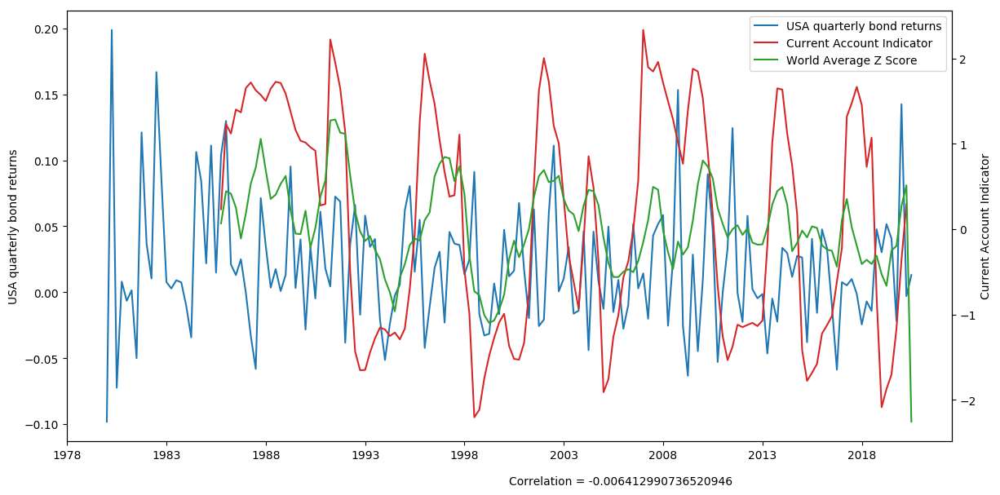

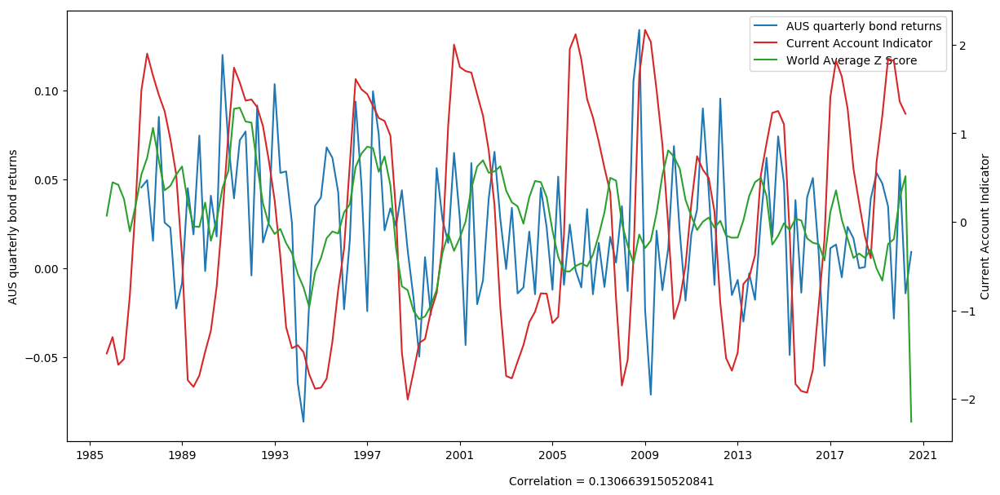

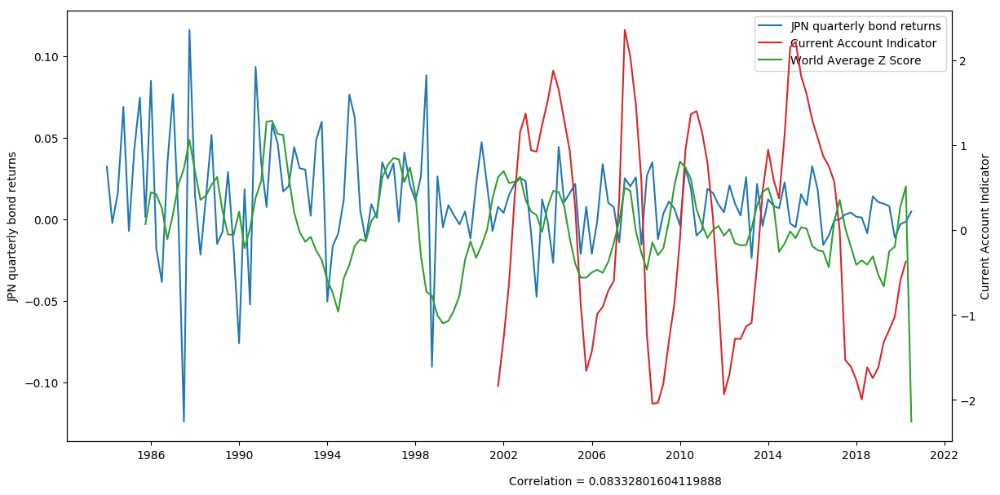

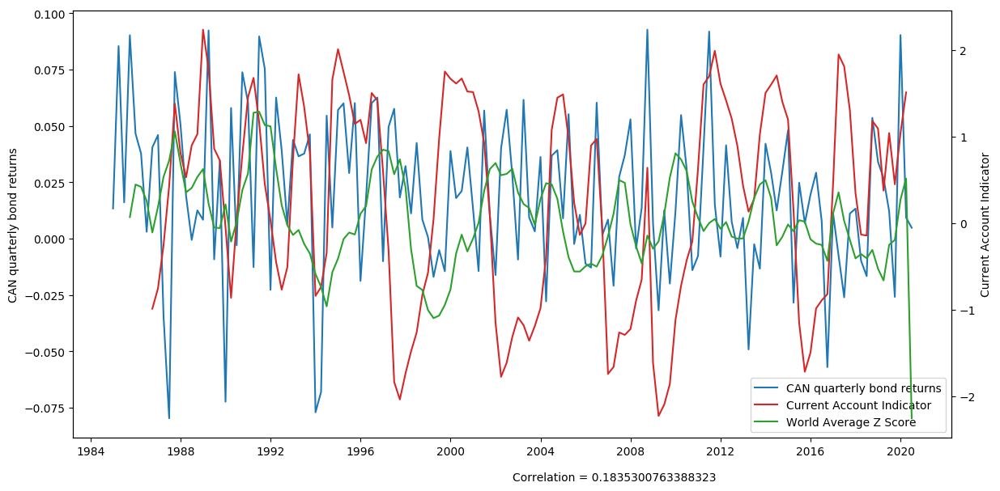

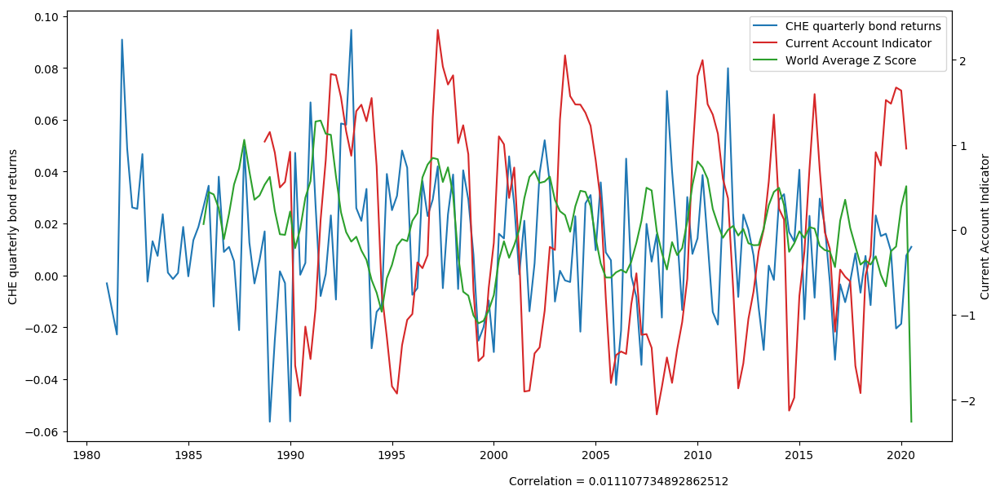

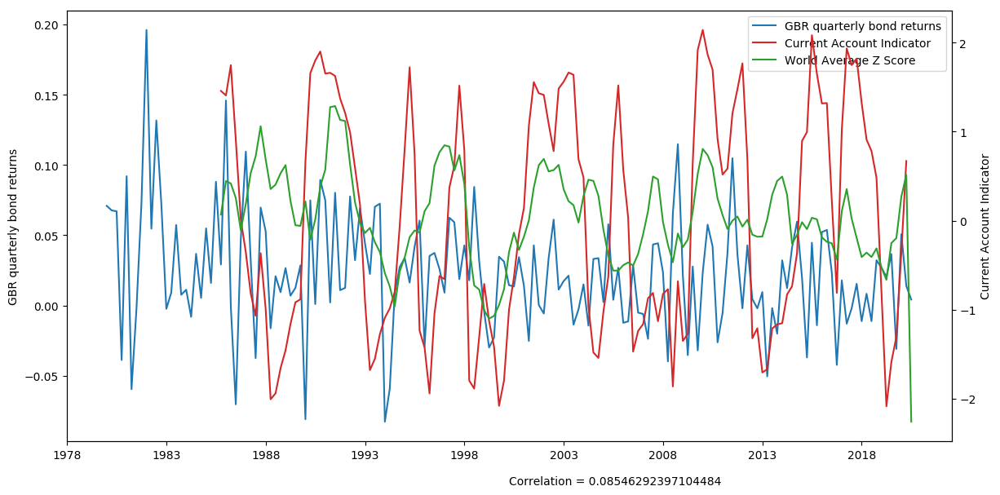

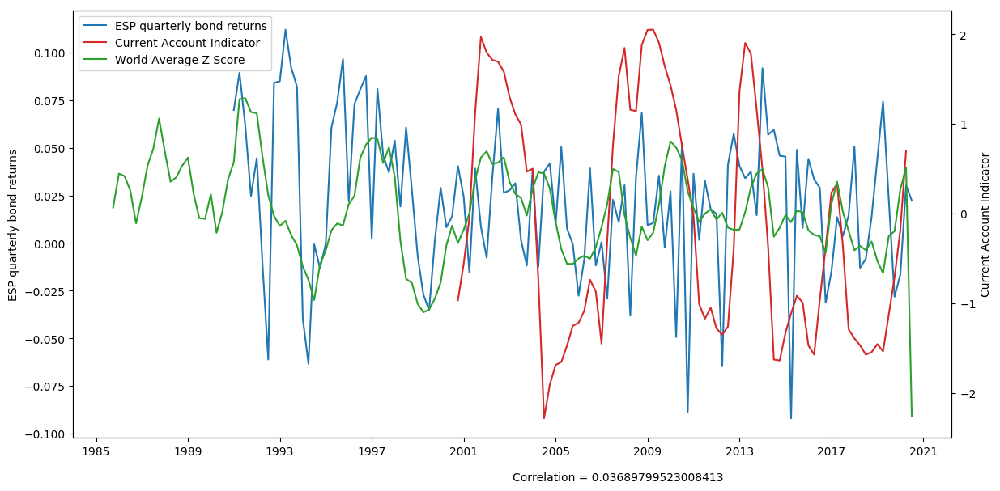

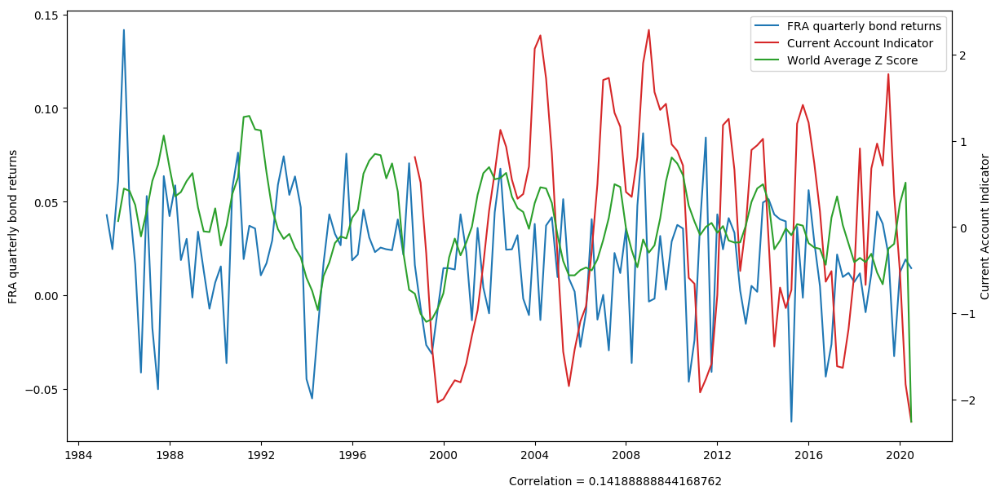

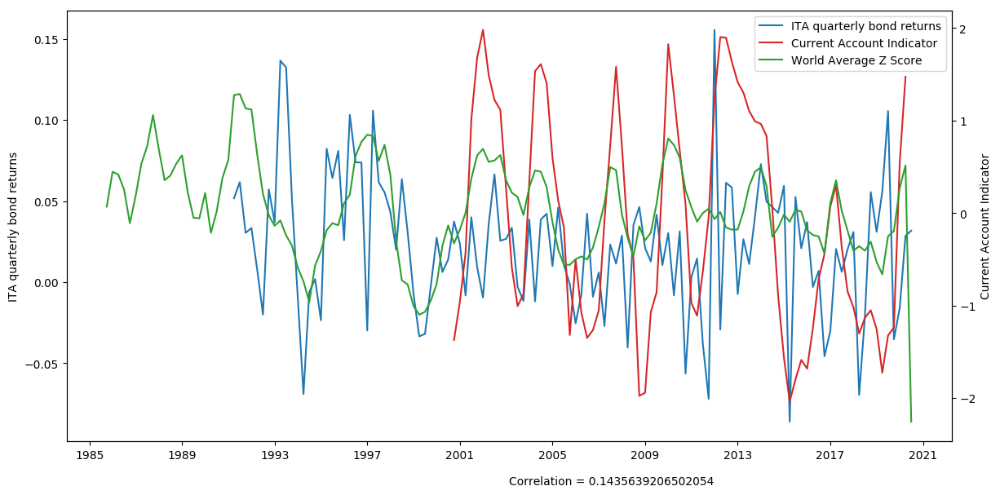

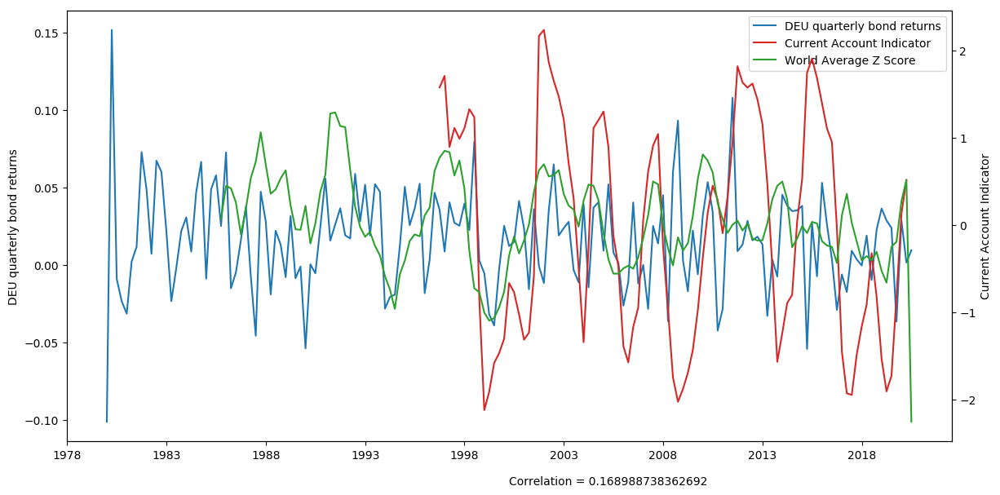

In [61]:
currentAccount_pctGDP = dl.pull("CurrAcctPctGDP")

#currentAccountChangeLastQ = currentAccount_pctGDP.shift(periods=1).rolling.apply(getChange,raw=True)

ca4YrBackend = currentAccount_pctGDP.shift(periods=1).rolling(16).mean()

ca1YrFrontend = currentAccount_pctGDP.shift(periods=1).rolling(4).mean()

##
## compute 4 year x 1 year rolling mean for current account/GDP to capture smoothed change over time.
## ca/GDP captures both potential for future interest rate increases and FX depreciations.
##

caChange = ca1YrFrontend - ca4YrBackend

caMeanChangeRolling = caChange.rolling(8).mean()
#caChangeStdevPrevious4Yrs = currentAccount_pctGDP.shift(periods=1).rolling(16).std()
caChangeStdevRolling = caChange.rolling(8).std()


#caIndicator = currentAccountChangeLast12Months / currentAccountMeanPrior4Yrs

#caRollingMeanPastYear = currentAccount_pctGDP.shift(periods=1).rolling(4).mean()

#caRollingMeanPrevious4Yrs = currentAccount_pctGDP.shift(periods=1).rolling(16).mean()
#caRollingStdevPrevious4Yrs = currentAccount_pctGDP.shift(periods=1).rolling(16).std()

#quarterZScore = (currentAccount_pctGDP.shift(periods=1) - caRollingMeanPrevious4Yrs)/caRollingStdevPrevious4Yrs

#zScores = quarterZScore.rolling(4).mean()

caZScores = (caChange - caMeanChangeRolling)/caChangeStdevRolling

worldAvgZ = caZScores.mean(axis=1)

for country in countries:
    
    fig, ax1 = plt.subplots(figsize = (14,7))
    ax2 = ax1.twinx()
    ax1_label = country + ' quarterly bond returns'
    ax2_label = 'Current Account Indicator'
    hr = ax1.plot(hedgedReturnsQuarterly[country].to_timestamp(), color = 'tab:blue', label = ax1_label)
    #ca = ax2.plot(caIndicator[country].to_timestamp(), color = 'tab:red', label = ax2_label)
    ca = ax2.plot(caZScores[country].to_timestamp(), color = 'tab:red', label = ax2_label)
    
    avgZ = ax2.plot(worldAvgZ.to_timestamp(), color = 'tab:green', label = "World Average Z Score")
    ax1.set_ylabel(ax1_label)
    ax2.set_ylabel(ax2_label)
    plots = hr + ca + avgZ
    labels = [plot.get_label() for plot in plots]
    ax1.legend(plots, labels, loc="best")

    correlation = hedgedReturnsQuarterly[country].corr(caZScores[country])
    ax1.annotate("Correlation = " + str(correlation),xy = (0.5,-0.1),xycoords="axes fraction")
    plt.show()
    

In [62]:
def getPosition(indicatorSeries, anticipatedCorrelation, countries):
    positions = indicatorSeries.copy()
    for country in countries:
        countryPosition = positions[country] 
        indices1 = countryPosition.index[countryPosition >= 2]
        indices2 = countryPosition.index[countryPosition <= -2]
        indices3 = countryPosition.index[(0 < countryPosition) & (countryPosition < 2)]
        indices4 = countryPosition.index[(0 > countryPosition) & (countryPosition > -2)]
        countryPosition[indices1] = anticipatedCorrelation
        countryPosition[indices2] = -1*anticipatedCorrelation
        countryPosition[indices3] = 0.5 * anticipatedCorrelation * countryPosition[indices3]
        countryPosition[indices4] = 0.5 * anticipatedCorrelation * countryPosition[indices4]
    return positions

In [63]:
caPositions = getPosition(caZScores, 1, countries).resample('1B').ffill()

In [64]:
caIndicatorReturns = caPositions * hedgedReturnsDaily

In [65]:
def getDates(series):
    dates = []
    for x in series.index.to_list():
        dates.append(x)
    return dates

In [66]:
def plotReturns(indicatorName, indicatorSeries, indicatorReturns, longOnlyReturns, countries, subplots):
    
    tradingDaysPerYear= 261
    
    if subplots:
        macrofig = plt.figure(figsize = (180,70))
        index = 1
    for country in countries:
        countryIndicatorReturns = indicatorReturns[country].copy().dropna()
        
        dates = getDates(countryIndicatorReturns)
        countryBondReturns = longOnlyReturns[country][dates]
        
        # compute risk-adjusted returns (per period)
          
        dailyRetBonds = gmean(1+countryBondReturns) - 1
        riskAdjustedRet_bonds = ((1 + dailyRetBonds)**tradingDaysPerYear - 1)/(np.std(countryBondReturns)*np.sqrt(tradingDaysPerYear))
        
        dailyRetIndicator = gmean(1 + countryIndicatorReturns) - 1
        riskAdjustedRet_indicator = ((1+dailyRetIndicator)**tradingDaysPerYear - 1)/(np.std(countryIndicatorReturns)*np.sqrt(tradingDaysPerYear))
        
        
        returnsCorrelation = indicatorReturns[country].corr(longOnlyReturns[country])
       
        if subplots:
            ax1 = macrofig.add_subplot(2,5,index)
            ax1.set_title(country, fontdict = {'fontsize': 60})
        else:
            fig, ax1 = plt.subplots(figsize = (14,10))
        
        ## Volatility-adjust returns ##
        stdevLongOnly = np.std(countryBondReturns)
        stdevIndicator = np.std(countryIndicatorReturns)
        
        stdevRatio = stdevLongOnly/stdevIndicator
        countryBondReturns = countryBondReturns/stdevRatio
        
        
        ax2 = ax1.twinx()
        
        shading = indicatorSeries[country]
        
        if subplots:
            ax1_label = "Indicator Returns"
        else:
            ax1_label = country + ' Indicator Returns'
        
        
        ax2_label = "Position generated by " + indicatorName
        
        cr = ax1.plot((np.cumprod(1+countryIndicatorReturns)-1).to_timestamp(), color = blue, label = ax1_label)
        hr = ax1.plot((np.cumprod(1+countryBondReturns)-1).to_timestamp(), color = red, label = "Long-Only Bond Returns")
        
        indicatorPlot = ax2.plot(indicatorSeries[country].to_timestamp(), color = orange, label = ax2_label)
        if subplots:
            ax1.set_ylabel(ax1_label, fontsize=40)
            ax2.set_ylabel(ax2_label, fontsize=40)
        else:
            ax1.set_ylabel(ax1_label)
            ax2.set_ylabel(ax2_label)
        
        #if not subplots:
            #plots = cr + indicatorPlot + hr
        #else:
            #plots = cr + hr
        plots = cr + indicatorPlot + hr
        labels = [plot.get_label() for plot in plots]
        if subplots:
            if index == 1:
                macrofig.legend(plots, labels, loc='upper right', prop={'size': 60})
            plt.setp(ax1.get_xticklabels(), fontsize=40)
            plt.setp(ax1.get_yticklabels(), fontsize=40)
            plt.setp(ax2.get_yticklabels(), fontsize=40)
        else:
            ax1.legend(plots, labels, loc="best")
        if subplots:
            ax1.annotate("Long Bonds Sharpe Ratio = " + str(riskAdjustedRet_bonds),xy = (0.4,-0.05),xycoords="axes fraction")
            ax1.annotate("Indicator Sharpe Ratio = " + str(riskAdjustedRet_indicator),xy = (0.4,-0.1),xycoords="axes fraction")
            ax1.annotate("Correlation btwn long-only and indicator returns: " + str(returnsCorrelation),xy = (0.4,-0.15),xycoords="axes fraction")
        #else:
            #ax1.annotate("Long Bonds Sharpe Ratio = " + str(riskAdjustedRet_bonds),xy = (0.4,-0.1),xycoords="axes fraction")
            #ax1.annotate("Indicator Sharpe Ratio = " + str(riskAdjustedRet_indicator),xy = (0.4,-0.2),xycoords="axes fraction")
            #ax1.annotate("Correlation btwn long-only and indicator returns: " + str(returnsCorrelation),xy = (0.4,-0.3),xycoords="axes fraction")
        if subplots:
            #for val in np.arange(0,1.01,0.01):
                #ax1.fill_between(shading.index.to_timestamp(),min(np.cumprod(1+countryIndicatorReturns)-1),max((np.cumprod(1+countryBondReturns)-1)),facecolor = 'purple', where = ((shading.values >= val) & (shading.values < val+0.01)), alpha = val)
            #for val in np.arange(-0.01,-1.01,-0.01):
                #ax1.fill_between(shading.index.to_timestamp(),min(np.cumprod(1+countryIndicatorReturns)-1),max((np.cumprod(1+countryBondReturns)-1)),facecolor = 'red', where = ((shading.values <= val) & (shading.values > val-0.01)), alpha = -val)
            
            index = index + 1
            
        else:
            plt.show()
    if subplots:
        plt.show()
        

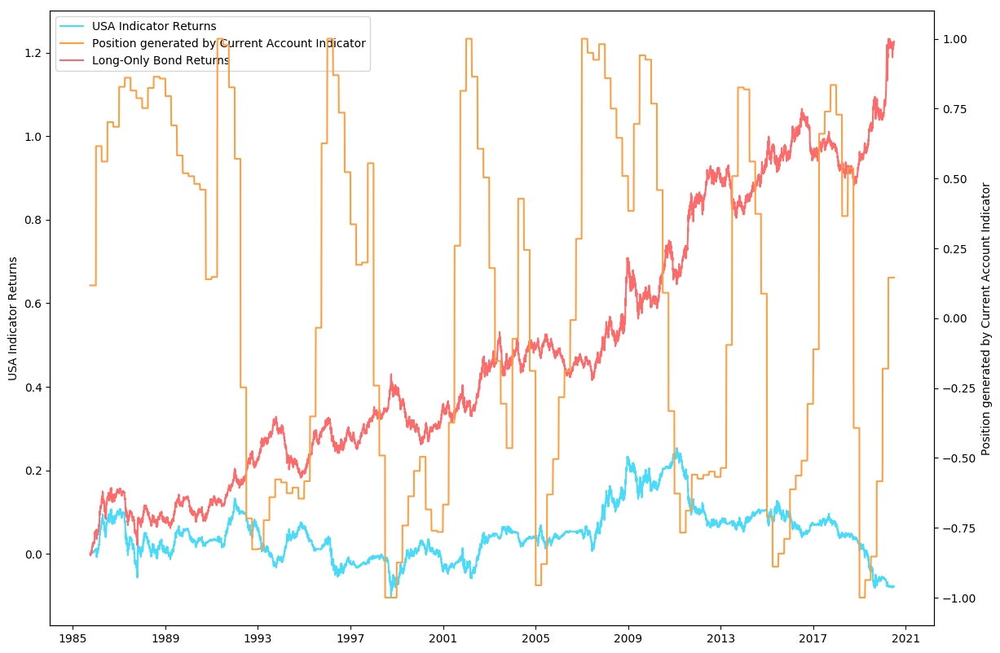

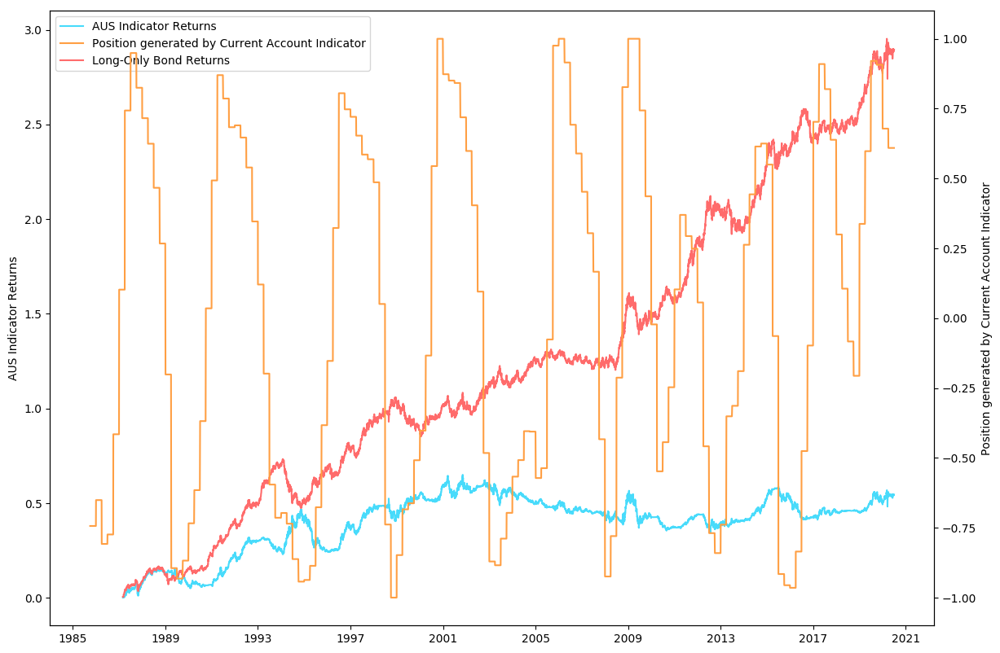

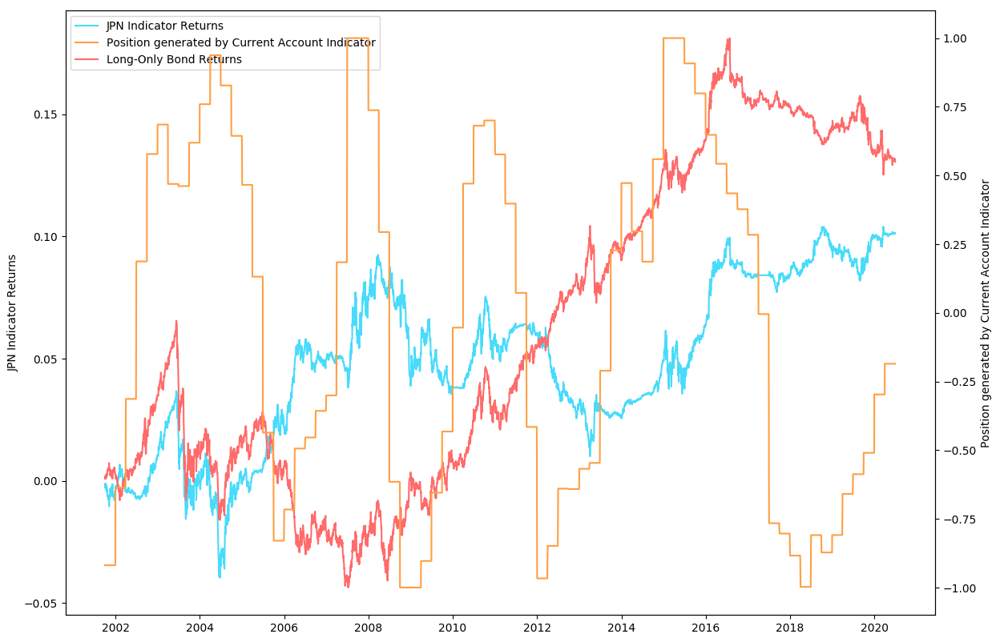

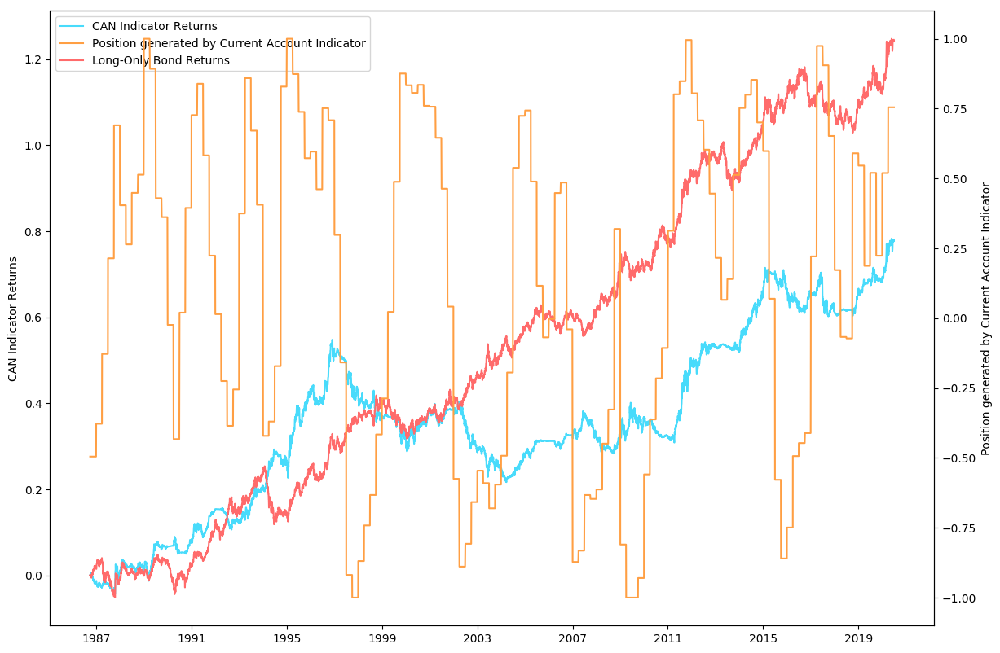

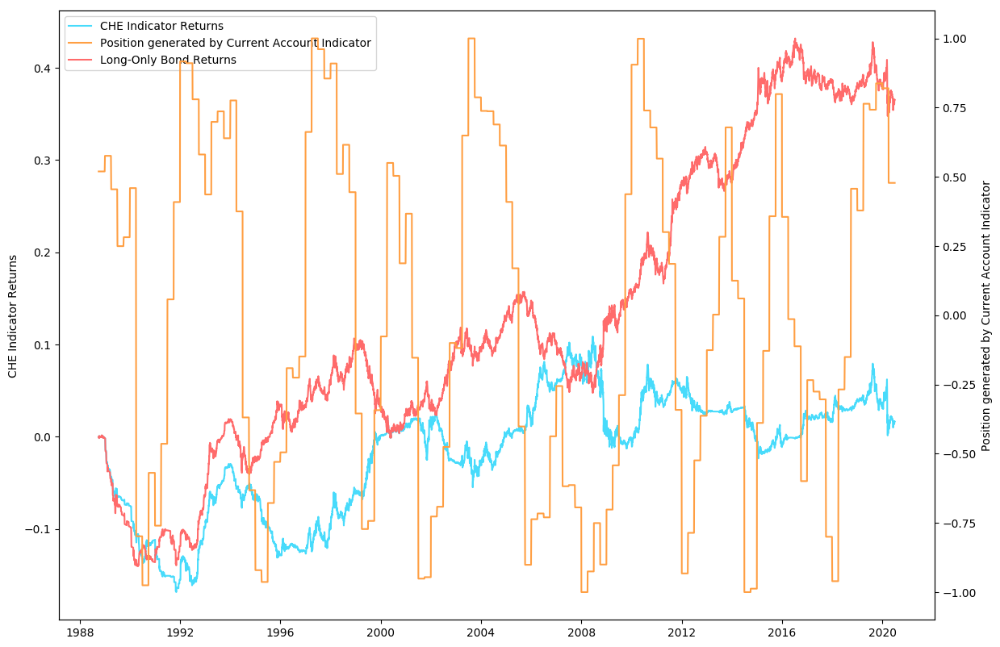

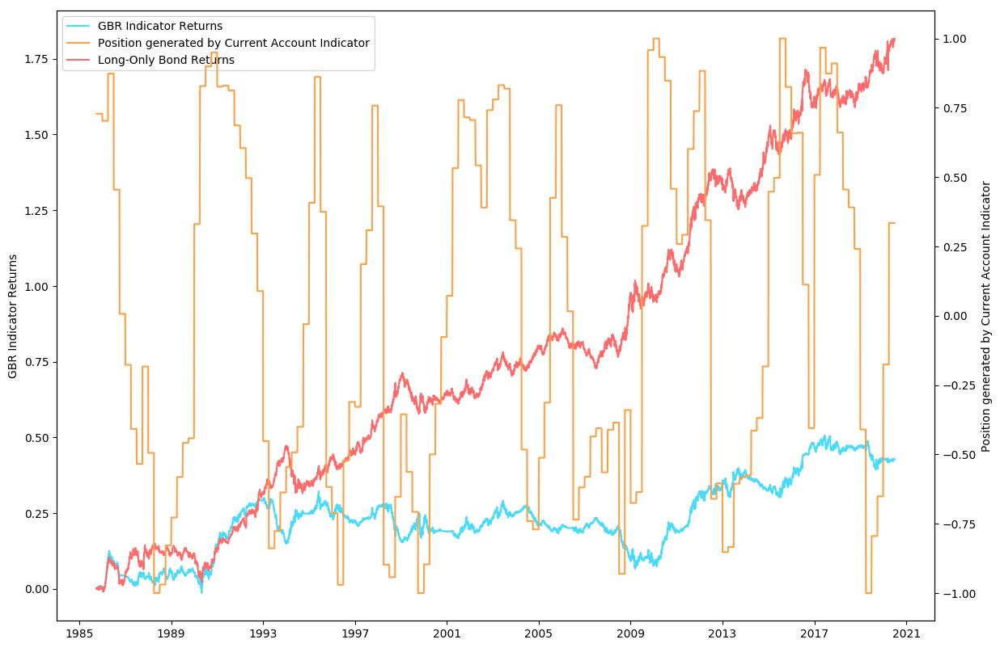

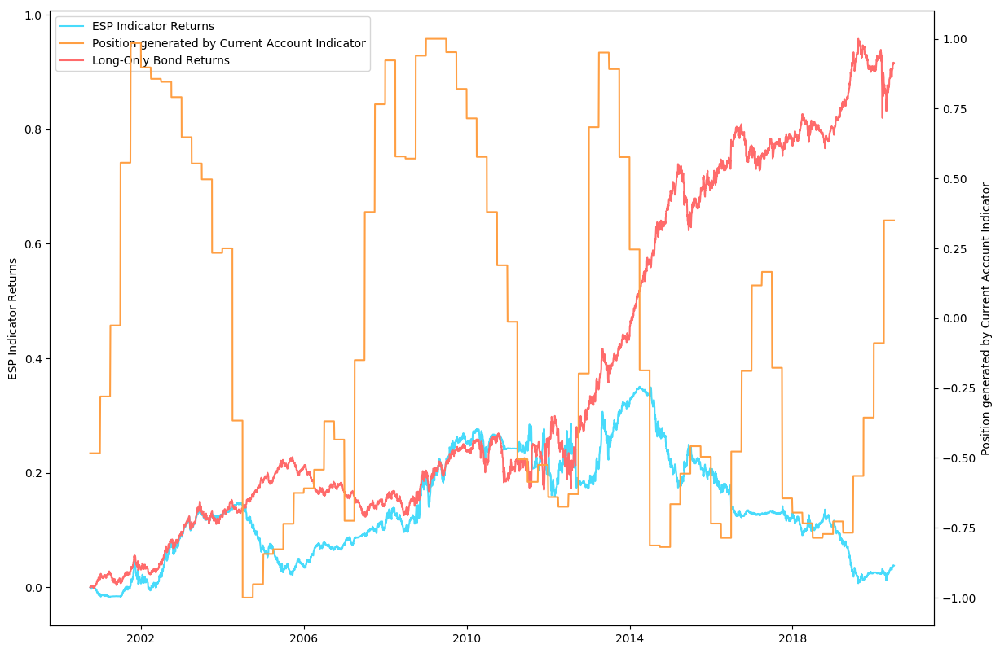

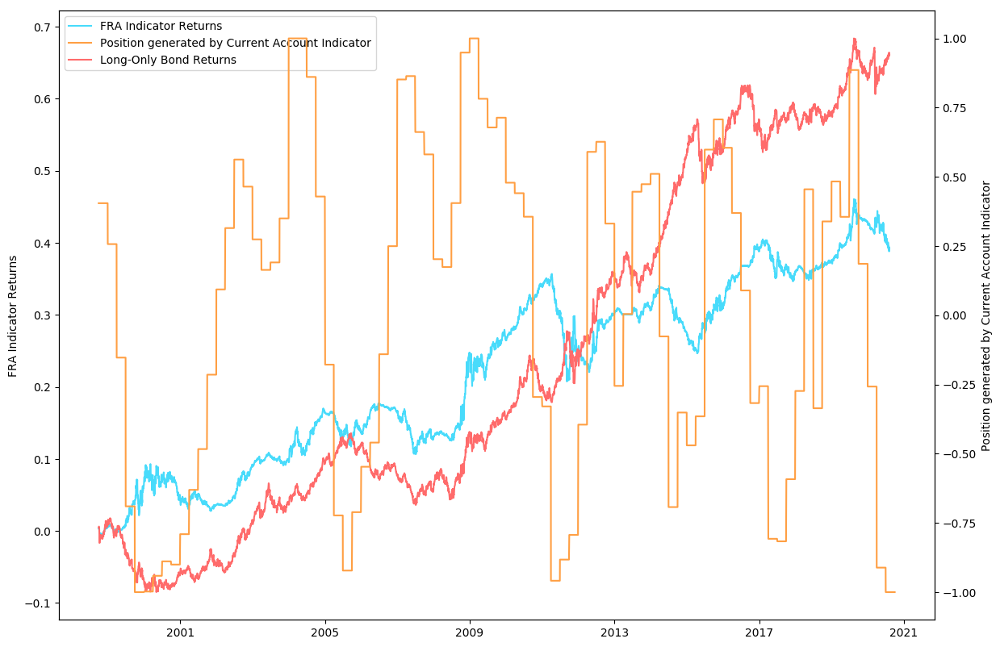

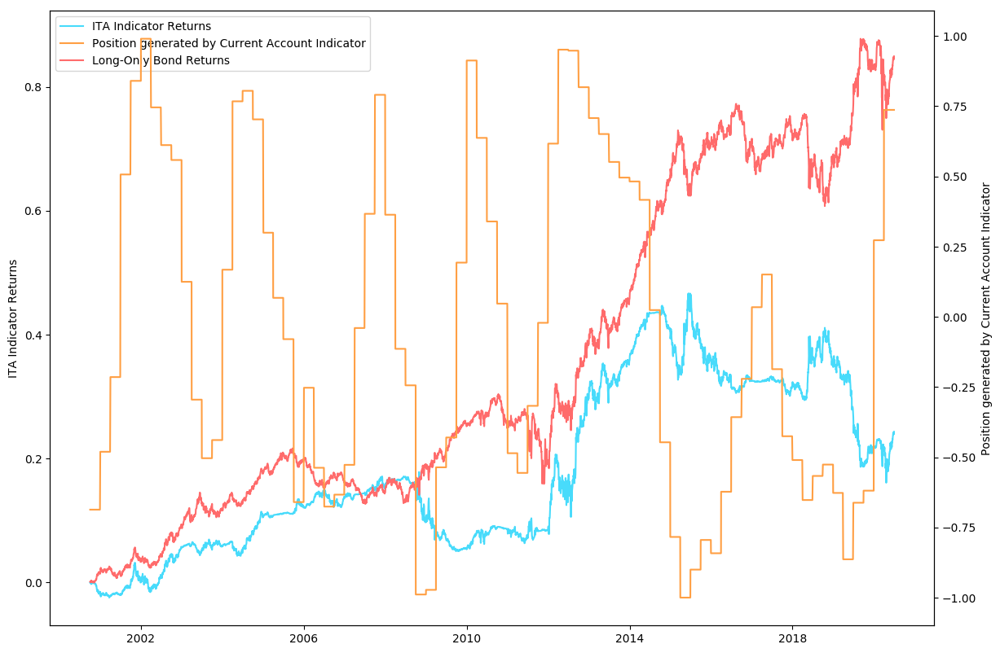

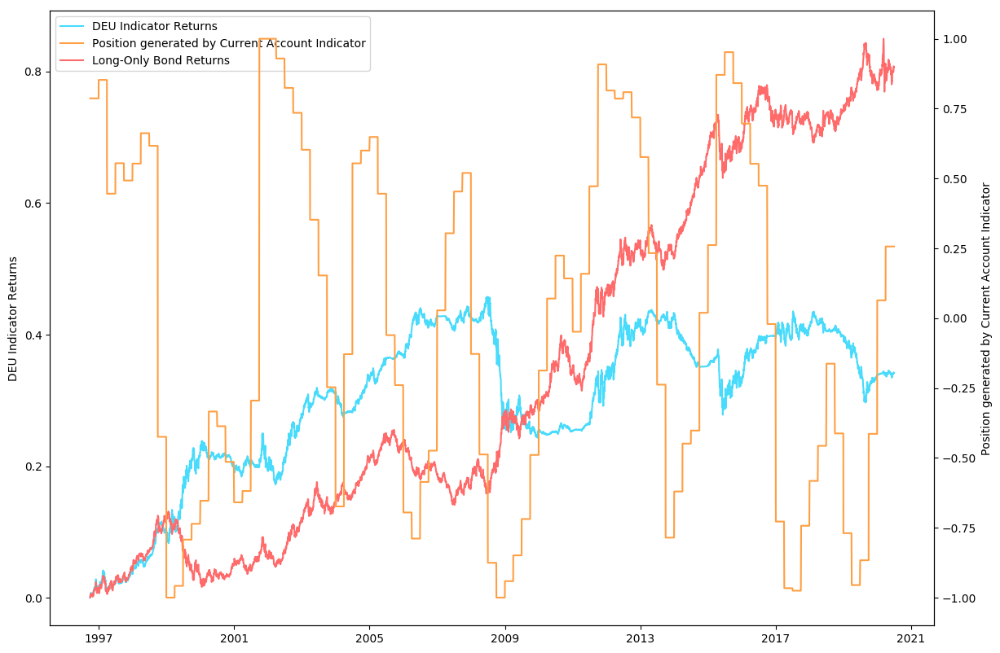

In [67]:
plotReturns("Current Account Indicator", caPositions, caIndicatorReturns, hedgedReturnsDaily, countries, False)



In [68]:
def plotReturnsOnly(indicatorName, indicatorReturns, longOnlyReturns, countries, width, height, annotations):
    
    tradingDaysPerYear= 261
    
    for country in countries:
        countryIndicatorReturns = indicatorReturns[country].copy().dropna()
        
        dates = getDates(countryIndicatorReturns)
        countryBondReturns = longOnlyReturns[country][dates]
        
        # compute risk-adjusted returns (per period)
          
        dailyRetBonds = gmean(1+countryBondReturns) - 1
        riskAdjustedRet_bonds = ((1 + dailyRetBonds)**tradingDaysPerYear - 1)/(np.std(countryBondReturns)*np.sqrt(tradingDaysPerYear))
        
        dailyRetIndicator = gmean(1 + countryIndicatorReturns) - 1
        riskAdjustedRet_indicator = ((1+dailyRetIndicator)**tradingDaysPerYear - 1)/(np.std(countryIndicatorReturns)*np.sqrt(tradingDaysPerYear))
        
        
        returnsCorrelation = indicatorReturns[country].corr(longOnlyReturns[country])
       
        fig, ax1 = plt.subplots(figsize = (width,height))
        
        ## Volatility-adjust returns ##
        stdevLongOnly = np.std(countryBondReturns)
        stdevIndicator = np.std(countryIndicatorReturns)
        
        stdevRatio = stdevLongOnly/stdevIndicator
        countryBondReturns = countryBondReturns/stdevRatio
        
        ax1_label = country + ' Indicator Returns'
        
        cr = ax1.plot((np.cumprod(1+countryIndicatorReturns)-1).to_timestamp(), color = blue, label = ax1_label, zorder=10000)
        hr = ax1.plot((np.cumprod(1+countryBondReturns)-1).to_timestamp(), color = red, label = "Long-Only Bond Returns")
        
        ax1.set_ylabel(ax1_label)
        
        plots = cr + hr
        
        labels = [plot.get_label() for plot in plots]
        ax1.legend(plots, labels, loc="best")
        if annotations:
            ax1.annotate("Long Bonds Sharpe Ratio = " + str(round(riskAdjustedRet_bonds,2)),xy = (0.1,-0.07),xycoords="axes fraction",fontsize=14)
            ax1.annotate("Indicator Sharpe Ratio = " + str(round(riskAdjustedRet_indicator,2)),xy = (0.1,-0.1),xycoords="axes fraction",fontsize=14)
            ax1.annotate("Correlation: " + str(round(returnsCorrelation,3)),xy = (0.1,-0.13),xycoords="axes fraction",fontsize=14)
        
        
        plt.show()

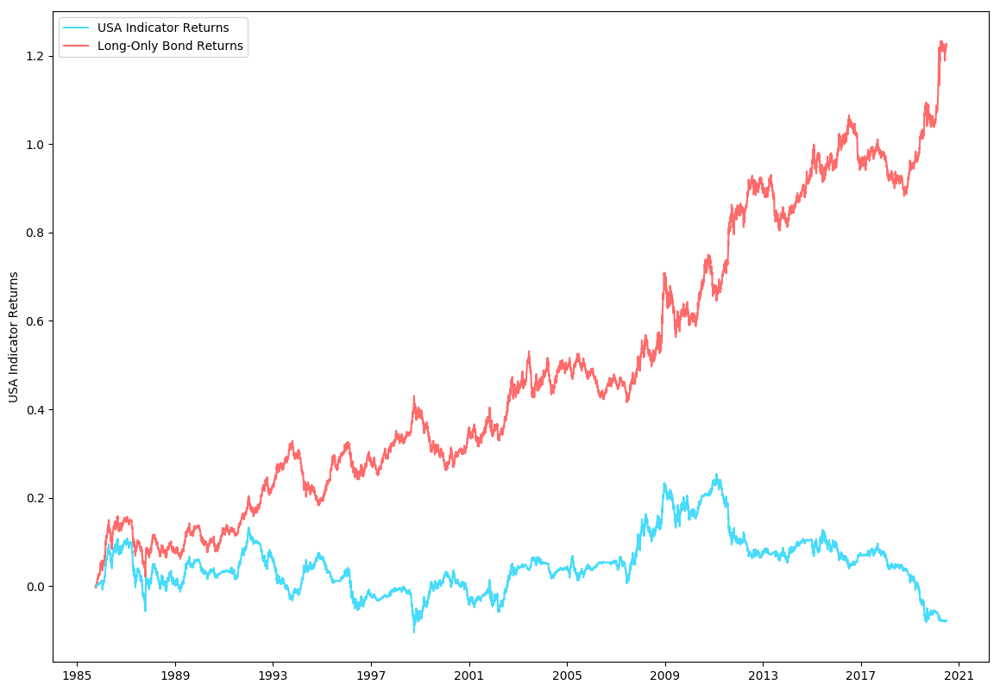

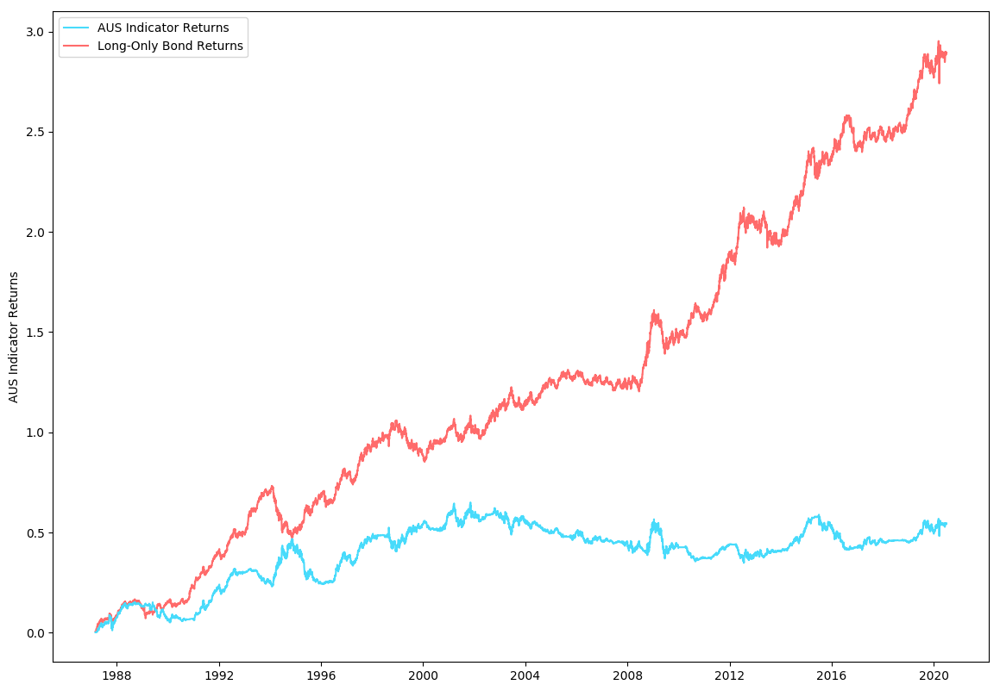

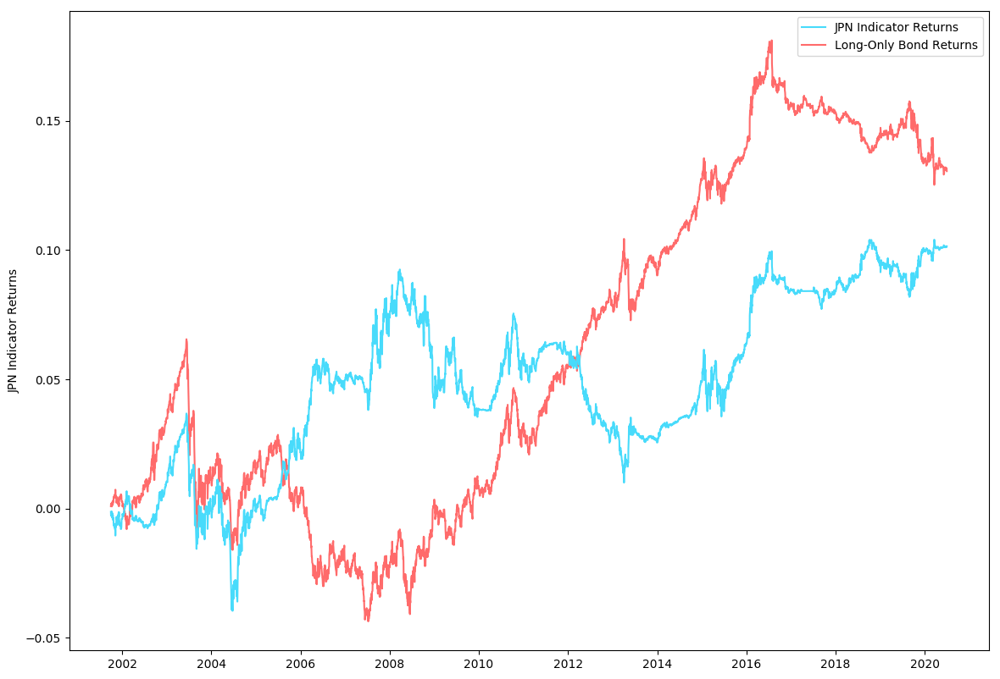

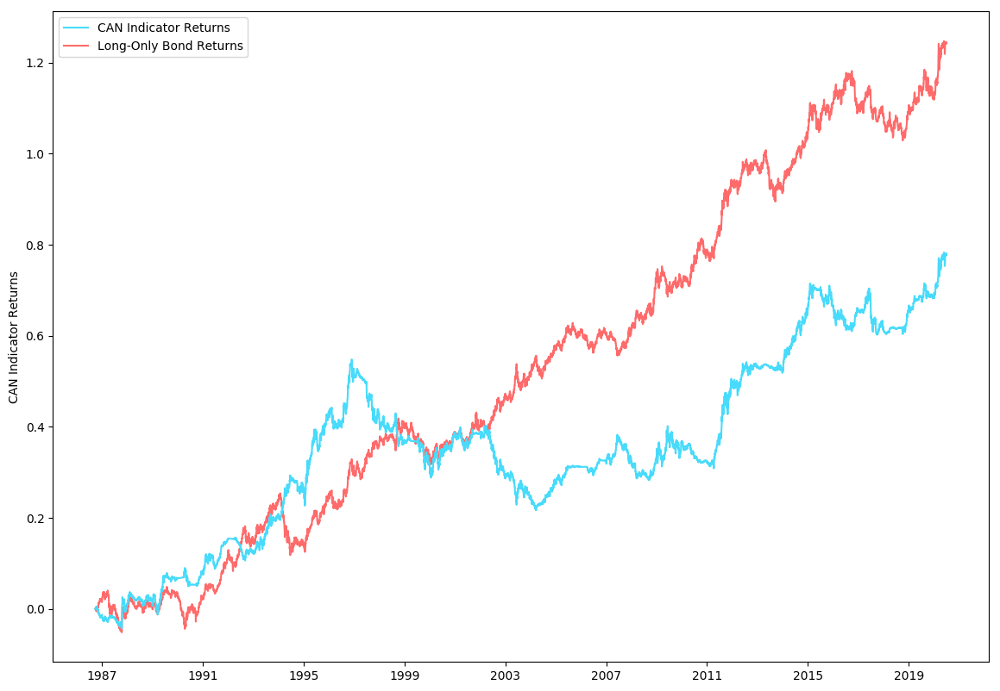

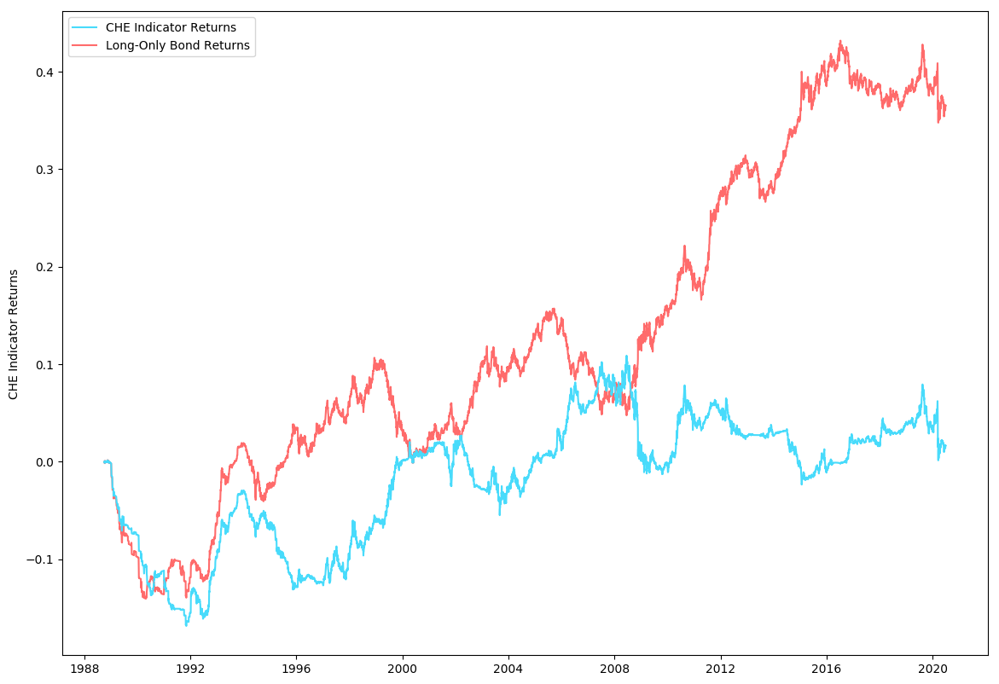

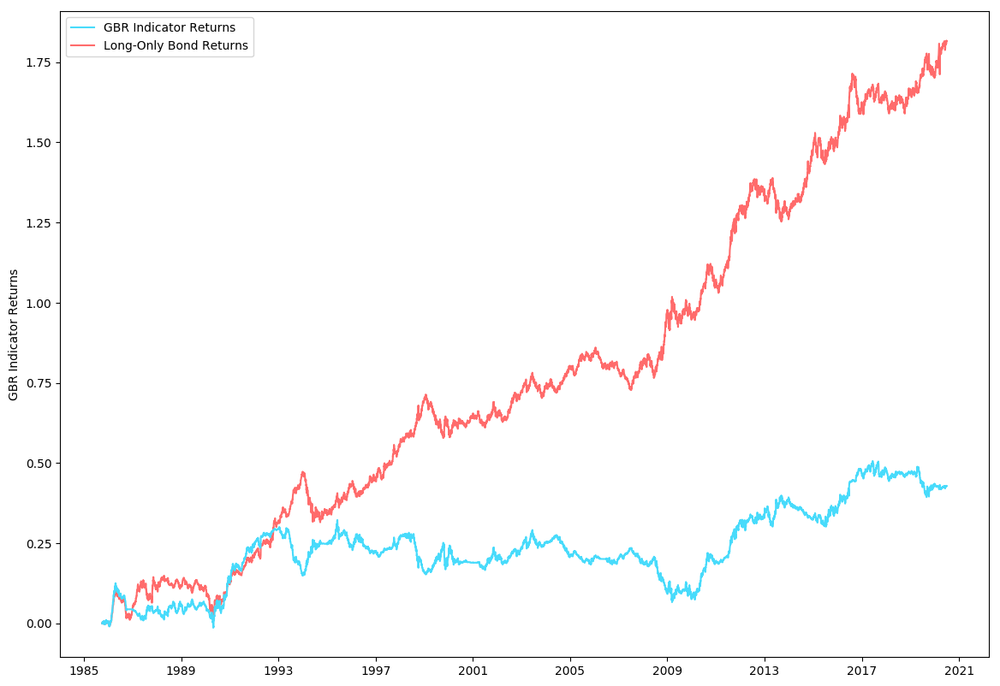

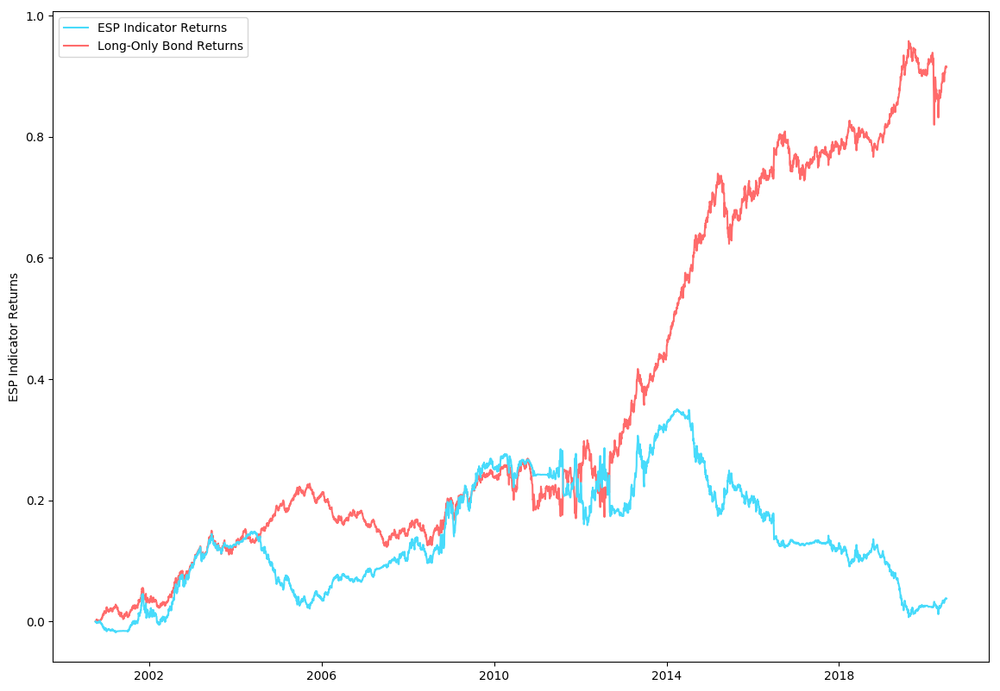

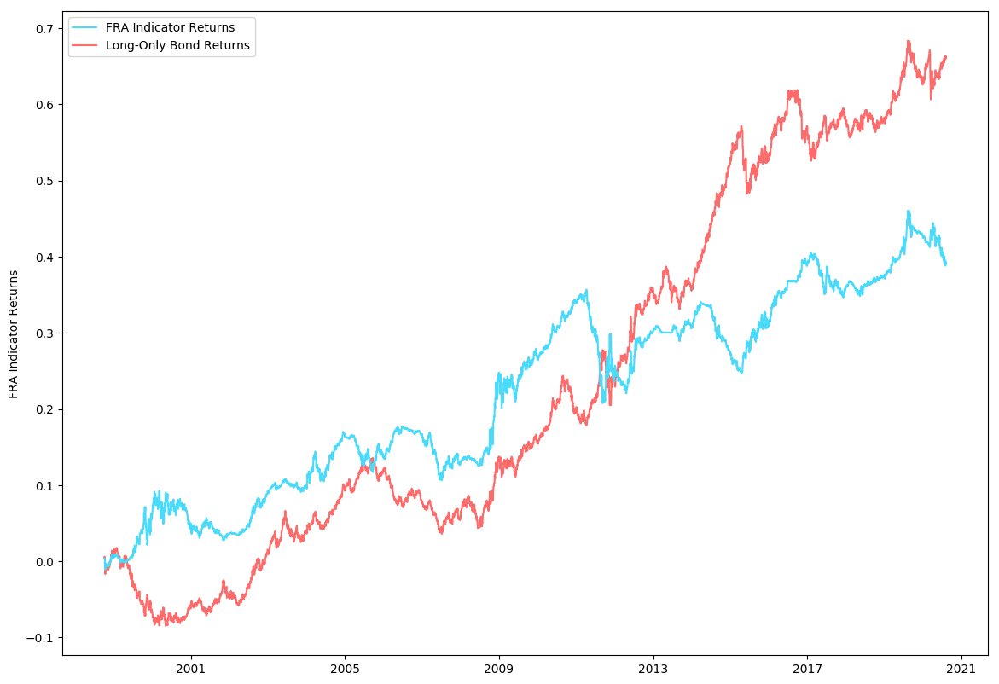

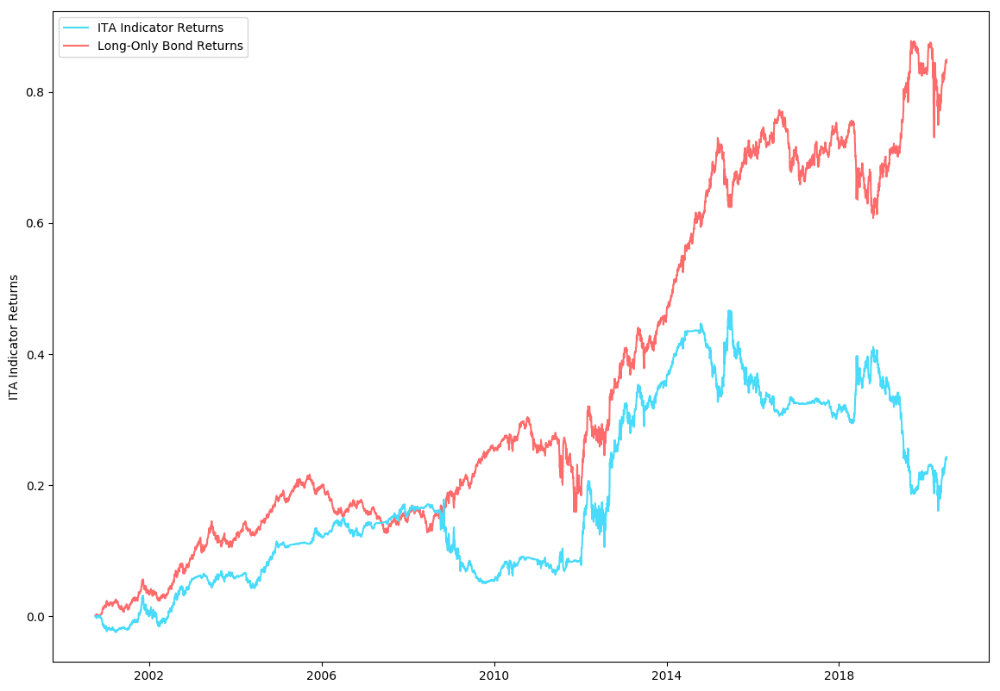

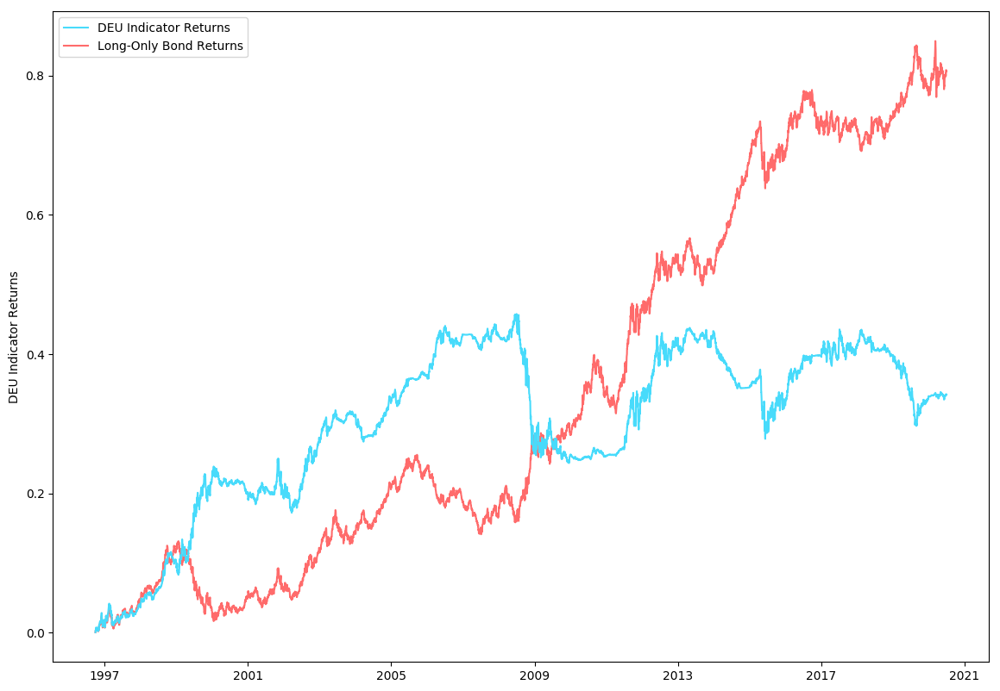

In [69]:
plotReturnsOnly("Current Account/GDP", caIndicatorReturns, hedgedReturnsDaily, countries, 14,10,False)

## Bond Premium

### Bond premium gives a view into general risk sentiment. Bond premium is also faster moving than current account. I computed the 6x18 rolling mean. This moving average change allows us to smoothe changes out over time. The bond premium indicator generates positive returns for almost every country, and the returns generated by the indicator are largely uncorrelated (correlation coefficient < 0.2) with the returns of the long-only strategy.

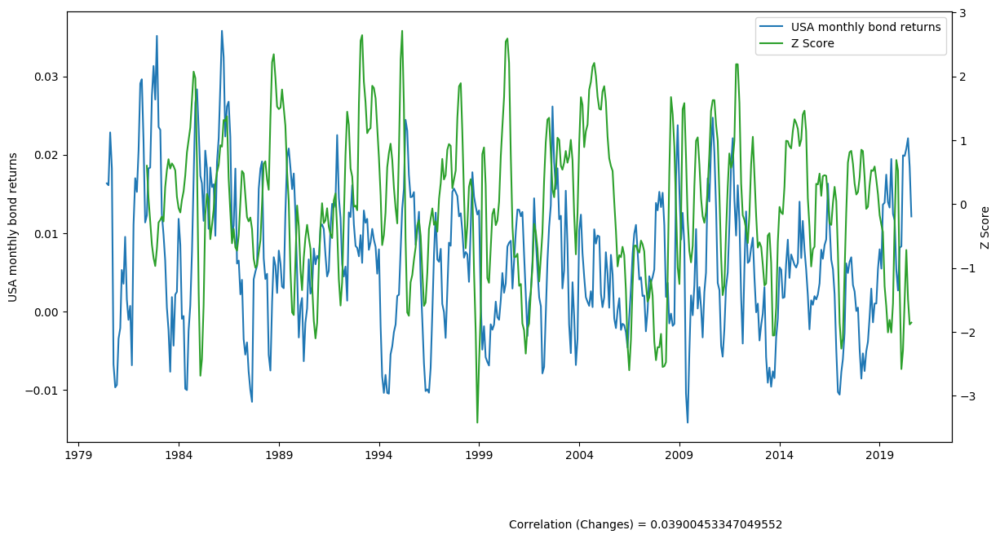

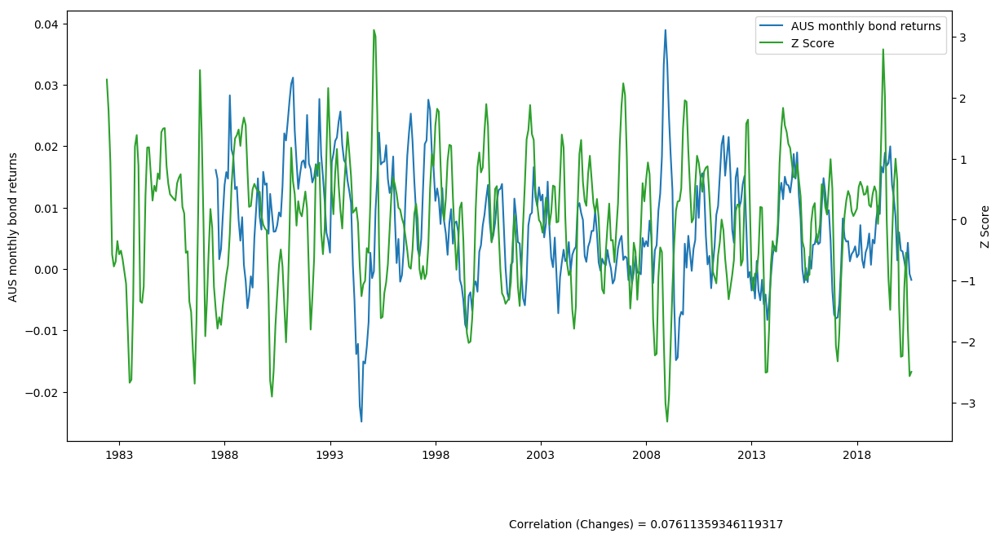

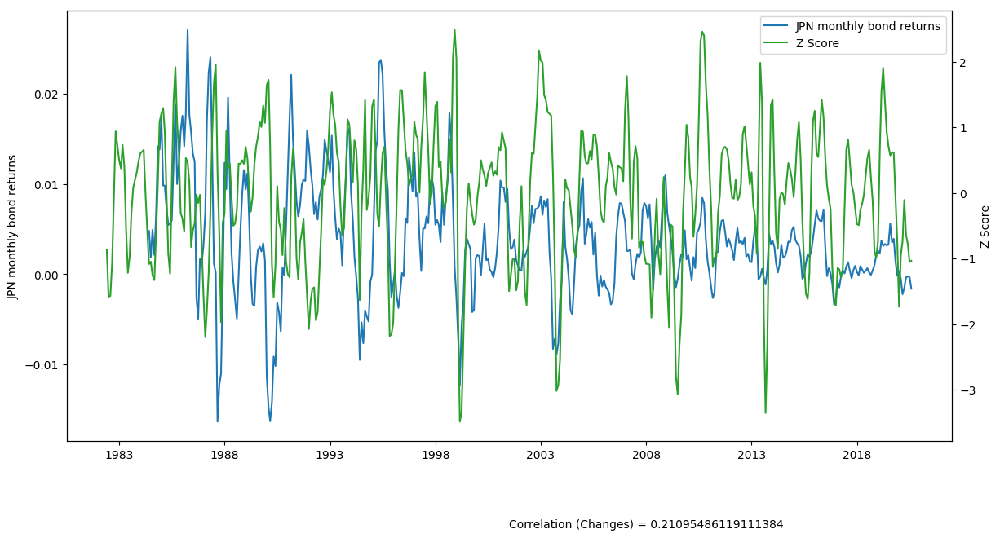

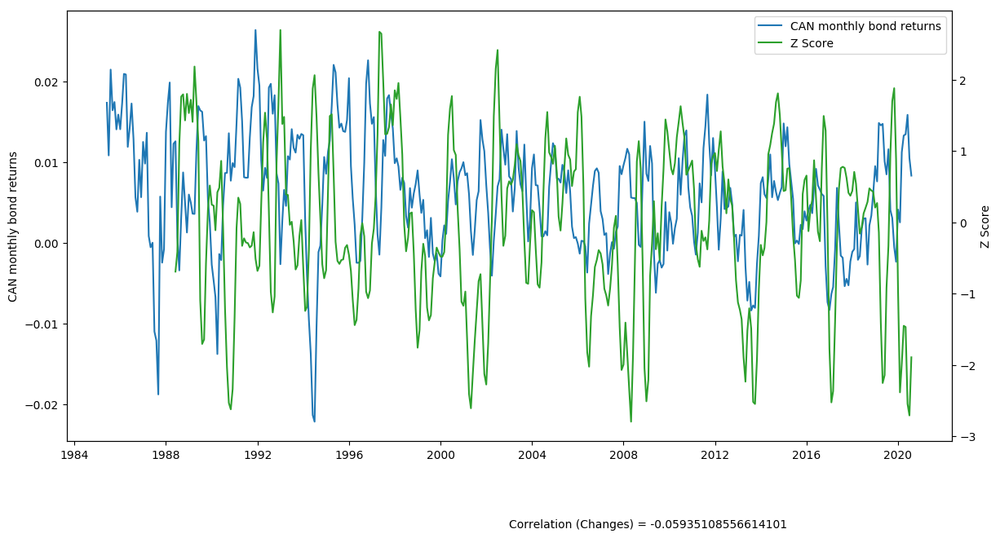

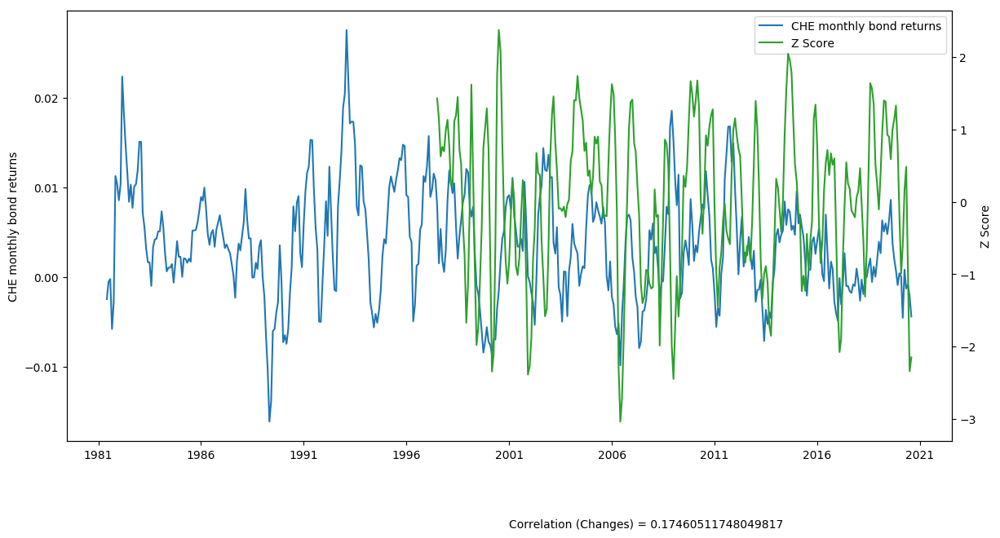

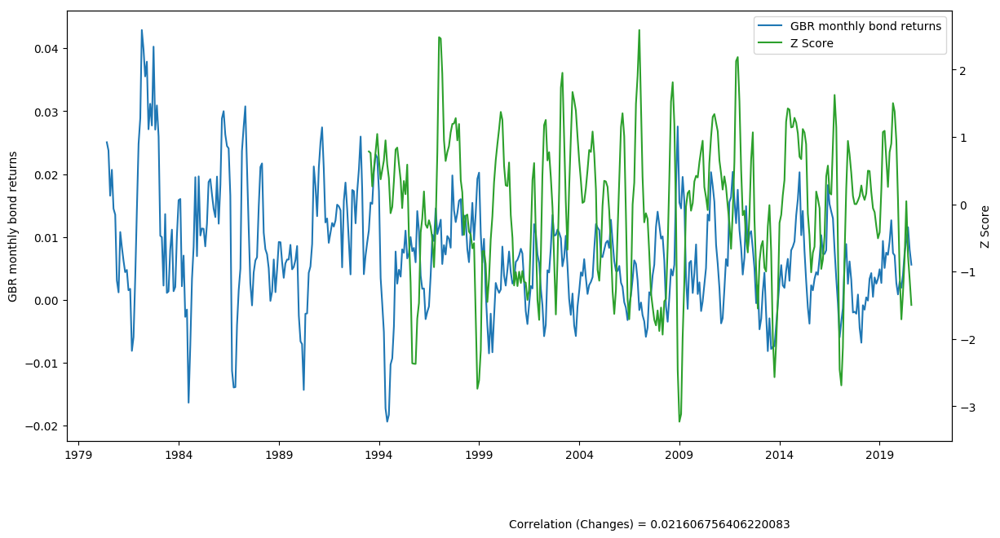

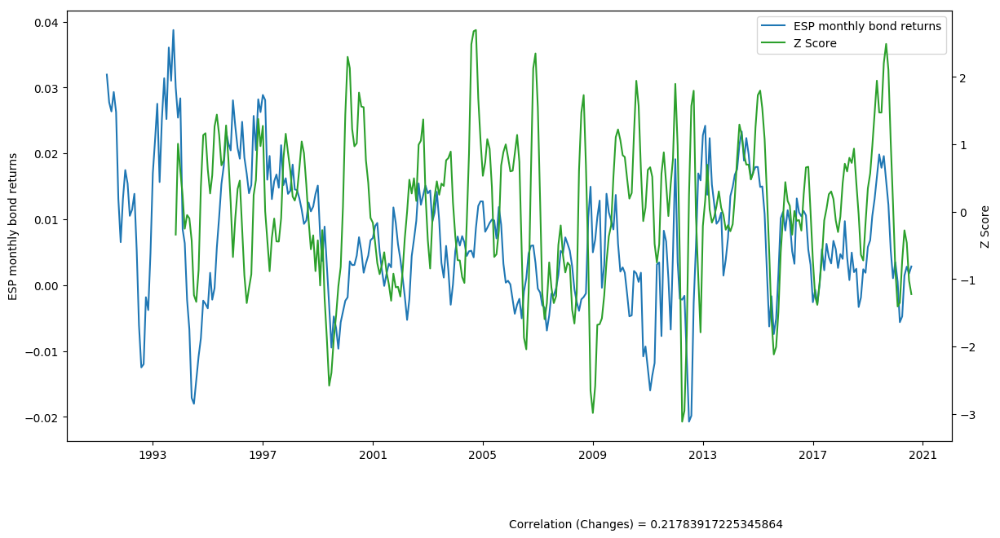

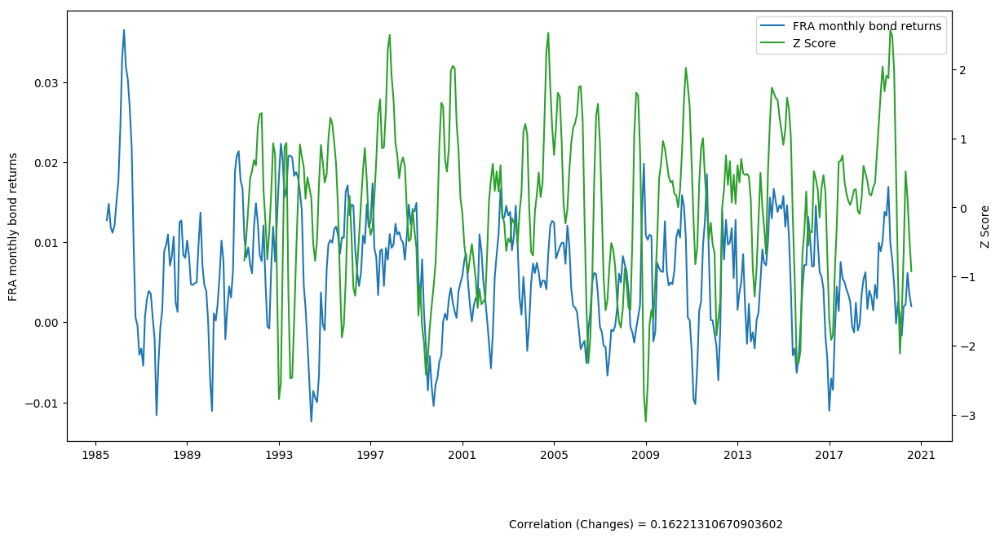

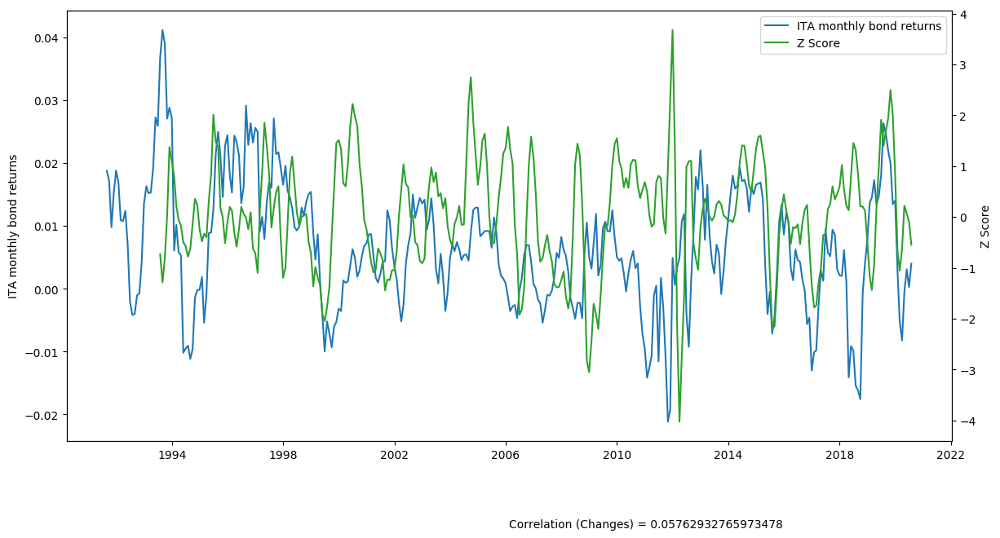

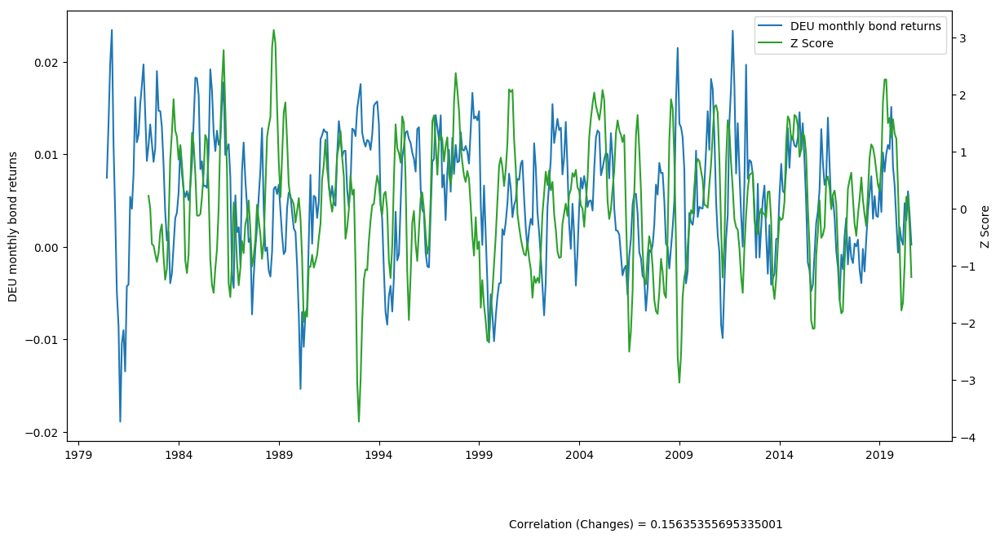

In [70]:
longRates = dl.pull('LongRates')
shortRates = dl.pull('ShortRates')

bondPremium = longRates - shortRates

#bp_over_ch = bondPremium.shift(periods=1)/curveHeight.shift(periods=1)

#bp_over_ch = bp_over_ch.rolling(6).mean()

#bp_ = bondPremium.shift(periods=1).rolling(6).mean().diff()

##
## Compute 6x18 rolling mean for bond premium
##

bpBackend = bondPremium.shift(periods=1).rolling(6).mean()

#bpRollingMean = bondPremium.shift(periods=1).rolling(24).mean()

#bpRollingStdev = bondPremium.shift(periods=1).rolling(24).std()

bpFrontend = bondPremium.shift(periods=1).rolling(3).mean()

bpChange = bpFrontend - bpBackend

bpChangeRollingMean = bpChange.rolling(24).mean()

bpChangeRollingStdev = bpChange.rolling(24).std()

## compute z score

bpZScore = (bpChangeRollingMean - bpChange)/bpChangeRollingStdev

#bpLevelZ = (bpRollingMean - bpFrontend)/bpRollingStdev

hedgedReturnsMonthly = bondReturnIndex.resample('1M').apply(period_return).rolling(6).mean()

for country in countries:
    
    fig, ax1 = plt.subplots(figsize = (14,7))
    ax2 = ax1.twinx()
    ax1_label = country + ' monthly bond returns'
    ax2_label = 'Z Score'
    
    hr = ax1.plot(hedgedReturnsMonthly[country].to_timestamp(), color = 'tab:blue', label = ax1_label)
    
    bp = ax2.plot(bpZScore[country].to_timestamp(), color = 'tab:green', label = ax2_label)
    ax1.set_ylabel(ax1_label)
    ax2.set_ylabel(ax2_label)
    plots = hr + bp
    labels = [plot.get_label() for plot in plots]
    ax1.legend(plots, labels, loc="best")
    correlation = hedgedReturnsMonthly[country].corr(bpZScore[country])
    #ax1.annotate("Correlation (Levels) = " + str(correlation1),xy = (0.5,-0.1),xycoords="axes fraction")
    ax1.annotate("Correlation (Changes) = " + str(correlation),xy = (0.5,-0.2),xycoords="axes fraction")
    plt.show()

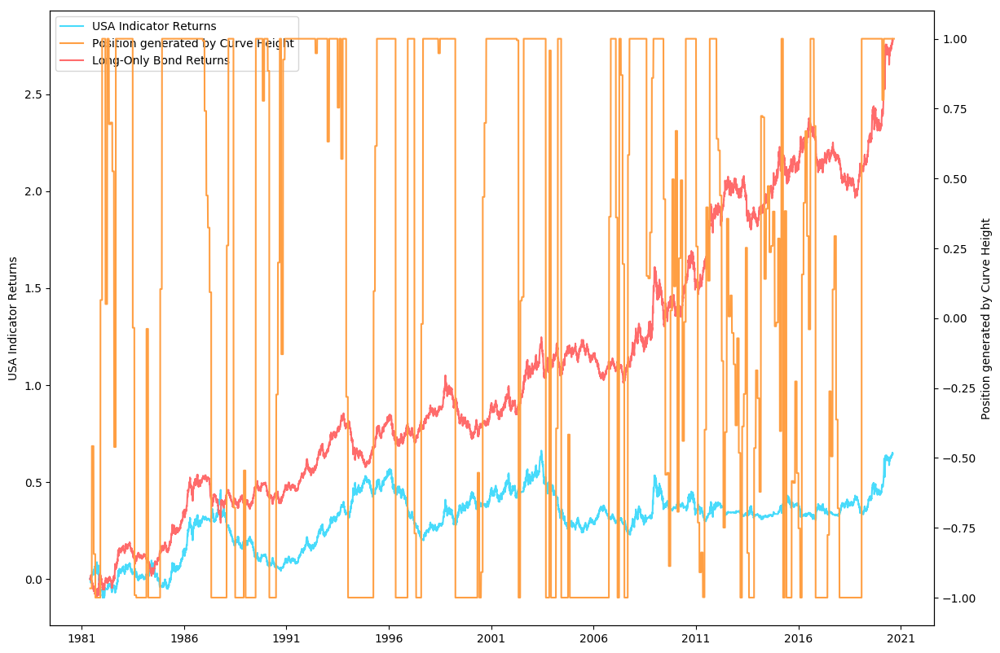

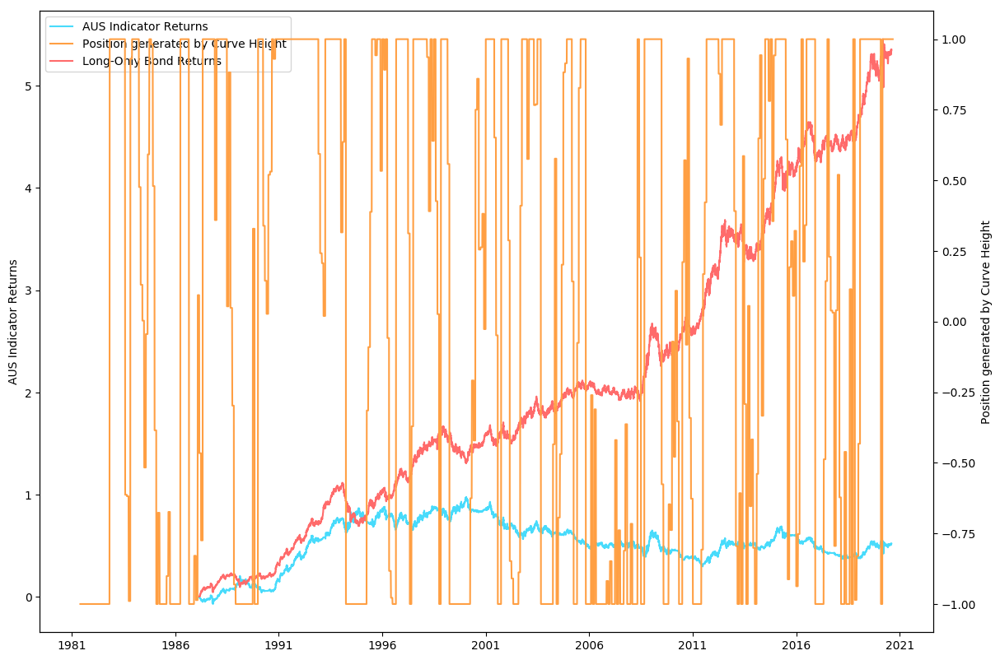

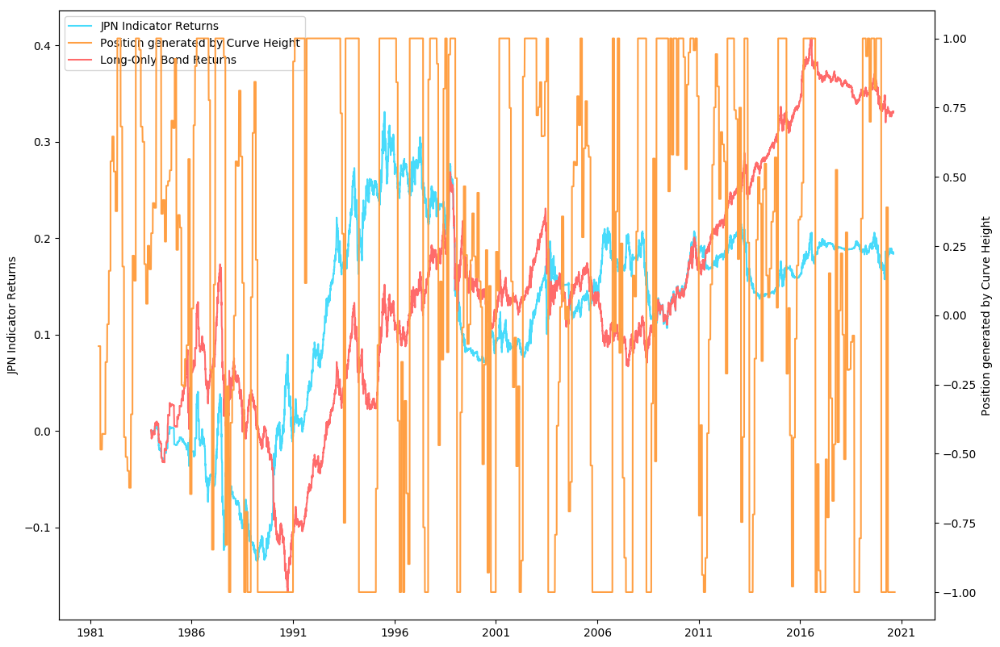

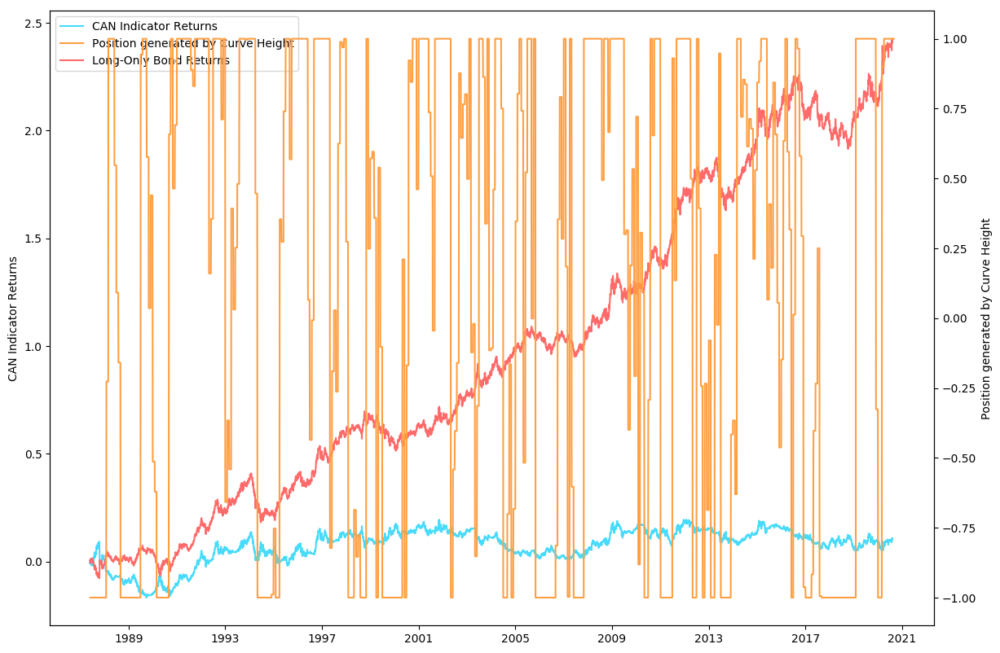

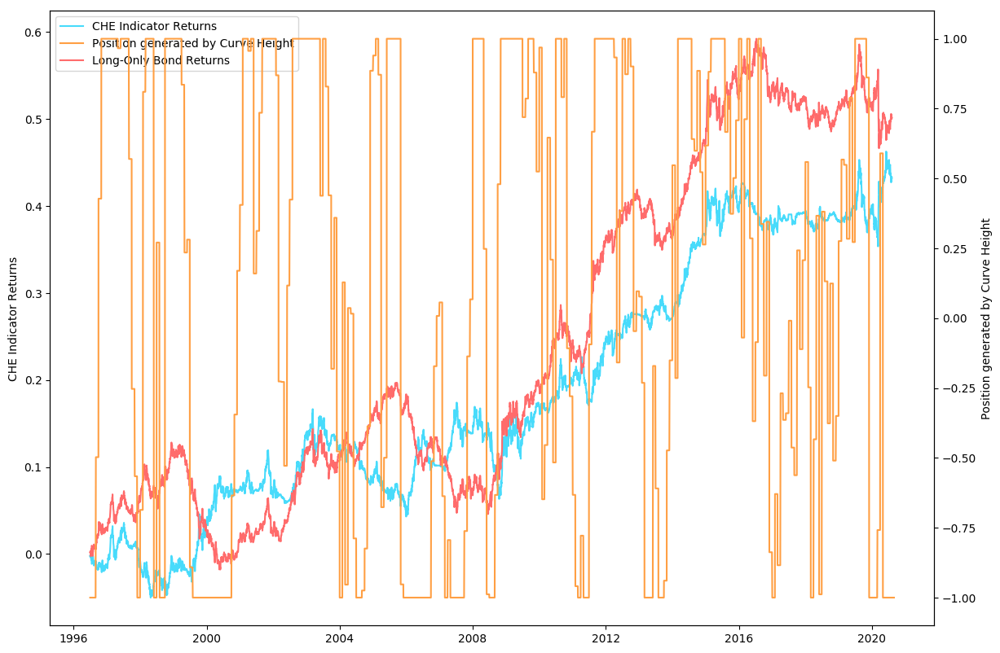

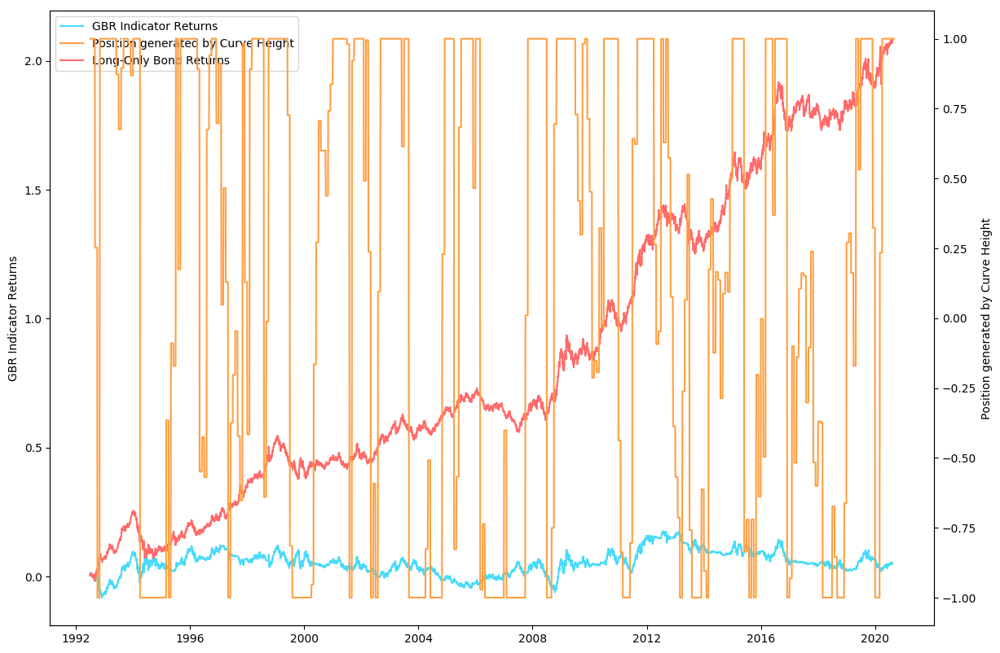

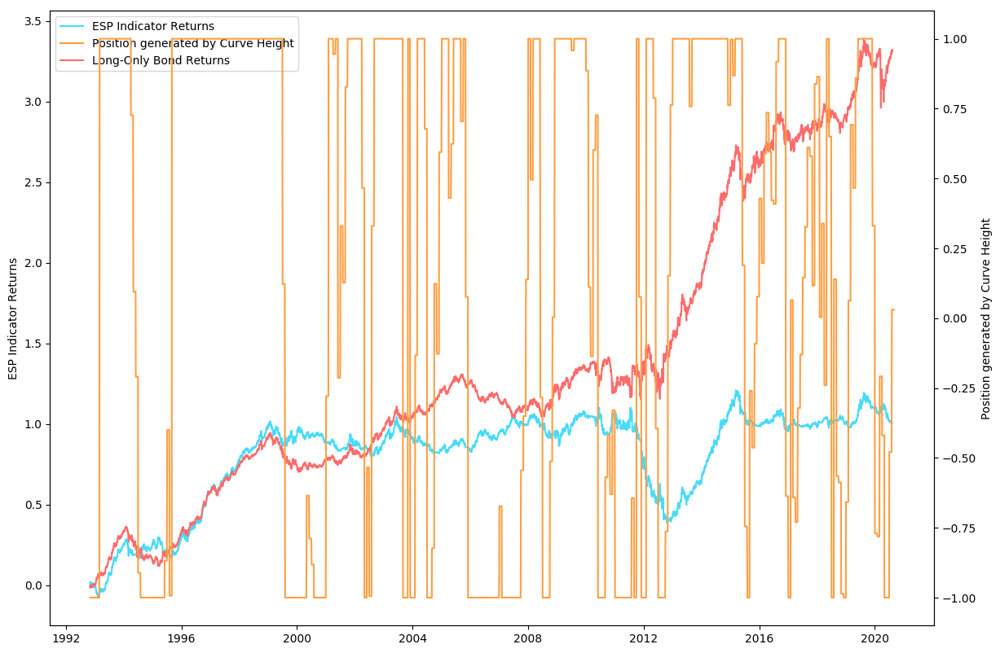

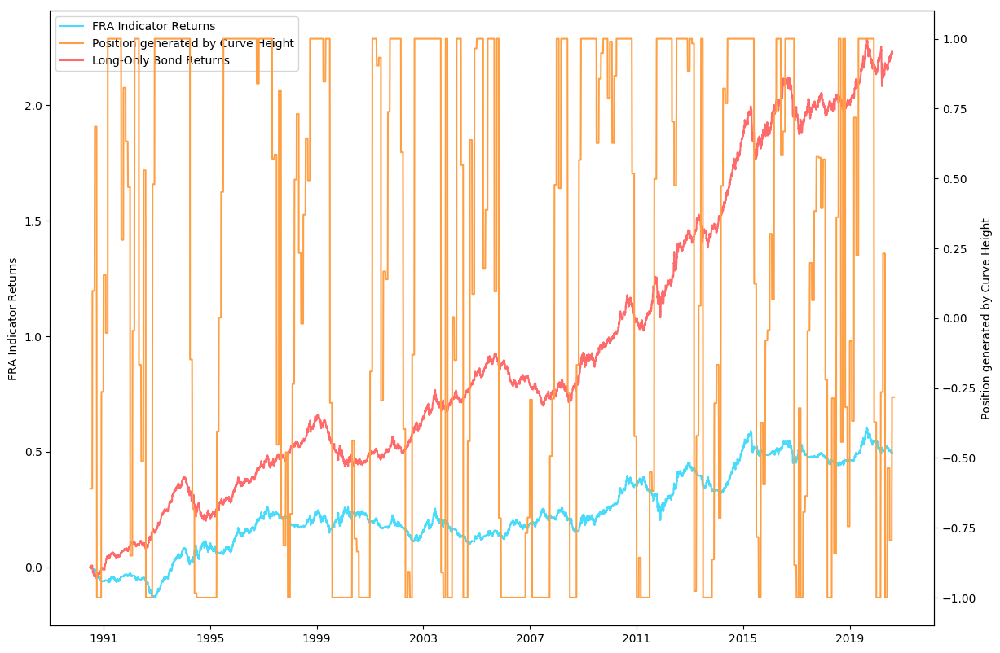

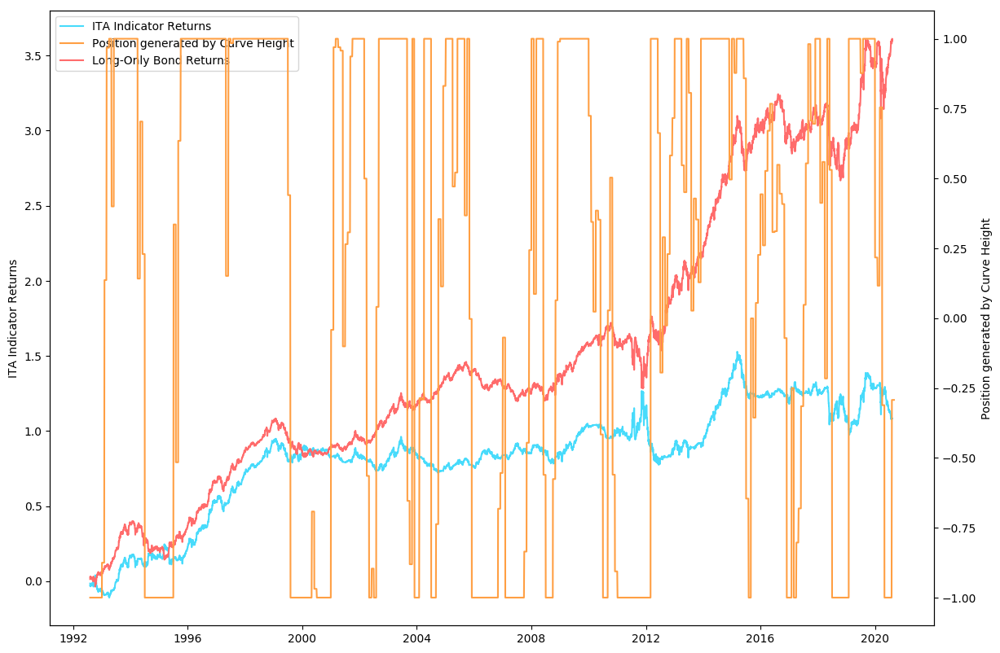

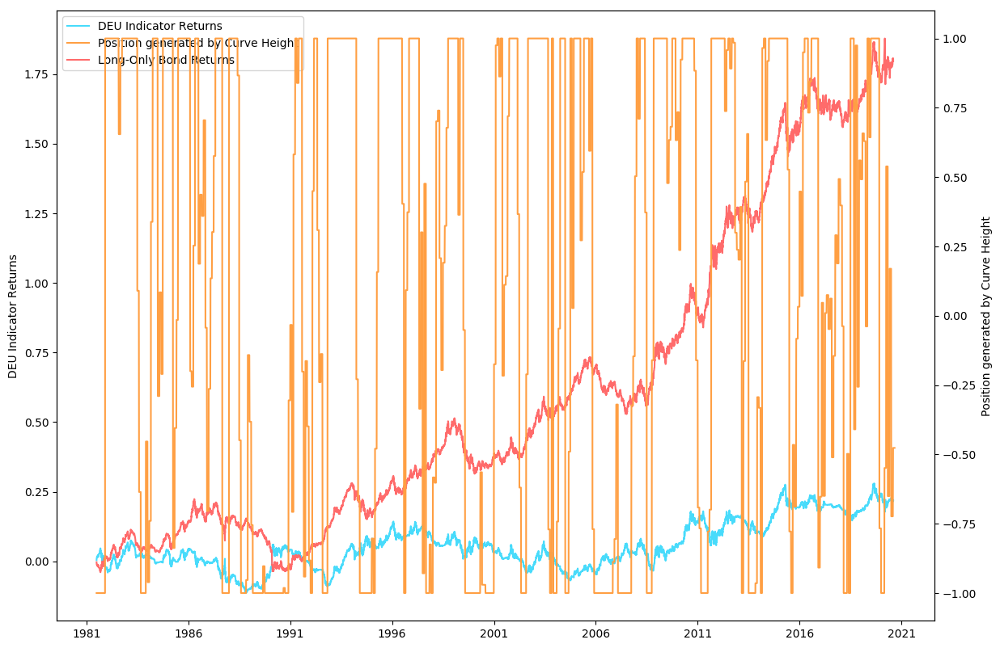

In [71]:
curveHeight = (longRates + shortRates)/2

chBackend = curveHeight.shift(periods=1).rolling(9).mean()

chFrontend = curveHeight.shift(periods=1).rolling(1).mean()

chChange = chFrontend - chBackend

chChangeRollingMean = bpChange.rolling(12).mean()

chChangeRollingStdev = bpChange.rolling(12).std()

chZScore = (chChangeRollingMean - chChange)/chChangeRollingStdev

chPositions = getPosition(chZScore, 1, countries).resample('1B').ffill()

chIndicatorReturns = chPositions * hedgedReturnsDaily

plotReturns("Curve Height", chPositions, chIndicatorReturns, hedgedReturnsDaily, countries, False)



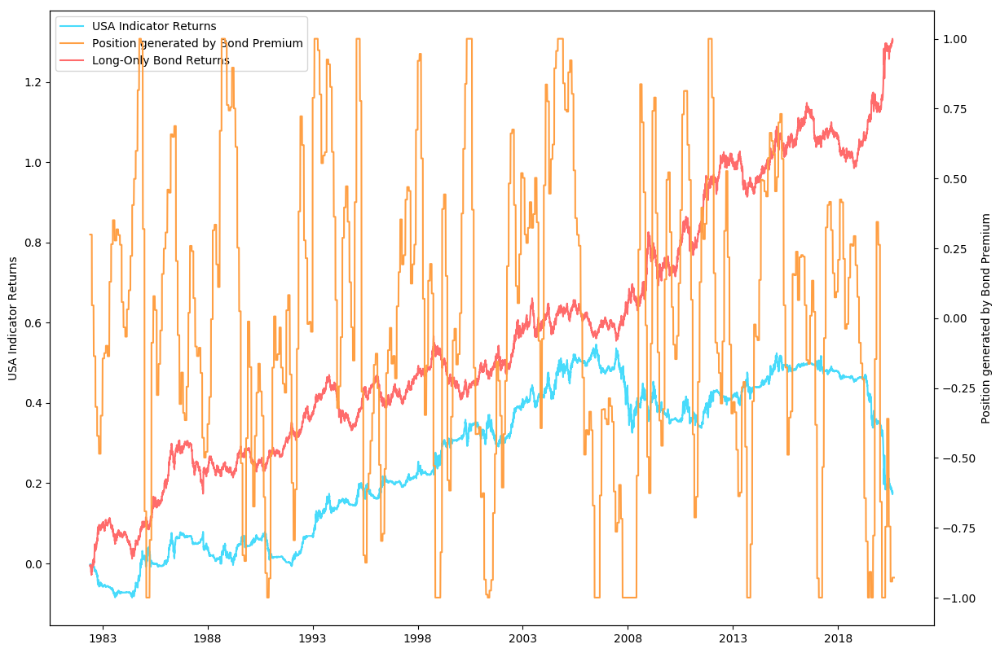

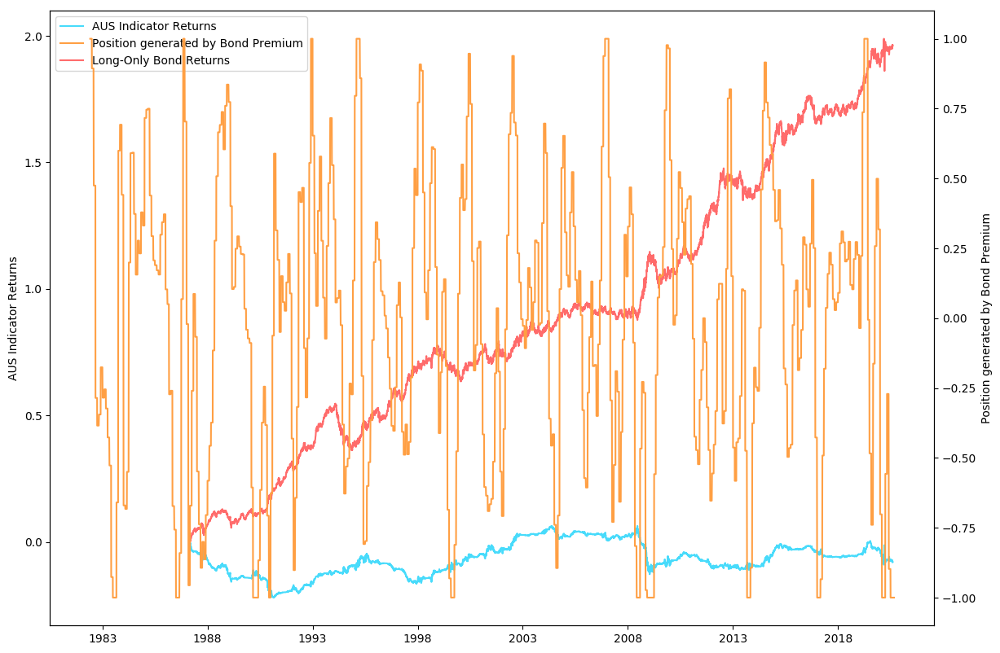

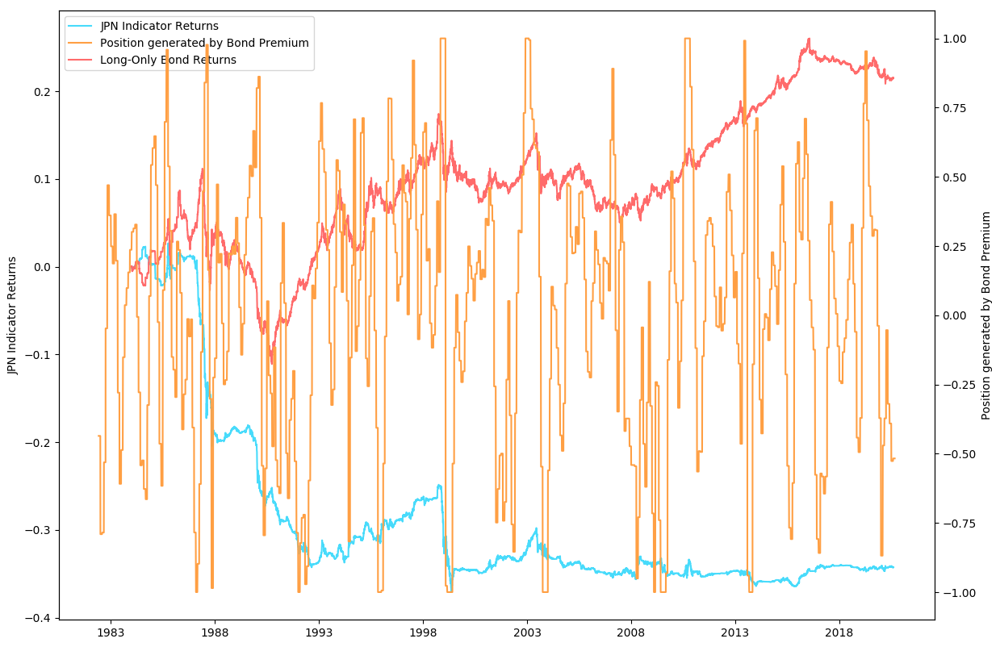

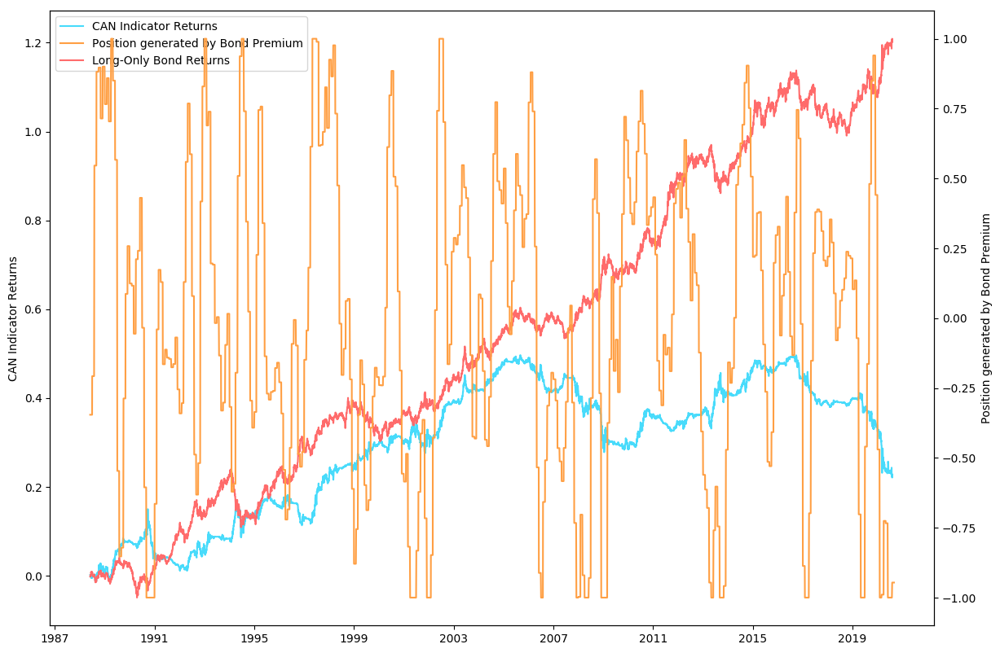

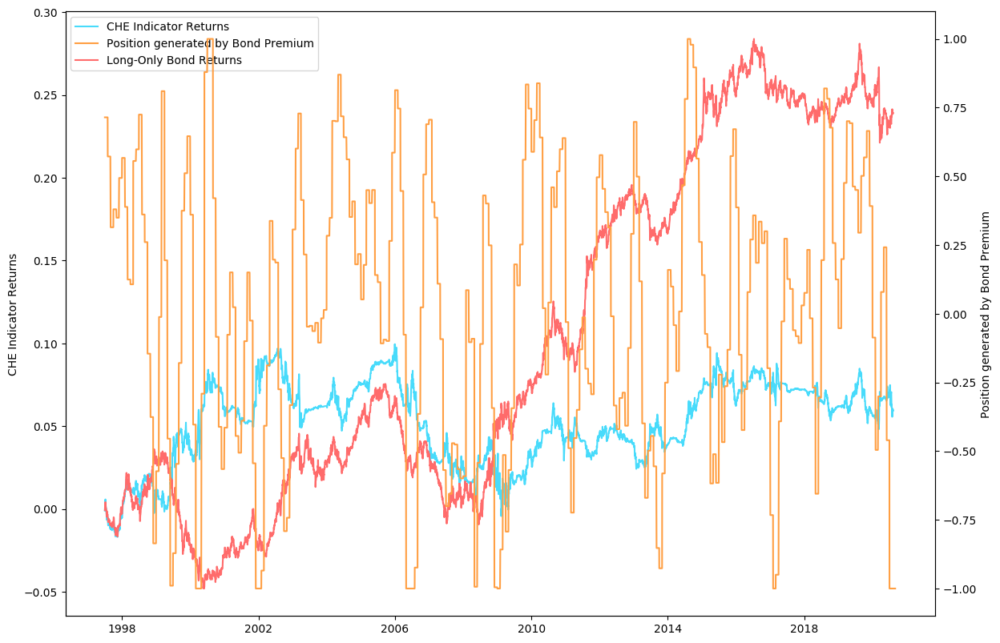

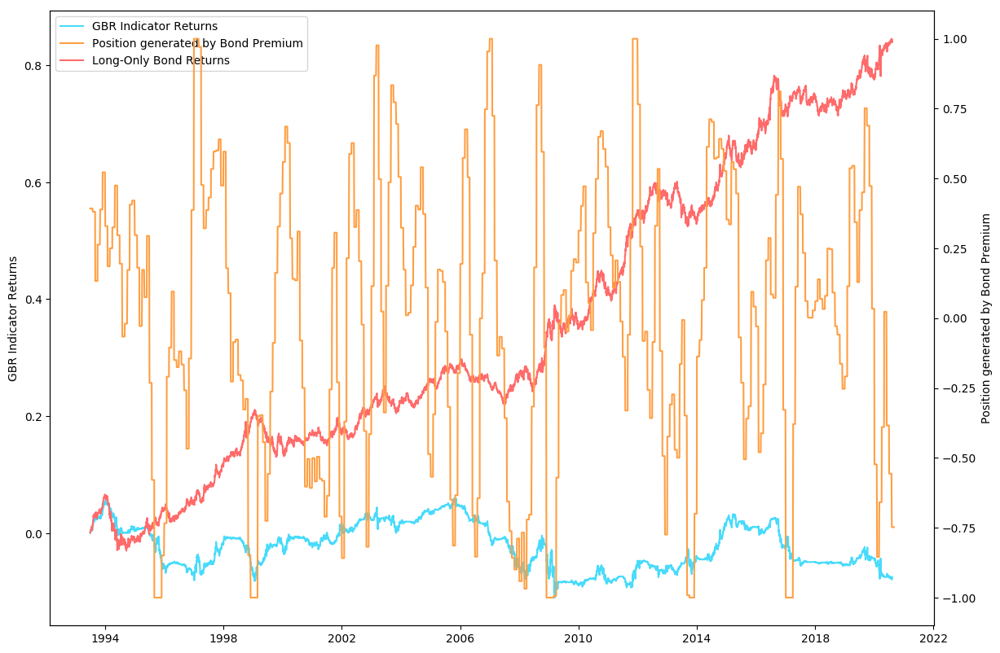

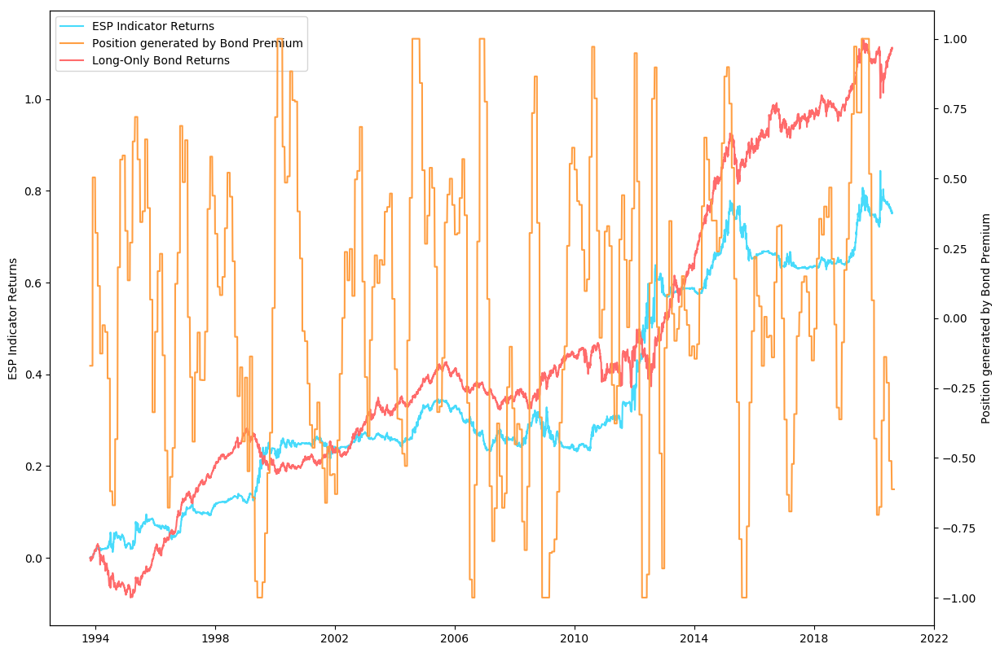

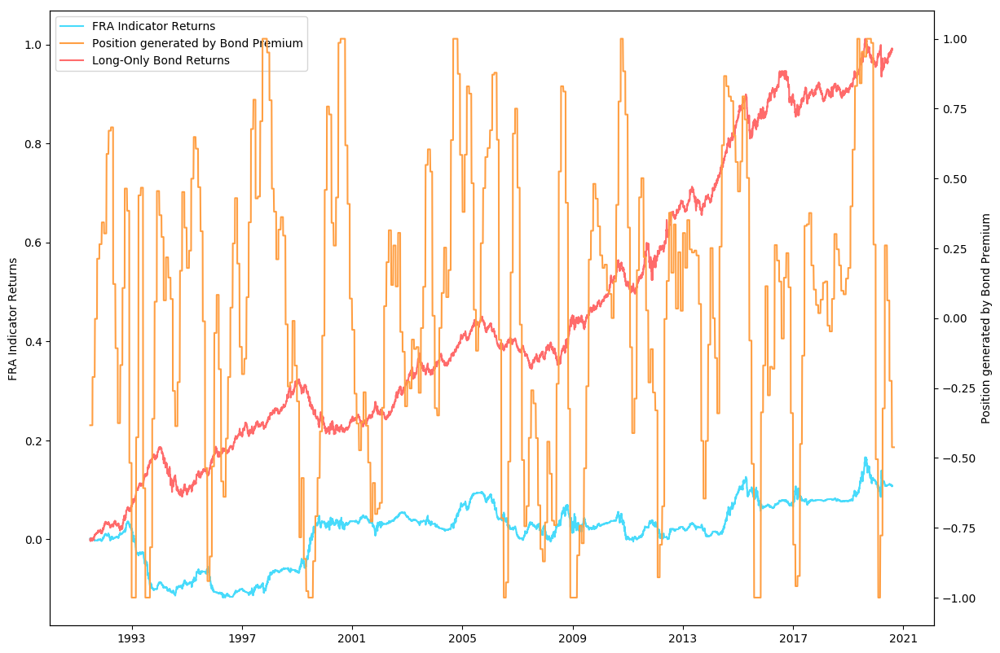

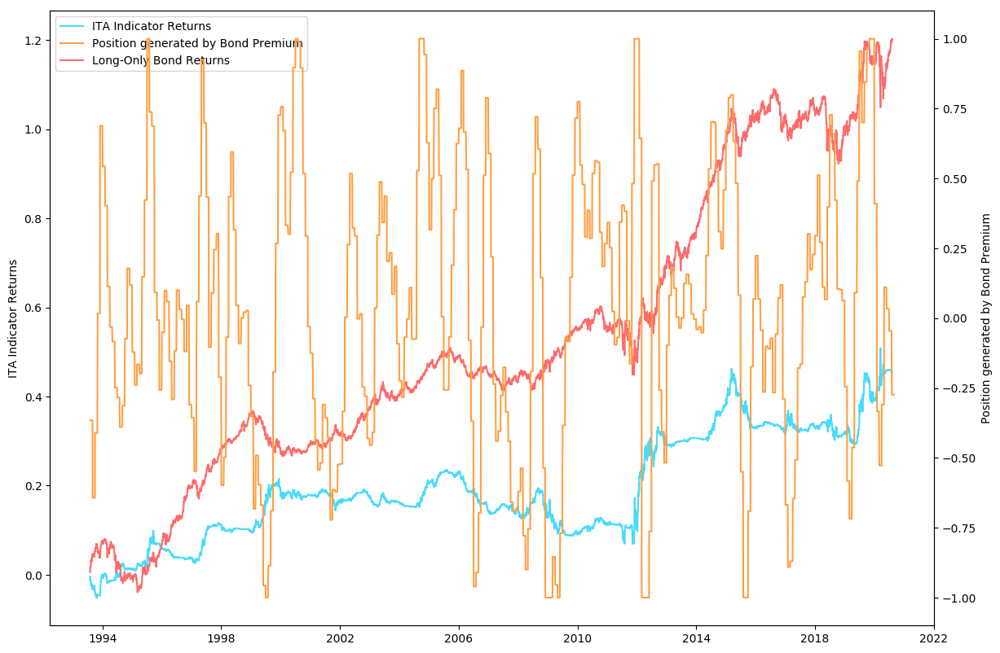

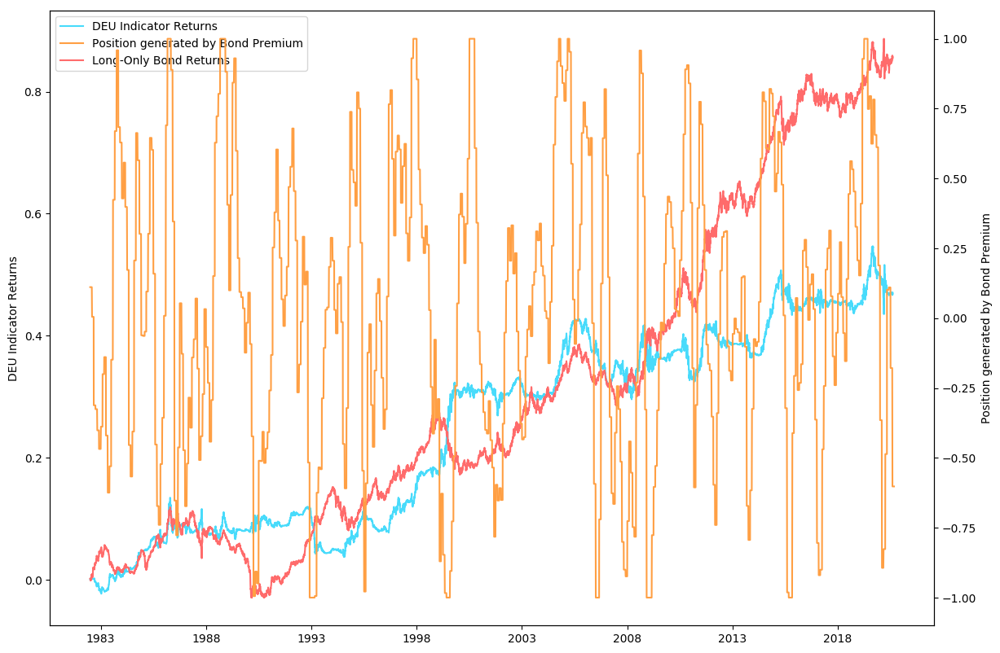

In [72]:
bpPositions = getPosition(bpZScore, 1, countries).resample('1B').ffill()

bpIndicatorReturns = bpPositions * hedgedReturnsDaily

plotReturns("Bond Premium", bpPositions, bpIndicatorReturns, hedgedReturnsDaily, countries, False)


In [73]:
bpWeight = 0.7
chWeight = 1 - bpWeight

bp_chPositions = bpWeight*bpPositions + chWeight*chPositions
bp_chIndicatorReturns = bp_chPositions * hedgedReturnsDaily

#plotReturns("Bond Premium + Curve Height Indicator", bp_chPositions, bp_chIndicatorReturns, hedgedReturnsDaily, countries, False)



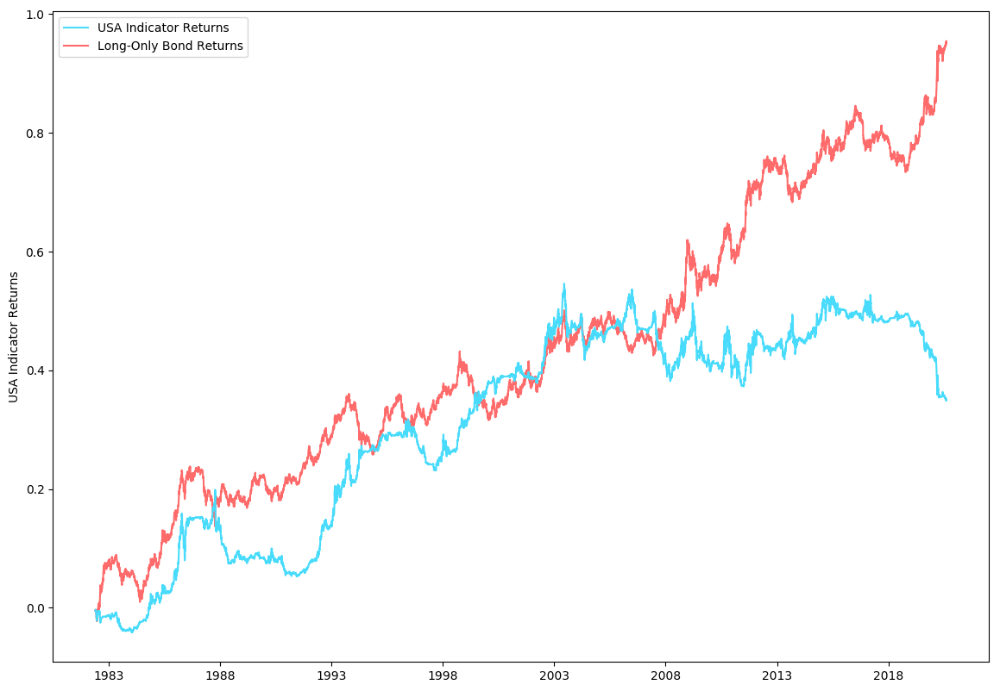

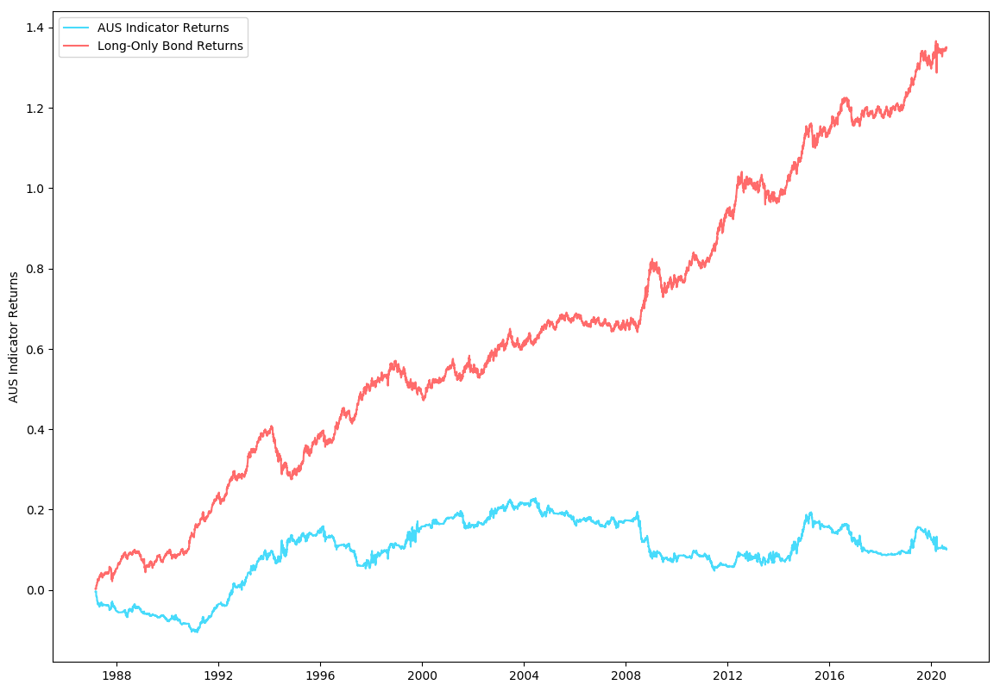

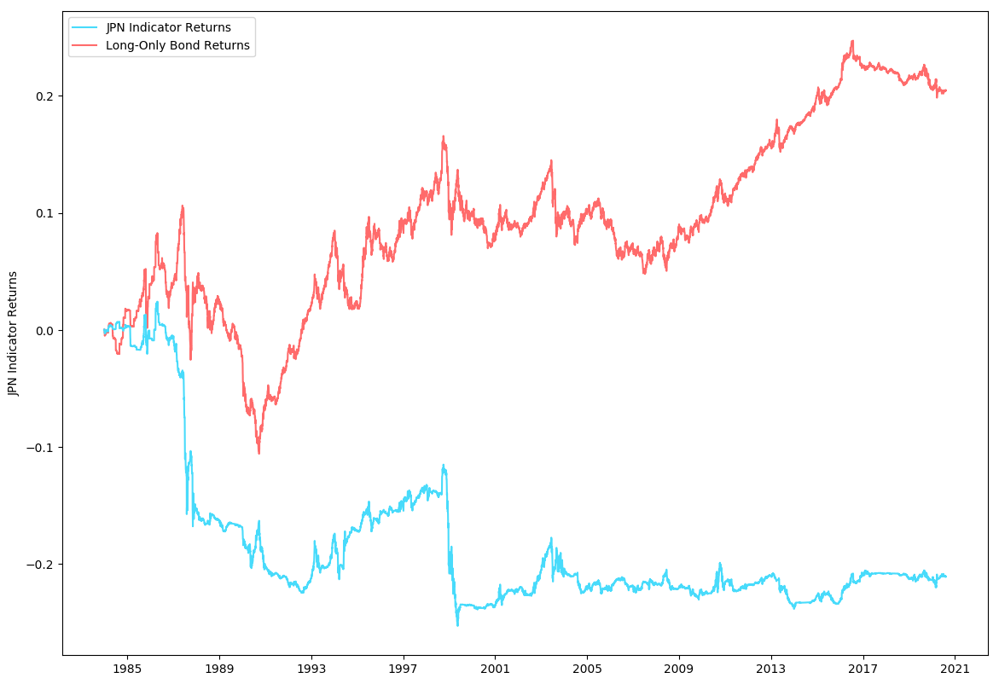

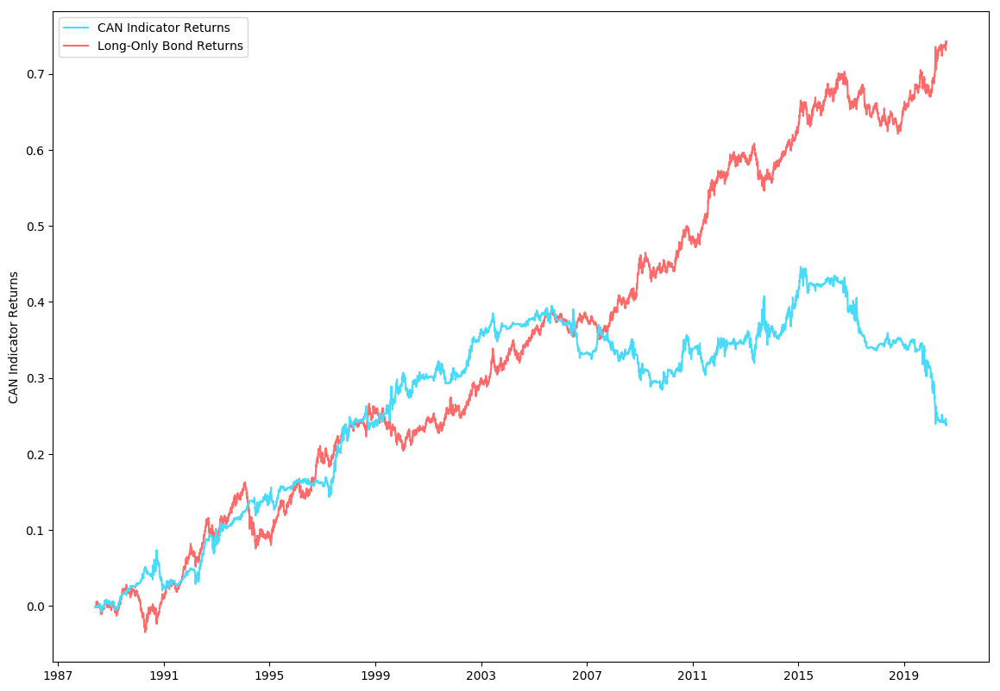

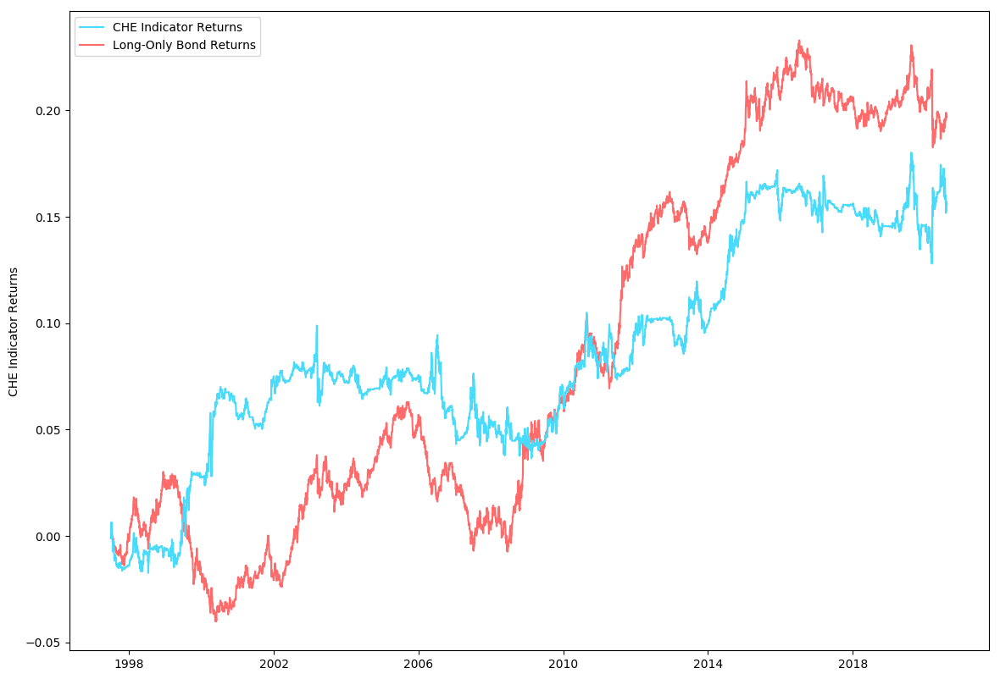

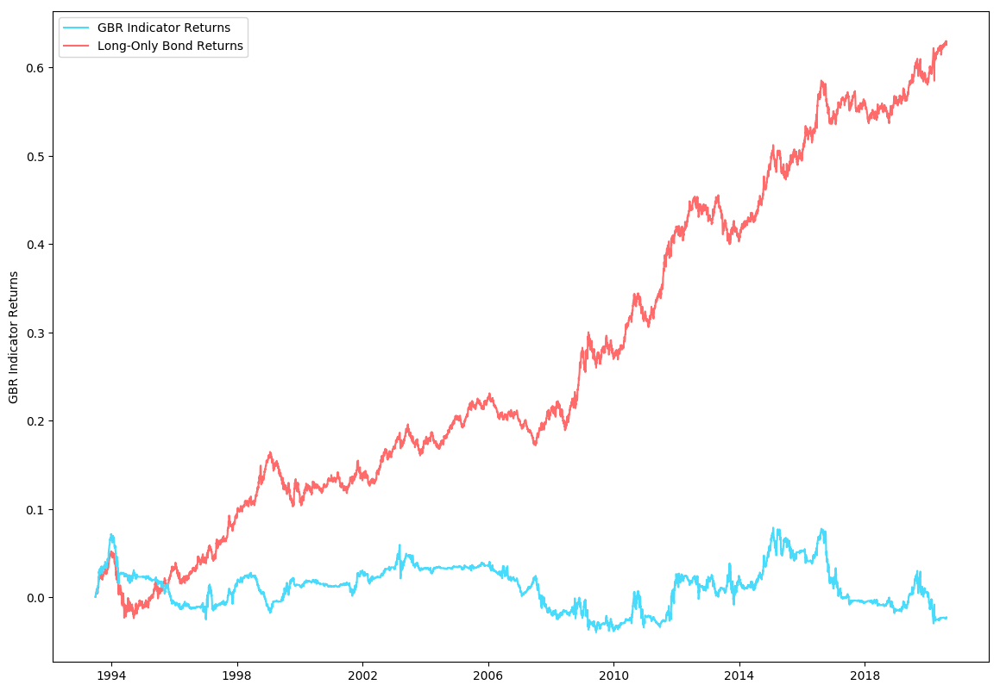

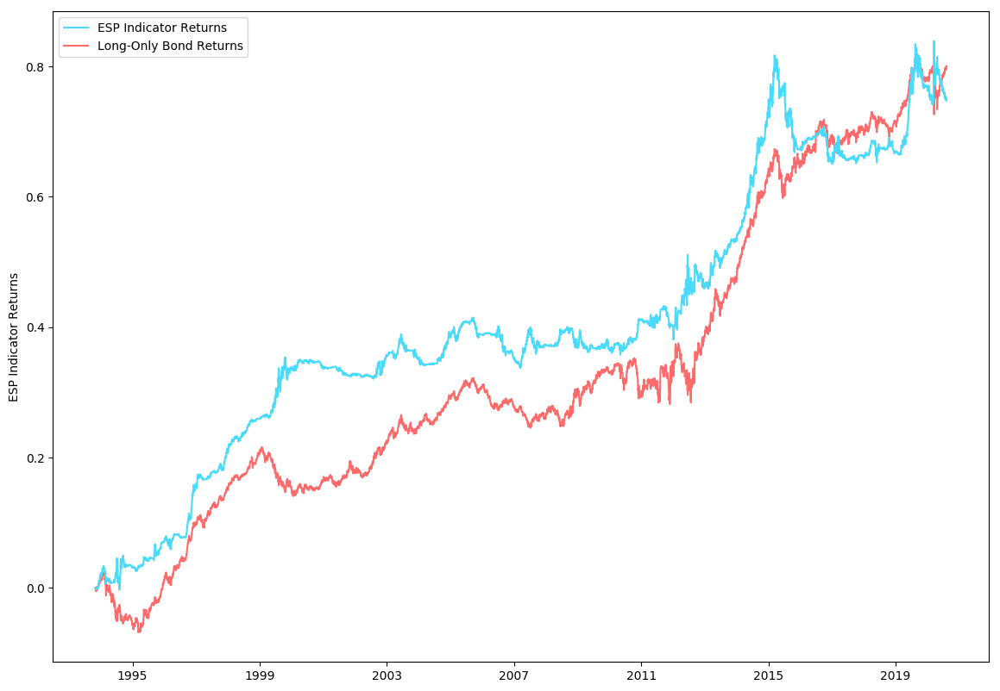

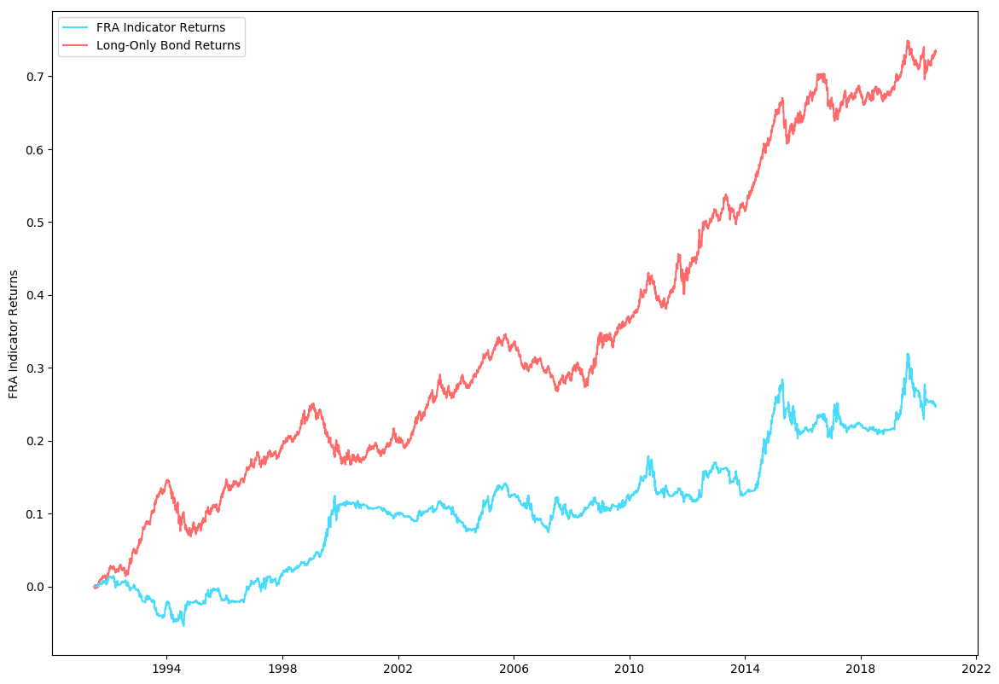

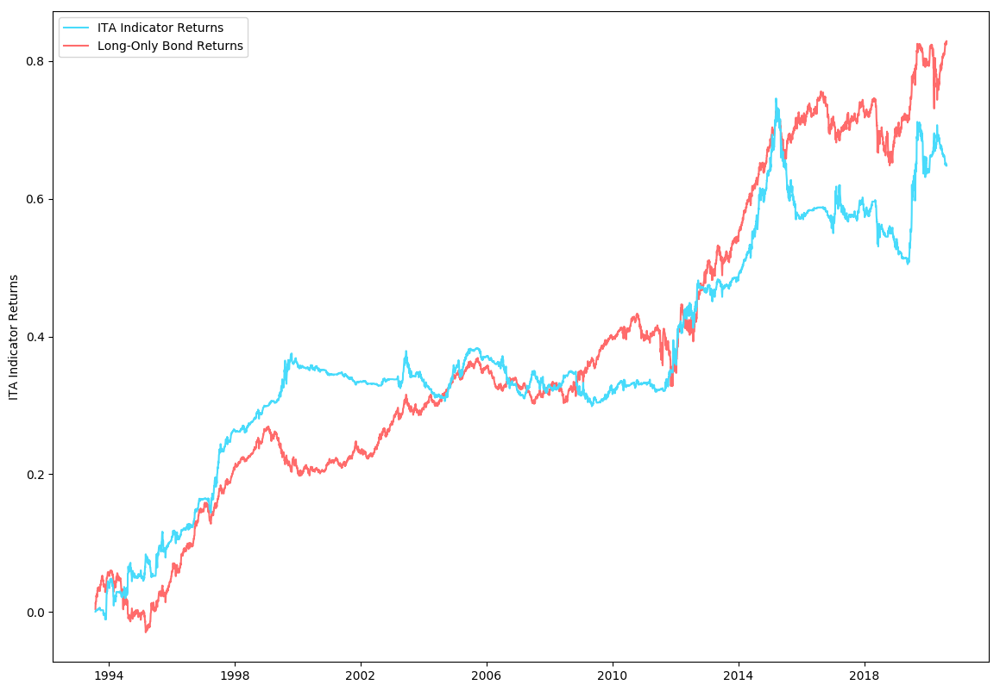

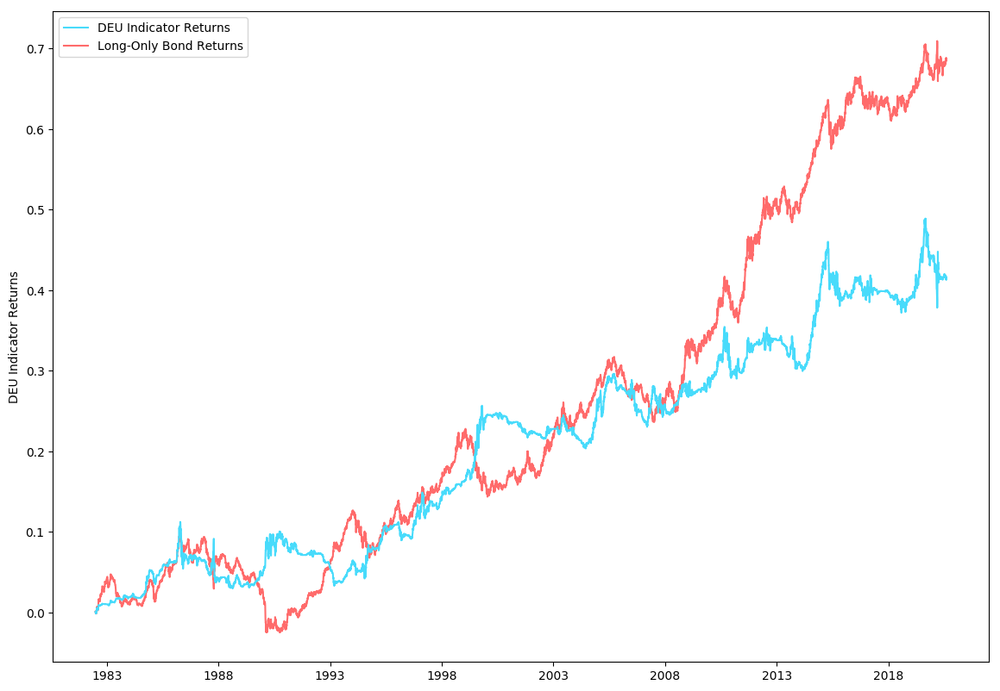

In [74]:
plotReturnsOnly("Bond Premium + Curve Height", bp_chIndicatorReturns, hedgedReturnsDaily, countries, 14, 10, False)



# FX Appreciation

### I used changes in the BIS Real Broad Effective Exchange Rate Index as a proxy for appreciation/depreciation of currency (the fxTrdWts data set included in the data library only had data for 5 of the 10 countries). I computed a 1x3 month rolling mean to capture changes in FX. FX appreciation/depreciation gives a forward-looking view into inflation expectations (through the lever of the increasing/decreasing foreign demand for a countries goods that occurs when a countries currency depreciates/appreciates). The indicator doesn't work perfectly for all countries (most notably the US, Japan, Switzerland, and Italy), but for the rest of the countries it performs moderately. I plan on refining this indicator further and hopefully improving the performance. It is worth noting, though, that in the countries where the indicator delivers positive returns, the returns of the indicator are largely uncorrelated with the returns of the long-only bond strategy.

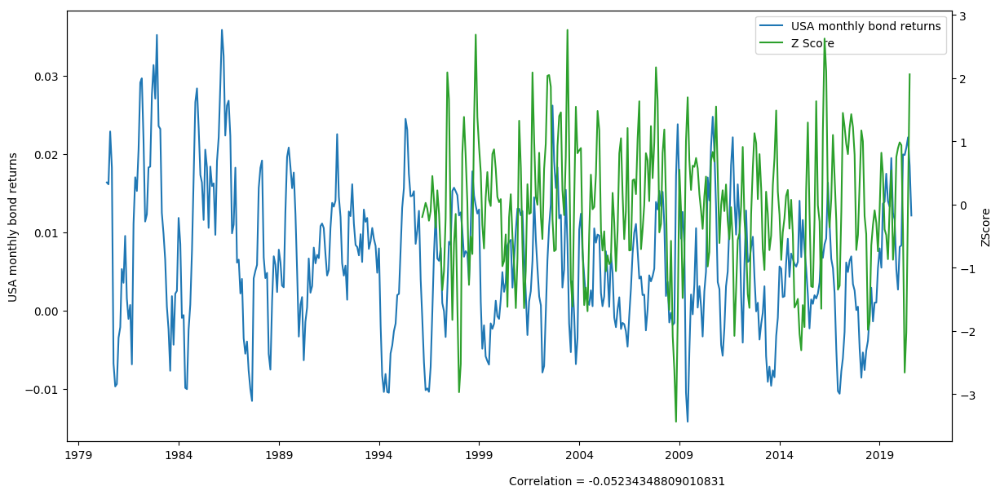

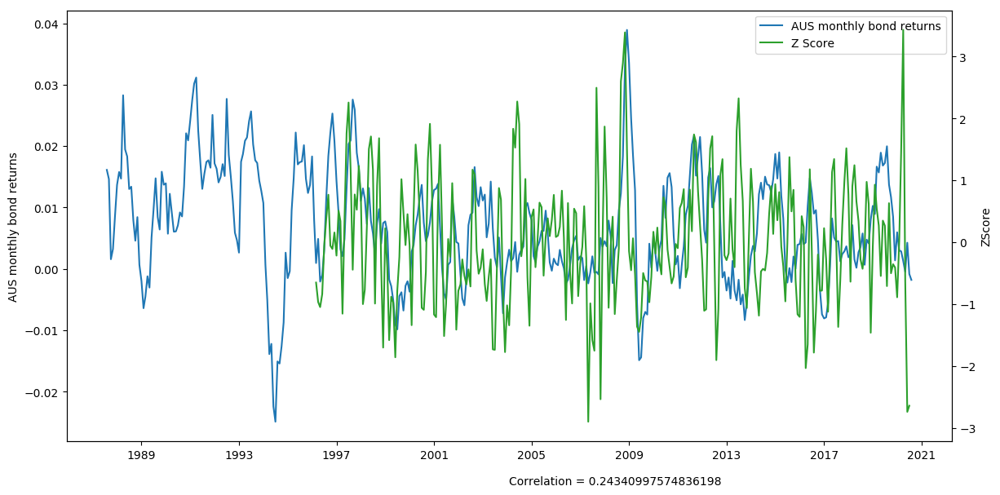

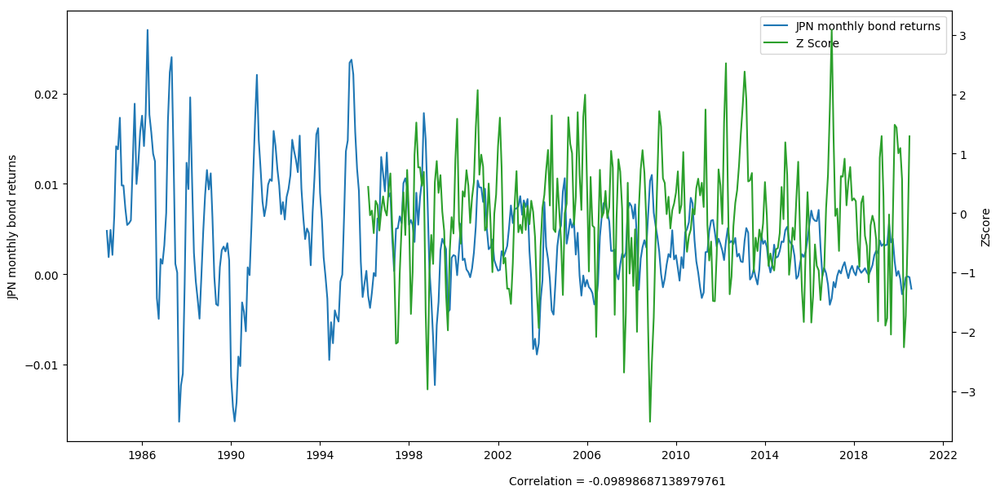

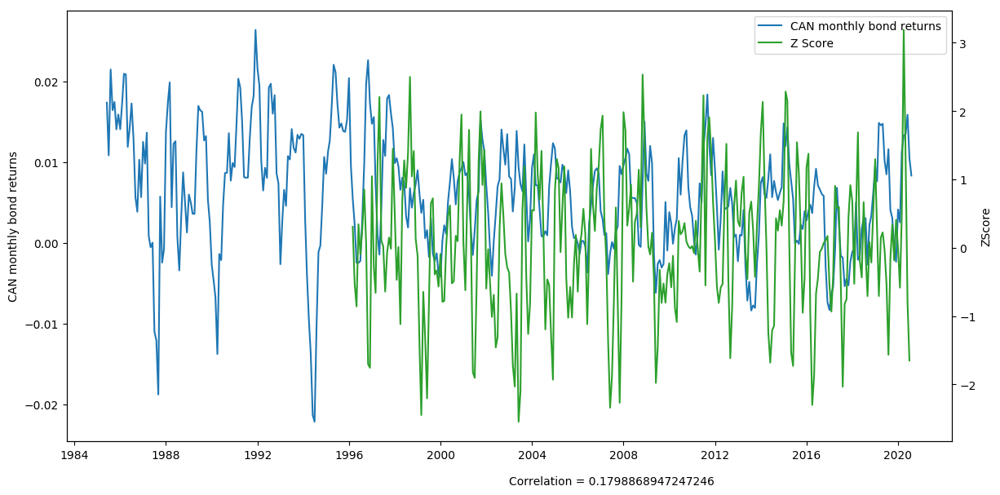

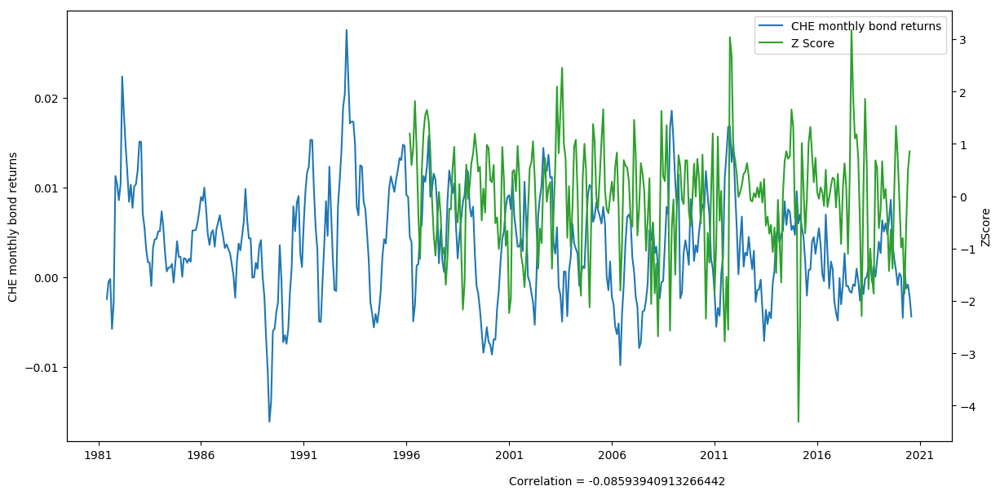

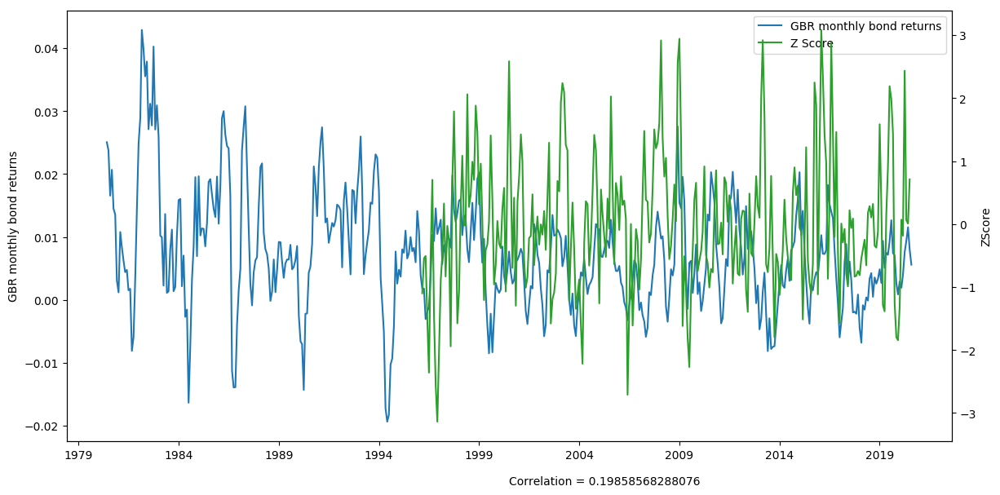

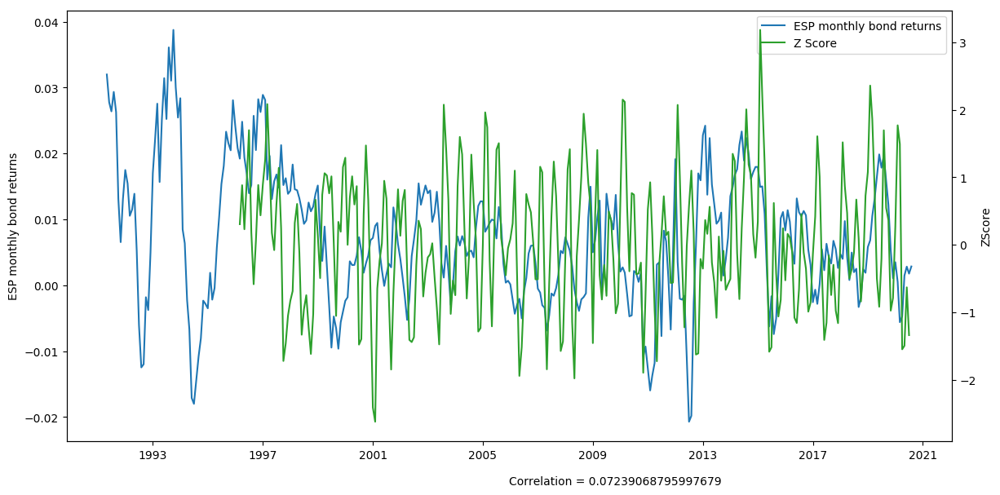

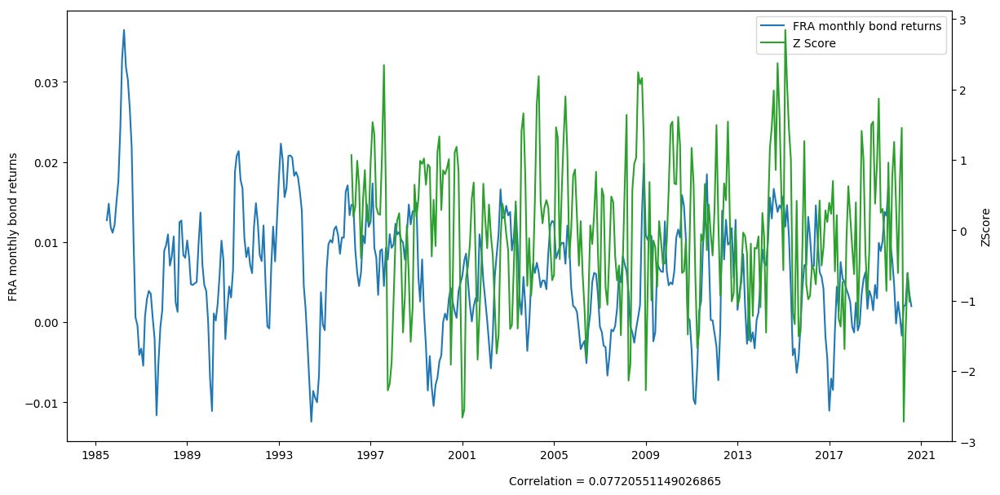

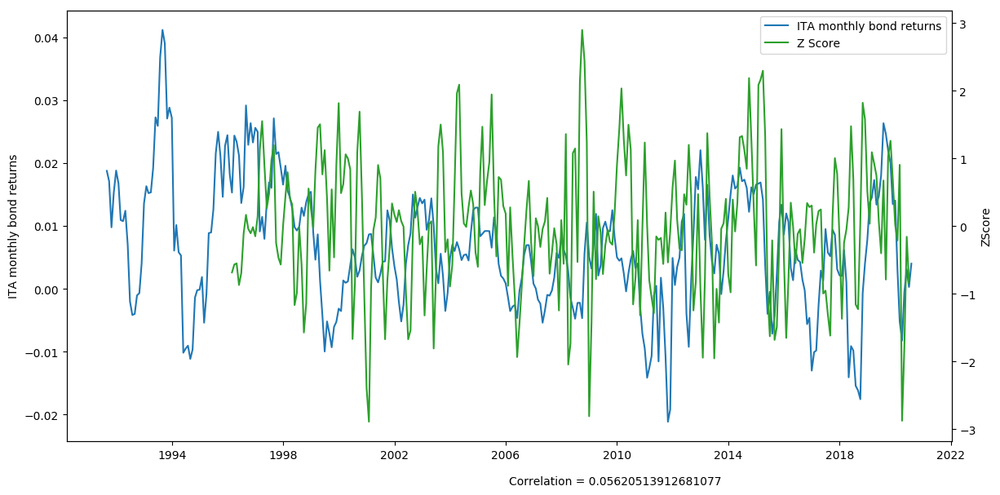

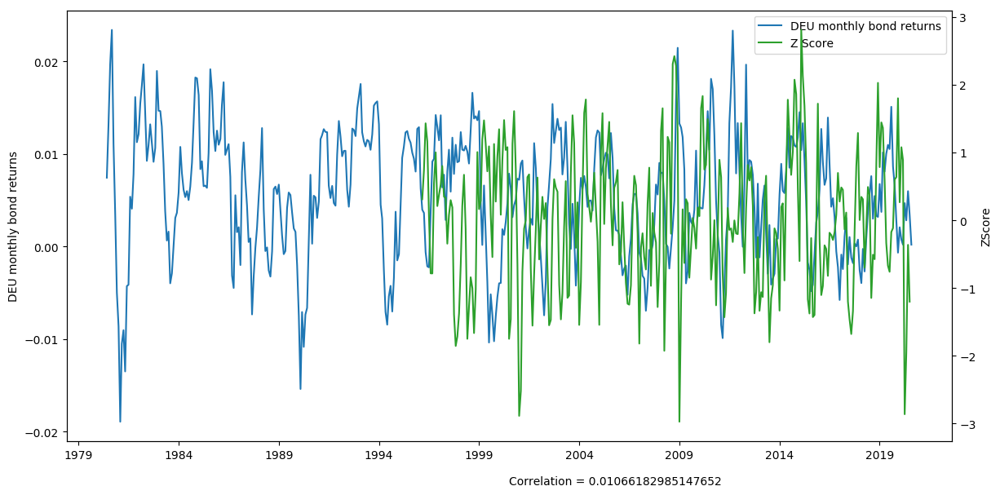

In [75]:
fx = dl.pull("bisRealBroadEffExchRateIndex")

fxBackend = fx.shift(periods=1).rolling(3).mean()

fxFrontend = fx.shift(periods=1).rolling(1).mean()

fxChange = fxFrontend - fxBackend

fxChangeRollingMean = fxChange.rolling(24).mean()

fxChangeRollingStdev = fxChange.rolling(24).std()

fxZScore = (fxChangeRollingMean - fxChange)/fxChangeRollingStdev

for country in countries:
    
    fig, ax1 = plt.subplots(figsize = (14,7))
    ax2 = ax1.twinx()
    ax1_label = country + ' monthly bond returns'
    ax2_label = 'ZScore'
    hr = ax1.plot(hedgedReturnsMonthly[country].to_timestamp(), color = 'tab:blue', label = ax1_label)
    
    fx = ax2.plot(fxZScore[country].to_timestamp(), color = 'tab:green', label = "Z Score")
    ax1.set_ylabel(ax1_label)
    ax2.set_ylabel(ax2_label)
    plots = hr + fx
    labels = [plot.get_label() for plot in plots]
    ax1.legend(plots, labels, loc="best")
    correlation = hedgedReturnsMonthly[country].corr(fxZScore[country])
    ax1.annotate("Correlation = " + str(correlation),xy = (0.5,-0.1),xycoords="axes fraction")
    plt.show()


In [76]:
fxPositions = getPosition(fxZScore, 1, countries).resample('1B').ffill()

fxIndicatorReturns = fxPositions * hedgedReturnsDaily

#plotReturns("FX Indicator", fxPositions, fxIndicatorReturns, hedgedReturnsDaily, countries, True)


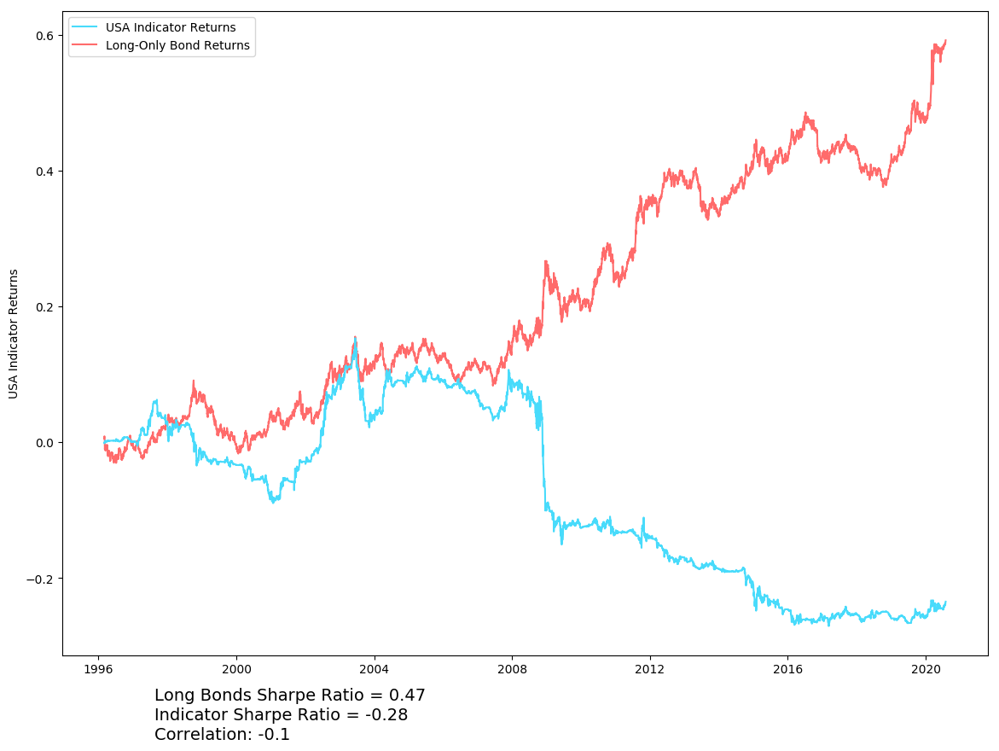

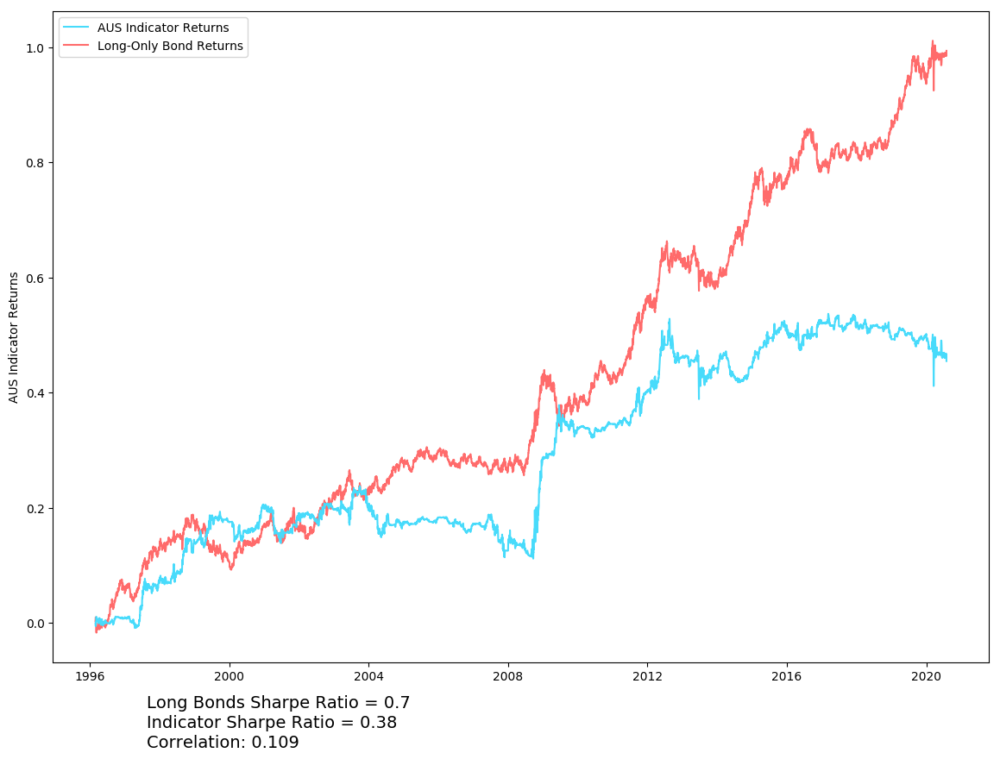

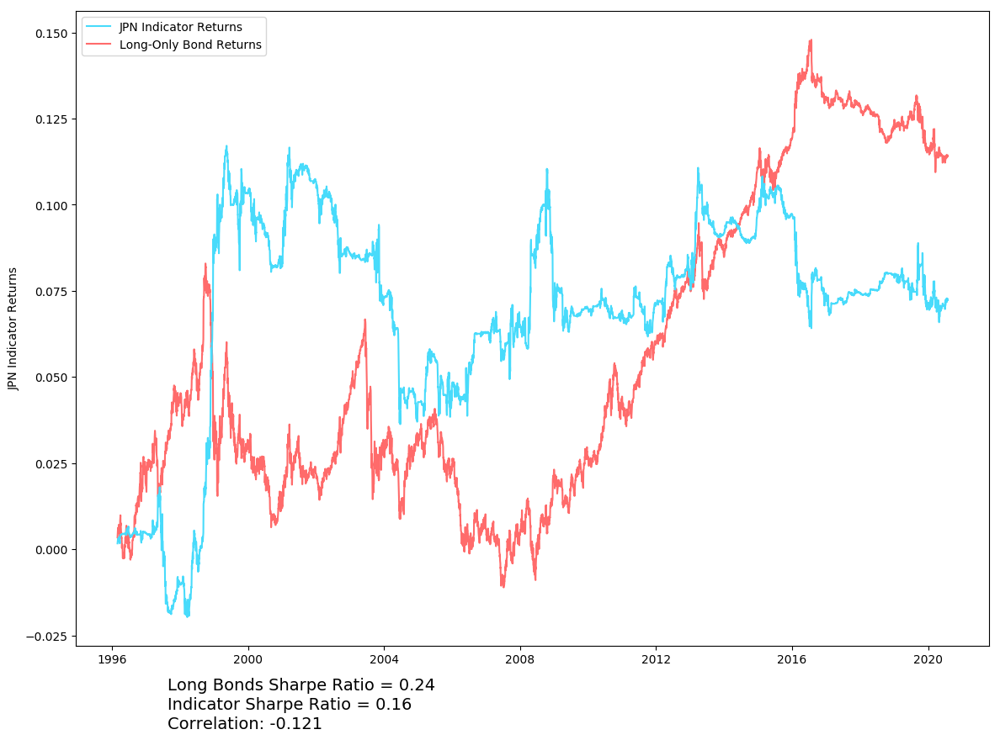

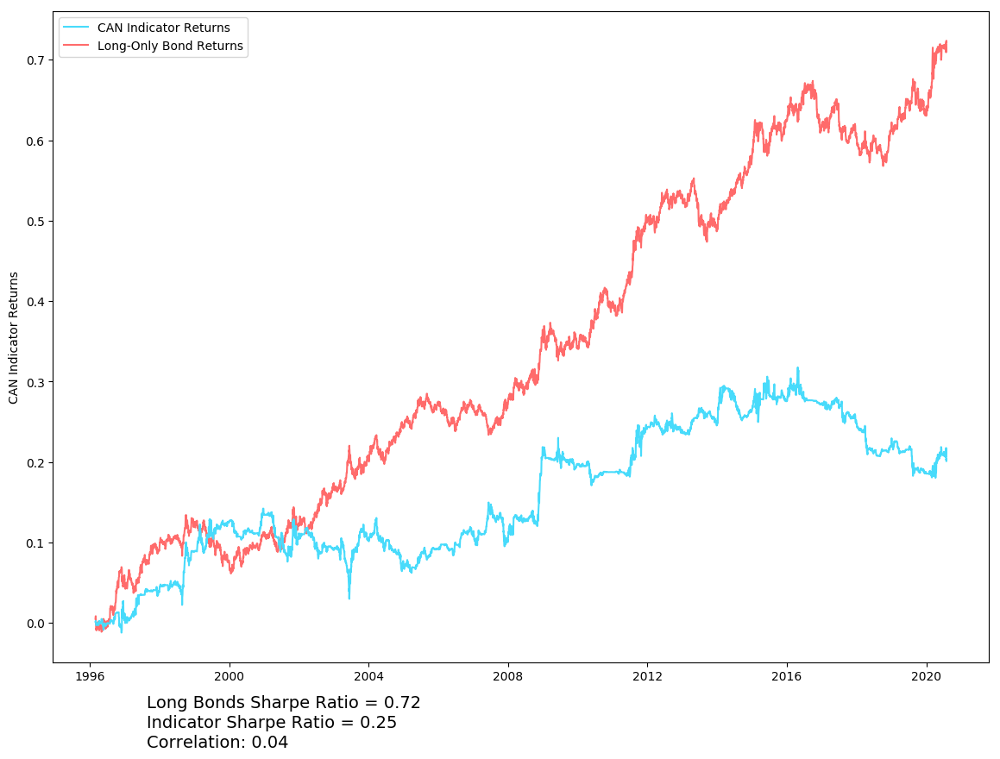

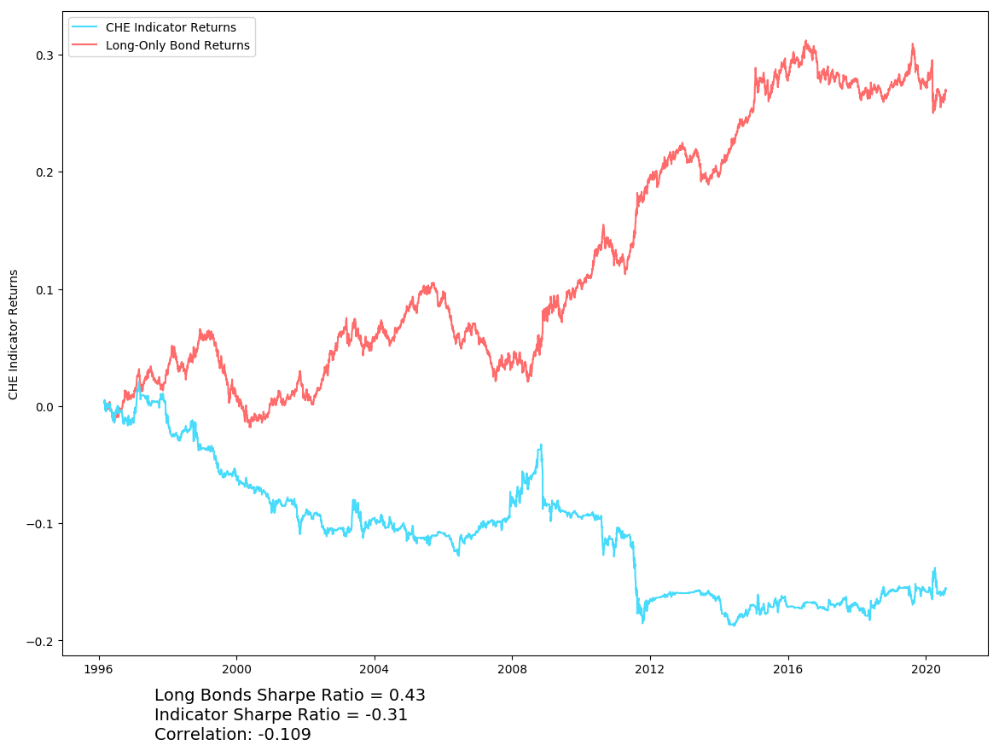

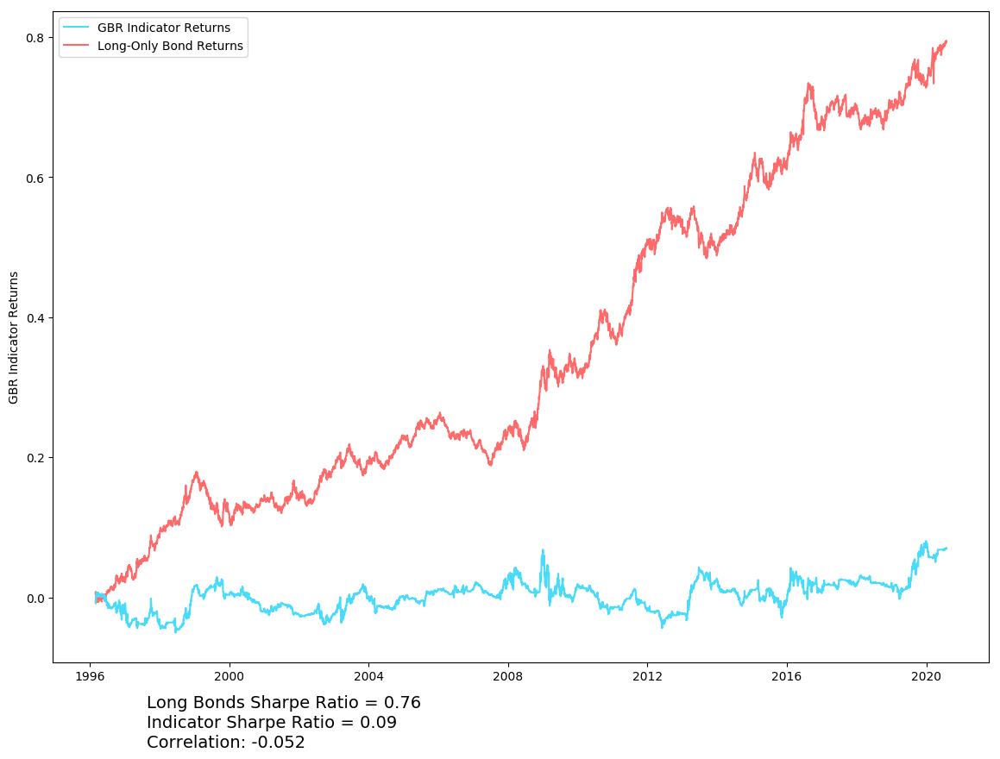

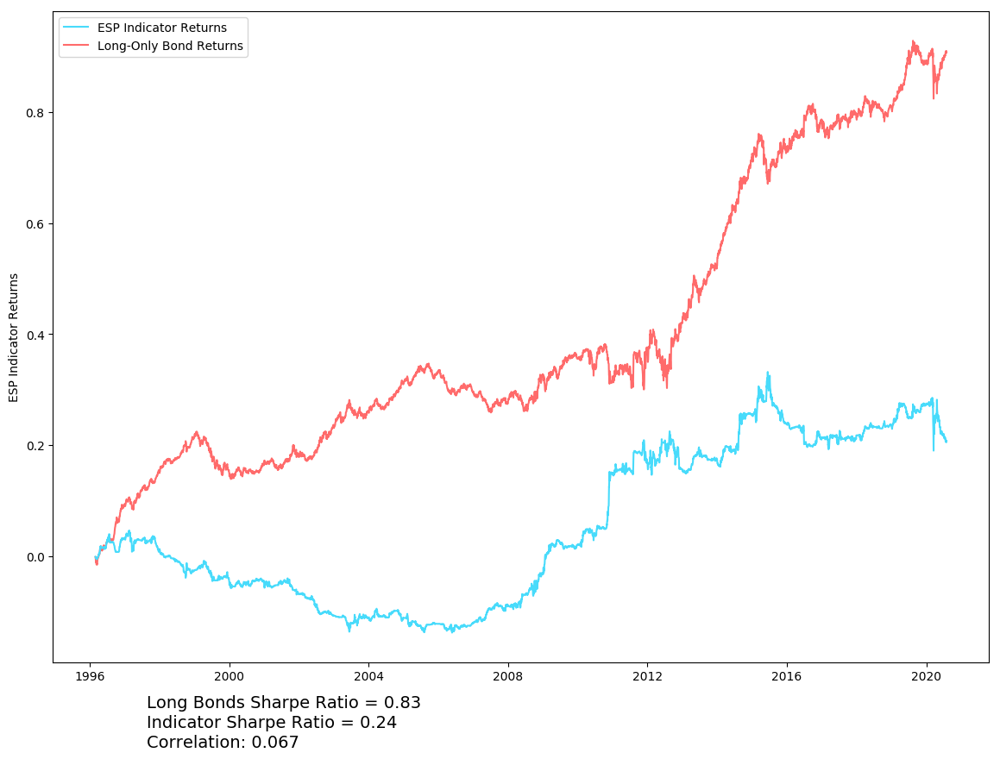

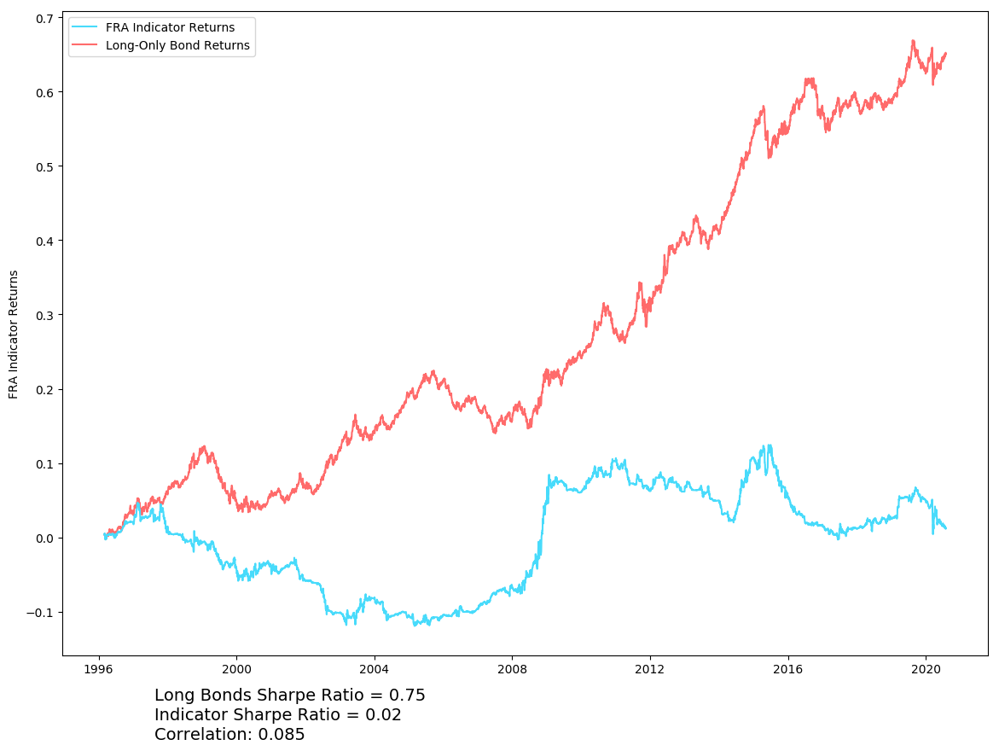

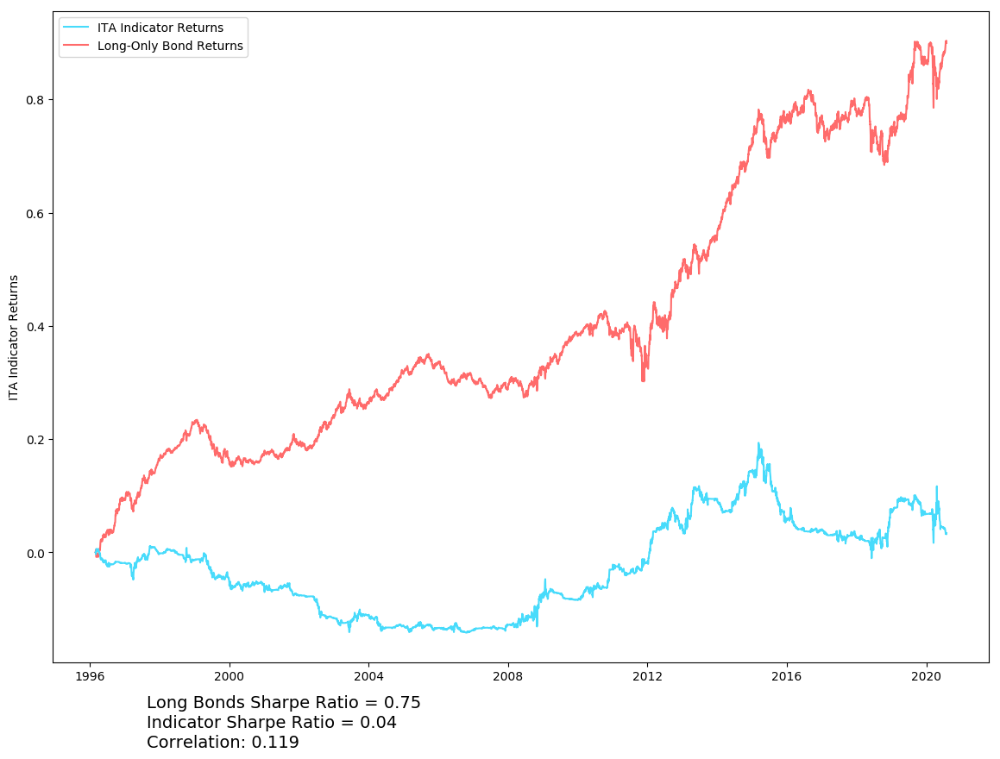

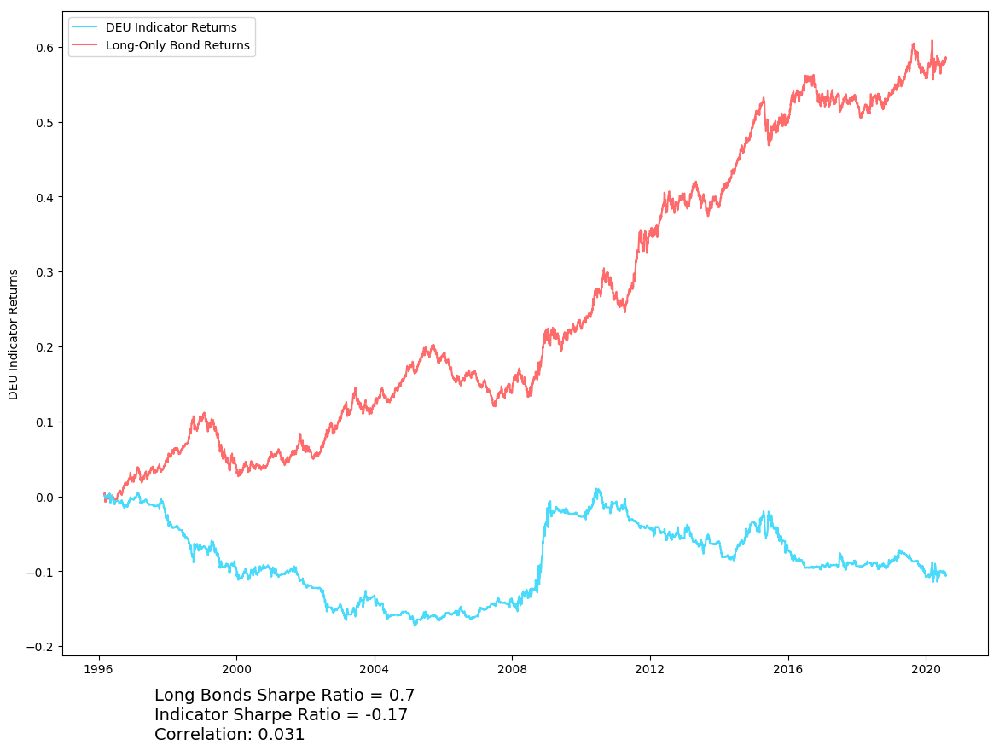

In [77]:
plotReturnsOnly("FX Indicator", fxIndicatorReturns, hedgedReturnsDaily, countries, 14, 10, True)



# Combining Indicators

In [78]:
caWeight = 1/3
bp_chWeight = 1/3
fxWeight = 1/3

combinedPositionsEvenWeight = caWeight * caPositions + bp_chWeight * bp_chPositions + fxWeight * fxPositions
combinedReturnsEvenWeight = combinedPositionsEvenWeight * hedgedReturnsDaily

#plotReturns("Indicator Average", combinedPositions, combinedReturns, hedgedReturnsDaily, countries, True)



In [79]:
def windowCumulativeProd(returnSeries):
    #returnSeries = returnSeries.dropna()
    return np.prod(1+returnSeries)-1

In [80]:
def trimDates(series, start, end):
    series = series[series.index <= end]
    series = series[series.index >= start]
    return series

In [81]:
def minimizeCorrelation(corrMat):
    # corrMat should be of the form: 
    #    ca   bp   fx
    # ca
    # bp
    # fx
    #  

    def objectiveFunction(w):
        return np.dot(np.dot(w, corrMat),np.transpose(w))
    
    def constraint1(w):
        return sum(w) - 1
    
    def constraint2(w):
        return w[0]
    
    def constraint3(w):
        return w[1]
    
    def constraint4(w):
        return w[2]
    
    def constraint5(w):
        return 1 - w[0]
    
    def constraint6(w):
        return 1 - w[1]
    
    def constraint7(w):
        return 1 - w[2]
    
    # set initial guess to equal weights
    w0 = [1/3, 1/3, 1/3]
    
    # constrain weights such that they must sum to 1, bound all weights to be between 0 and 1
    constraints = [{'type':'eq', 'fun': constraint1},
                   {'type':'ineq', 'fun': constraint2},
                   {'type':'ineq', 'fun': constraint3},
                   {'type':'ineq', 'fun': constraint4},
                   {'type':'ineq', 'fun': constraint5},
                   {'type':'ineq', 'fun': constraint6},
                   {'type':'ineq', 'fun': constraint7}]
    
    weights = minimize(fun=objectiveFunction, x0=w0, constraints=constraints)
    return weights

In [82]:
def getDateRange(caPositions_country, bpPositions_country, fxPositions_country):
    ca = caPositions_country.dropna()
    bp = bpPositions_country.dropna()
    fx = fxPositions_country.dropna()
    
    start = max(ca.index[0],bp.index[0],fx.index[0])
    end = min(ca.index[-1],bp.index[-1],fx.index[-1])
    
    return start, end

In [83]:
def getCorrelations(caPositions_country, bpPositions_country, fxPositions_country):
    
    ca = caPositions_country.dropna()
    bp = bpPositions_country.dropna()
    fx = fxPositions_country.dropna()

    start, end = getDateRange(ca, bp, fx)

    ca = trimDates(ca, start, end)
    bp = trimDates(bp, start, end)
    fx = trimDates(fx, start, end)

    df = pd.DataFrame({"ca": ca.values,
                       "bp": bp.values,
                       "fx": fx.values})
    
    return df.corr()

In [84]:
def getCorrUntilDateInclusive(caPositions_country, bpPositions_country, fxPositions_country, date):
    ca = caPositions_country[caPositions_country.index <= date]
    bp = bpPositions_country[bpPositions_country.index <= date]
    fx = fxPositions_country[fxPositions_country.index <= date]
    
    corr = getCorrelations(ca, bp, fx)
    
    return corr
    

In [85]:
# generate "expanding" correlations for indicators

def generateCorrelationSeries(caPositions_country, bpPositions_country, fxPositions_country):
    start, end = getDateRange(caPositions_country, bpPositions_country, fxPositions_country)
    
    ca = trimDates(caPositions_country, start, end)
    bp = trimDates(bpPositions_country, start, end)
    fx = trimDates(fxPositions_country, start, end)
    
    dates = ca.index
  
    corrMatSeries = []
    for date in tqdm(dates):
        corrMatSeries.append(getCorrUntilDateInclusive(ca, bp, fx, date))
    corrMatSeries = pd.Series(data = corrMatSeries, index = dates)
    return corrMatSeries, start, end

In [86]:
# compute min. covariance weight series

def generateWeightSeries(caPositions_country, bpPositions_country, fxPositions_country):
    corrMatSeries, start, end = generateCorrelationSeries(caPositions_country, bpPositions_country, fxPositions_country)
    ca = trimDates(caPositions_country, start, end)
    bp = trimDates(bpPositions_country, start, end)
    fx = trimDates(fxPositions_country, start, end)
    
    dates = ca.index.values
    
    caWeights = []
    bpWeights = []
    fxWeights = []
    
    for date in tqdm(dates):
        weights = minimizeCorrelation(corrMatSeries[date]).x.tolist()
        caWeights.append(weights[0])
        bpWeights.append(weights[1])
        fxWeights.append(weights[2])
    d = {"caWeights": caWeights, "bpWeights": bpWeights, "fxWeights": fxWeights}
    weightSeries = pd.DataFrame(data = d, index = dates)
    
    return weightSeries
    

In [87]:
def computeSharpe(returnSeries):
    returnSeries = returnSeries.dropna()
    tradingDaysPerYear = 261
    dailyRet = gmean(1+returnSeries) - 1
    riskAdjustedRet = ((1 + dailyRet)**tradingDaysPerYear - 1)/(np.std(returnSeries)*np.sqrt(tradingDaysPerYear))
    
    return riskAdjustedRet


In [88]:
def computeBackwardLookingSharpe(returnSeries, windowLength):
    
    returnSeries = returnSeries.dropna()
    
    backwardLookingSharpe = returnSeries.rolling(windowLength).apply(computeSharpe,raw=False)
    return backwardLookingSharpe

In [89]:
def generateSharpeWeights(countryDf, windowLength):
    ca = computeBackwardLookingSharpe(countryDf["Current Account Indicator"].shift(1), windowLength)
    bp = computeBackwardLookingSharpe(countryDf["Bond Premium + Curve Height Indicator"].shift(1), windowLength)
    fx = computeBackwardLookingSharpe(countryDf["FX Indicator"].shift(1), windowLength)

    ca[ca < 0] = 0
    bp[bp < 0] = 0
    fx[fx < 0] = 0
    totalSharpe = ca + bp + fx
    caWeights = ca / totalSharpe
    bpWeights = bp / totalSharpe
    fxWeights = fx / totalSharpe

    return caWeights, bpWeights, fxWeights


In [90]:
def plotCountry(countryDf, countryBondReturns, title, width, height):
    fig, ax = plt.subplots(figsize = (width,height))
    plot1 = ax.plot((np.cumprod(1+countryDf["Combined Signal"])-1).to_timestamp(),color=slate,label="Combined Signal Return", zorder=10000)
    plot2 = ax.plot((np.cumprod(1+countryDf["Current Account Indicator"])-1).to_timestamp(),color=green,label="Curr. Account Indicator Return")
    plot3 = ax.plot((np.cumprod(1+countryDf["Bond Premium + Curve Height Indicator"])-1).to_timestamp(),color=blue,label="Bond Prem. Curve Height Indicator Return")
    plot4 = ax.plot((np.cumprod(1+countryDf["FX Indicator"])-1).to_timestamp(),color=red,label="FX Indicator Return")
    
    plots = plot1 + plot2 + plot3 + plot4
        
    dates = getDates(countryDf["Combined Signal"].dropna())
    countryBondReturns = countryBondReturns[dates]
    firstValid = countryDf["Combined Signal"].first_valid_index()
    
    sharpe = computeSharpe(countryDf["Combined Signal"])
    
    labels = [plot.get_label() for plot in plots]
    ax.legend(plots, labels, loc="best")
    
    riskAdjustedRet_bonds = computeSharpe(countryBondReturns)
    
    corr = countryDf["Combined Signal"].corr(countryBondReturns)
    
    ax.annotate("Long Bonds Sharpe Ratio = " + str(round(riskAdjustedRet_bonds,3)),xy = (0.1,-0.06),xycoords="axes fraction",fontsize=14)
    ax.annotate("Signal Sharpe Ratio = " + str(round(sharpe,3)),xy = (0.1,-0.09),xycoords="axes fraction",fontsize=14)
    ax.annotate("Correlation = " + str(round(corr,3)),xy = (0.1,-0.12),xycoords="axes fraction",fontsize=14)
    
    #ax.grid()
    plt.ylabel("Excess Returns")
    
    plt.title(title)
    plt.show()
    return sharpe


# Even Weighting

In [91]:
usa = pd.DataFrame()
aus = pd.DataFrame()
jpn = pd.DataFrame()
can = pd.DataFrame()
che = pd.DataFrame()
gbr = pd.DataFrame()
esp = pd.DataFrame()
fra = pd.DataFrame()
ita = pd.DataFrame()
deu = pd.DataFrame()

comboPlots = {"USA": usa, "AUS": aus, "JPN": jpn, 
              "CAN": can, "CHE": che, "GBR": gbr, 
              "ESP": esp, "FRA": fra, "ITA": ita, 
              "DEU": deu}

for country in countries:
    comboPlots[country]["Combined Signal"] = combinedReturnsEvenWeight[country]
    comboPlots[country]["Current Account Indicator"] = caIndicatorReturns[country]
    comboPlots[country]["Bond Premium + Curve Height Indicator"] = bp_chIndicatorReturns[country]
    comboPlots[country]["FX Indicator"] = fxIndicatorReturns[country]
    


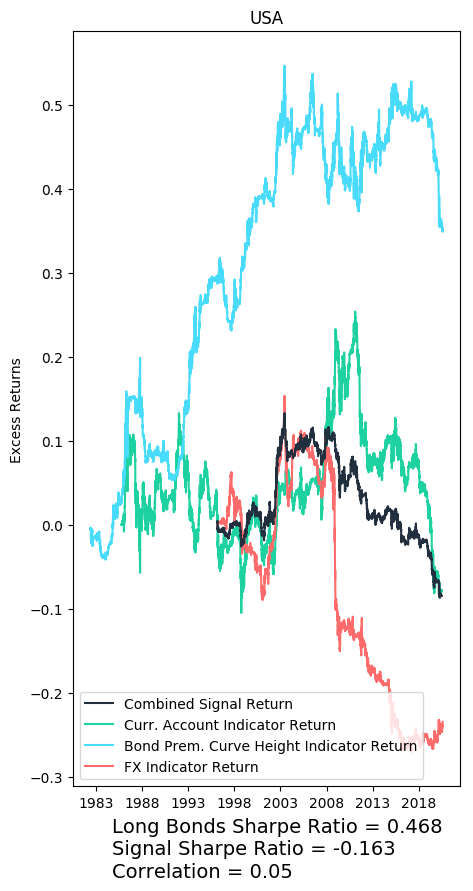

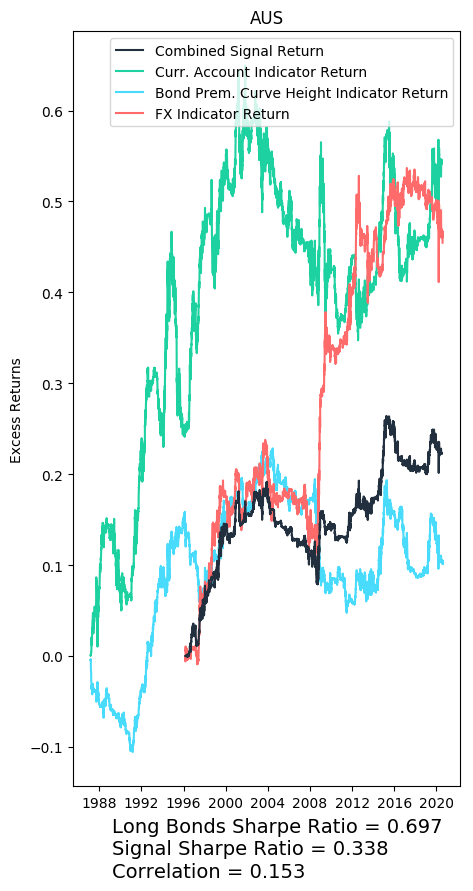

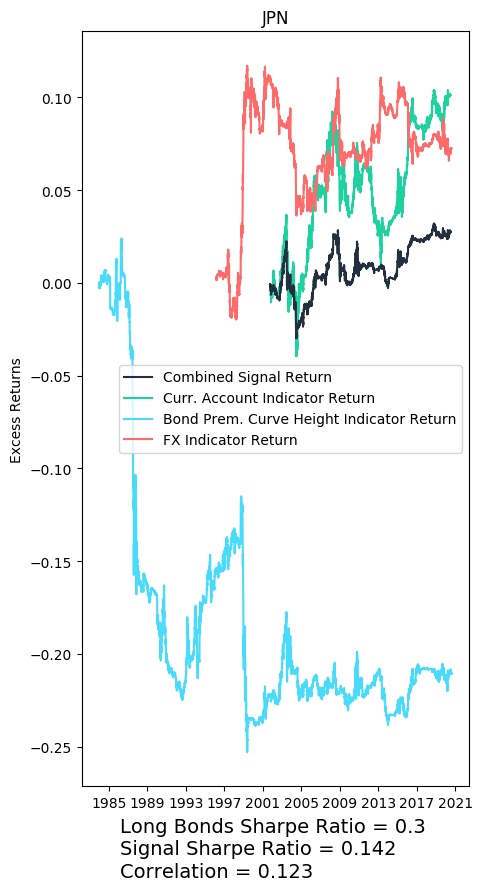

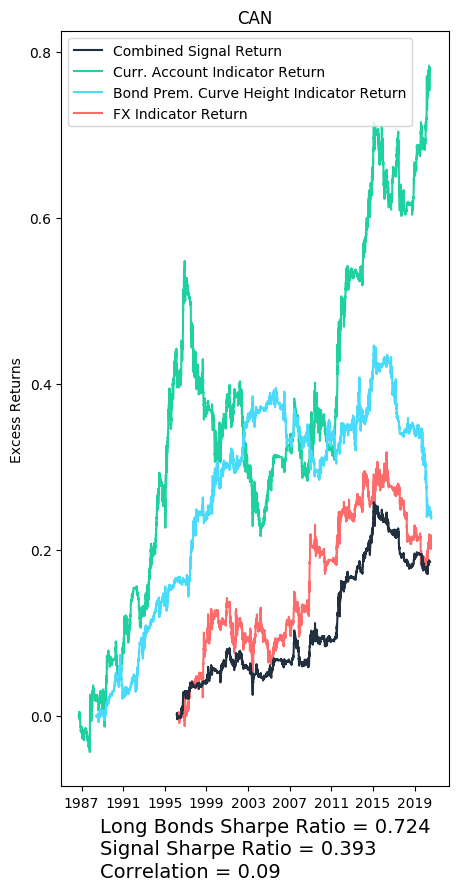

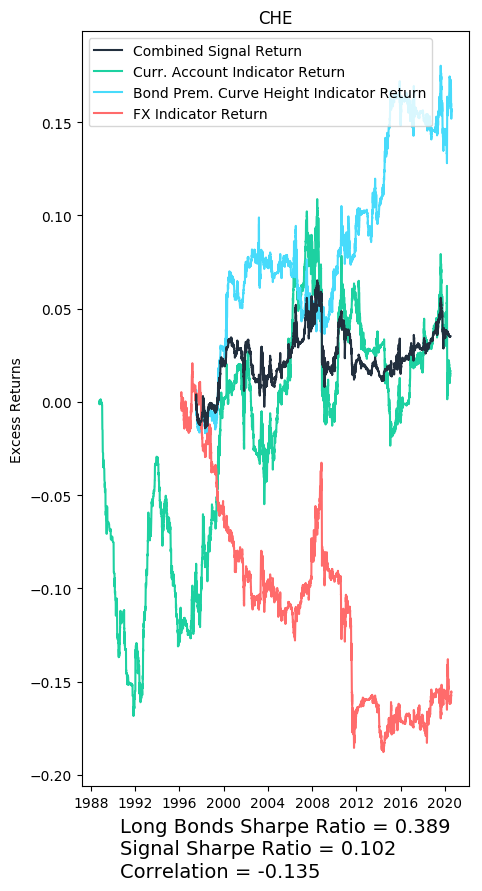

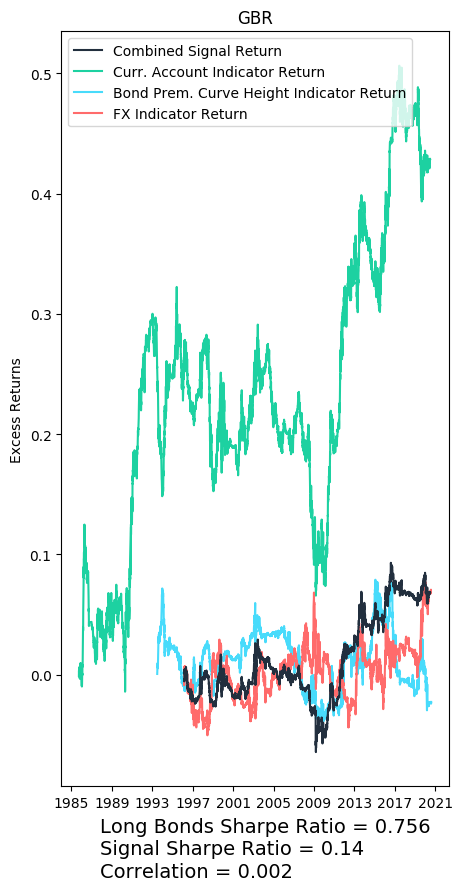

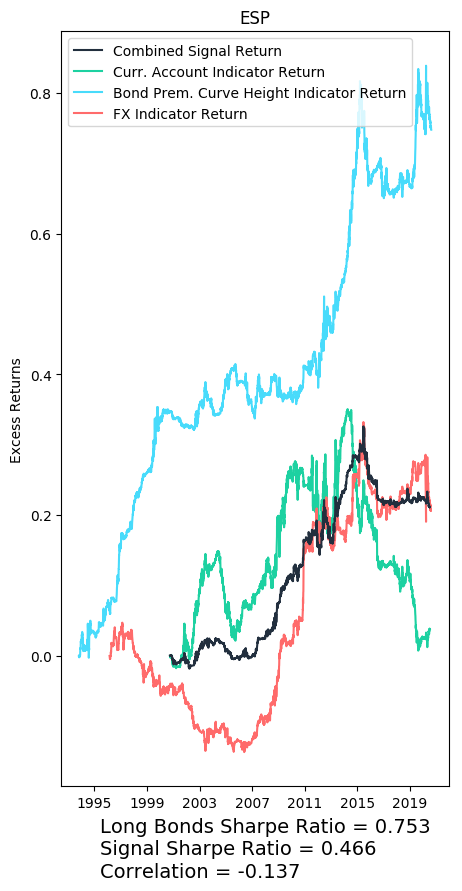

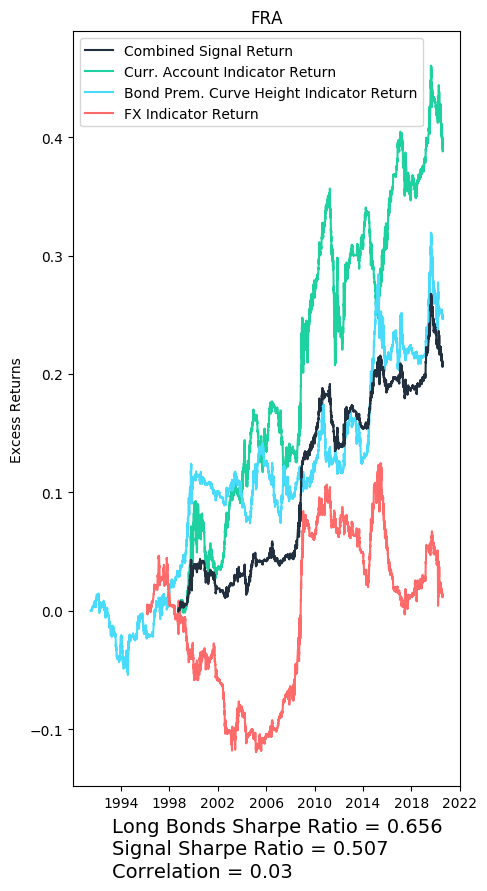

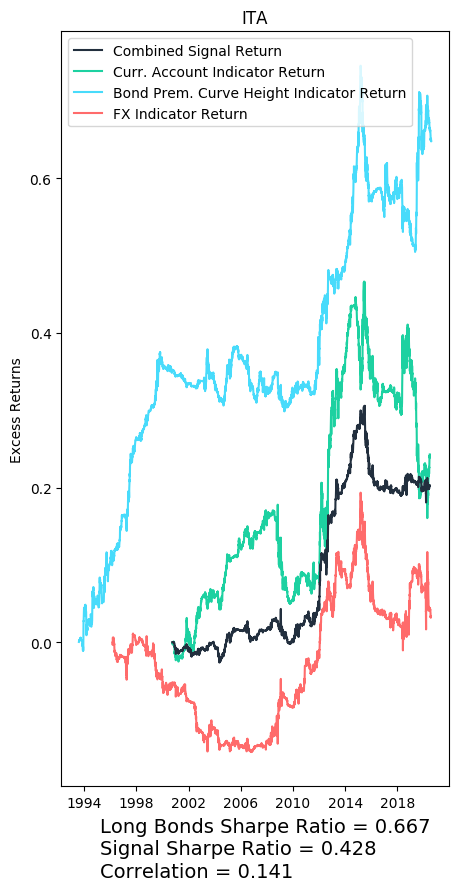

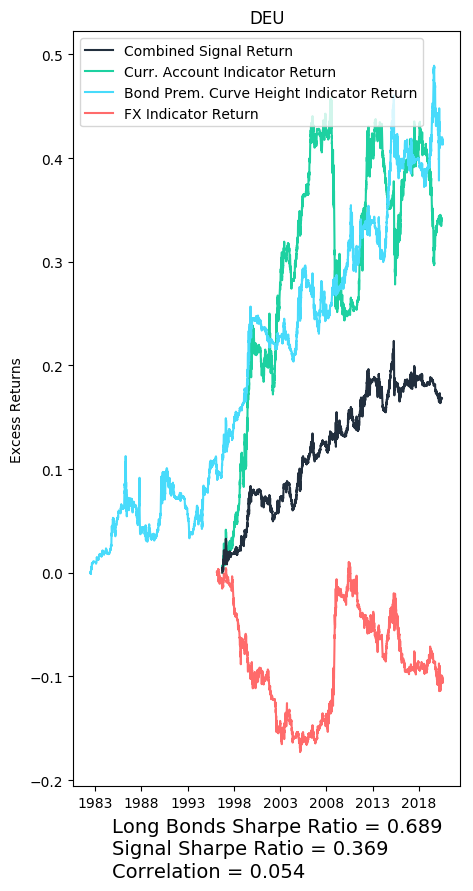

In [92]:
## Even weighting
for country in comboPlots.keys():
    plotCountry(comboPlots[country],hedgedReturnsDaily[country], country, 5, 10)

# Rolling Sharpe Weighting Approach

In [93]:
usa2 = pd.DataFrame()
aus2 = pd.DataFrame()
jpn2 = pd.DataFrame()
can2 = pd.DataFrame()
che2 = pd.DataFrame()
gbr2 = pd.DataFrame()
esp2 = pd.DataFrame()
fra2 = pd.DataFrame()
ita2 = pd.DataFrame()
deu2 = pd.DataFrame()

comboPlotsSharpeWeighted = {"USA": usa2, "AUS": aus2, "JPN": jpn2, 
                            "CAN": can2, "CHE": che2, "GBR": gbr2, 
                            "ESP": esp2, "FRA": fra2, "ITA": ita2, 
                            "DEU": deu2}

for country in tqdm(countries):
    
    
    comboPlotsSharpeWeighted[country]["Current Account Indicator"] = caIndicatorReturns[country]
    comboPlotsSharpeWeighted[country]["Bond Premium + Curve Height Indicator"] = bp_chIndicatorReturns[country]
    comboPlotsSharpeWeighted[country]["FX Indicator"] = fxIndicatorReturns[country]
    
    caWeights, bpWeights, fxWeights = generateSharpeWeights(comboPlotsSharpeWeighted[country], 65)
    
    combinedPositionsSharpeWeighted = caWeights * caPositions[country] + bpWeights * bp_chPositions[country] + fxWeights * fxPositions[country]
    combinedReturnsSharpeWeighted = combinedPositionsSharpeWeighted * hedgedReturnsDaily['USA']

    firstValid = combinedReturnsSharpeWeighted.first_valid_index()
    combinedReturnsSharpeWeighted = combinedReturnsSharpeWeighted.loc[firstValid:]
    
    ## At any period where the strategy will not invest any money (i.e. all trailing sharpe ratios are negative),
    ## invest all money at the risk-free rate (i.e. US 3 month cash rate). Thus, excess return = 0.
    
    naIndices = combinedReturnsSharpeWeighted.index[combinedReturnsSharpeWeighted.isna()]
    combinedReturnsSharpeWeighted[naIndices] = 0
    
    comboPlotsSharpeWeighted[country]["Combined Signal"] = combinedReturnsSharpeWeighted
    
    

/Users/Beni15inch/.local/share/virtualenvs/Internship2020-DpN46NM0/lib/python3.6/site-packages/ipykernel_launcher.py:17: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



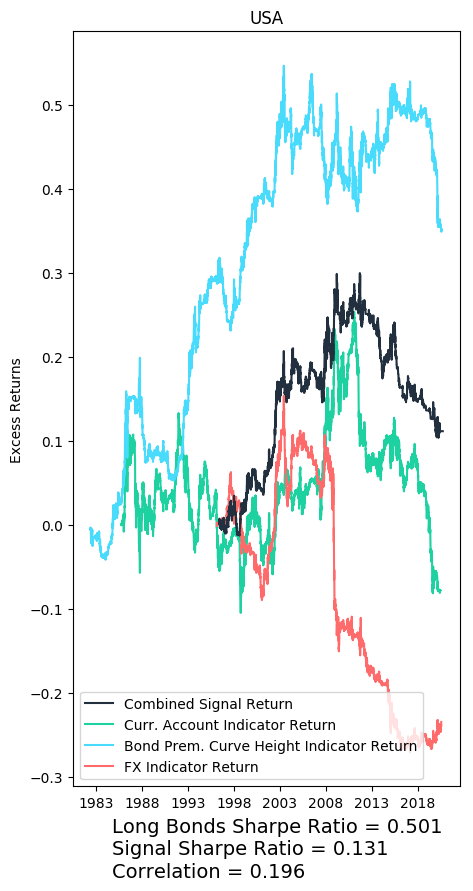

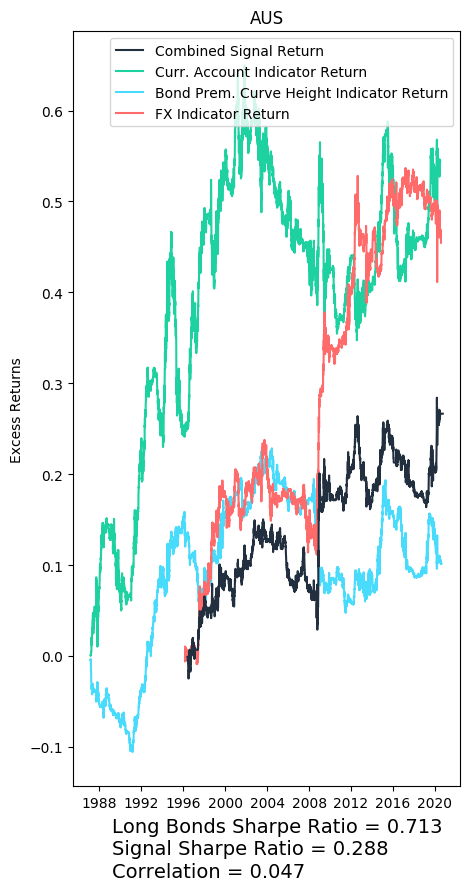

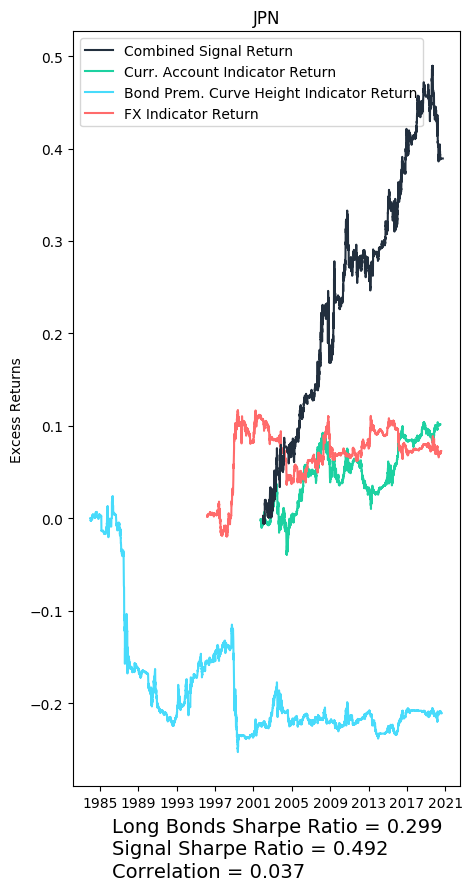

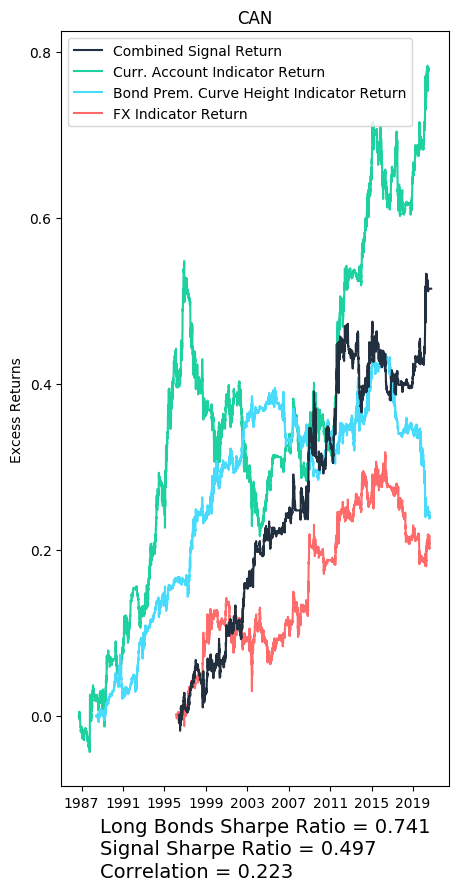

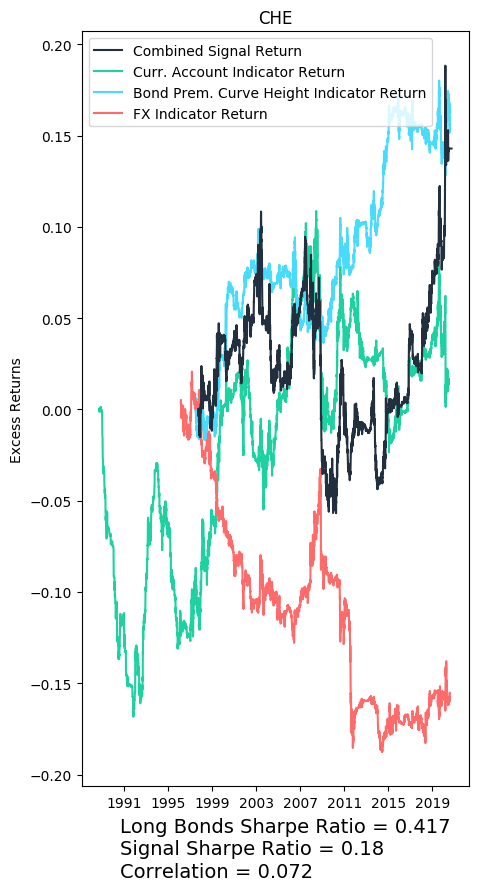

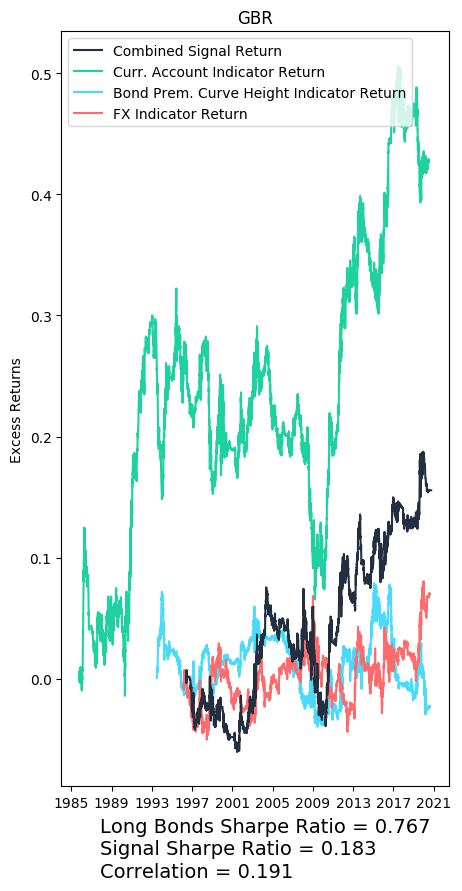

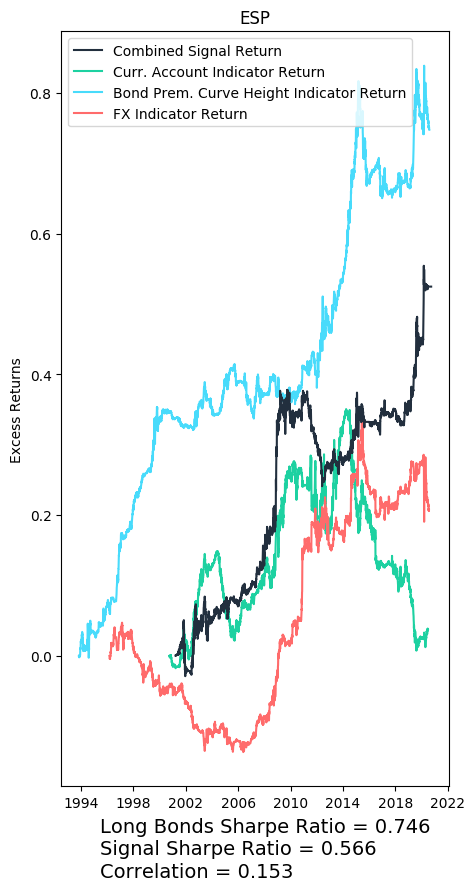

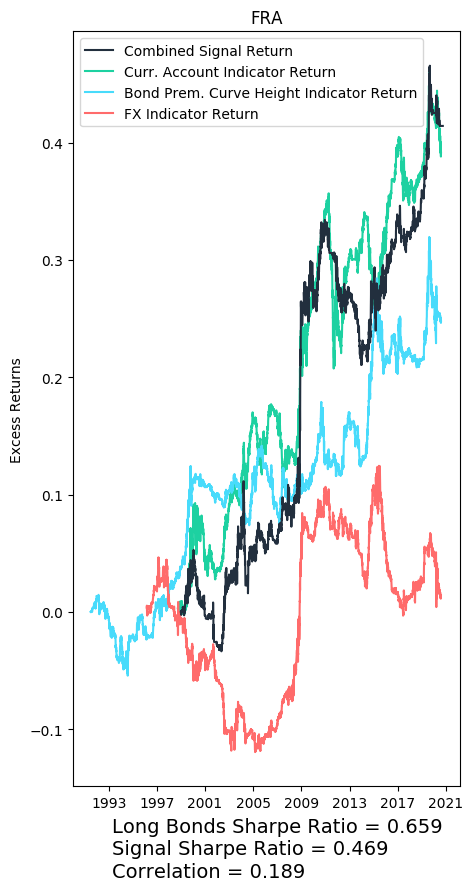

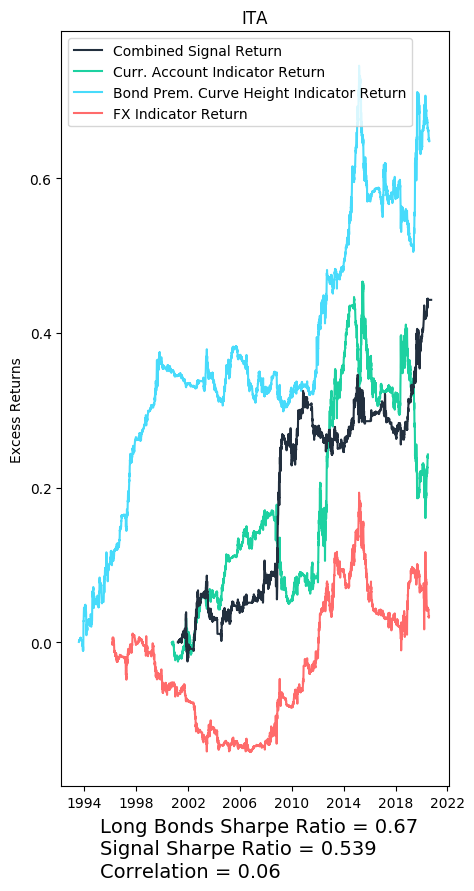

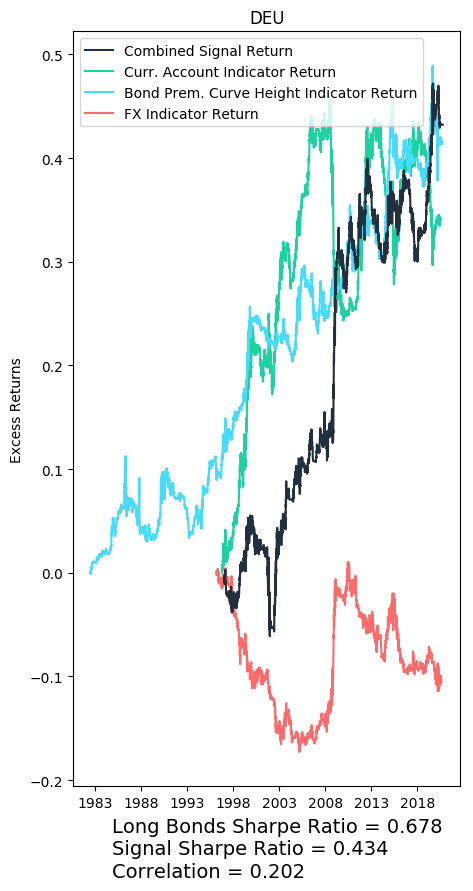

3.7794484865314346


In [94]:
## 65 (~1 quarter of 261 day year) day window for trailing Sharpe ratio calculation
total = 0
for country in comboPlots.keys():
    #print(comboPlots[country])
    s = plotCountry(comboPlotsSharpeWeighted[country], hedgedReturnsDaily[country], country, 5, 10)
    total = total + s
print(total)

# Minimum Covariance approach

In [95]:
generatedPositions = pd.DataFrame()
for country in countries:
    print("Generating weights for " + country)
    weights = generateWeightSeries(caPositions[country], bpPositions[country], fxPositions[country])
    
    generatedPositions[country] = weights['caWeights'] * caPositions[country] + weights['bpWeights'] * bpPositions[country] + weights['fxWeights'] * fxPositions[country]
    
    

Generating weights for USA


/Users/Beni15inch/.local/share/virtualenvs/Internship2020-DpN46NM0/lib/python3.6/site-packages/ipykernel_launcher.py:13: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



/Users/Beni15inch/.local/share/virtualenvs/Internship2020-DpN46NM0/lib/python3.6/site-packages/ipykernel_launcher.py:15: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




Generating weights for AUS



Generating weights for JPN



Generating weights for CAN



Generating weights for CHE



Generating weights for GBR



Generating weights for ESP



Generating weights for FRA



Generating weights for ITA



Generating weights for DEU


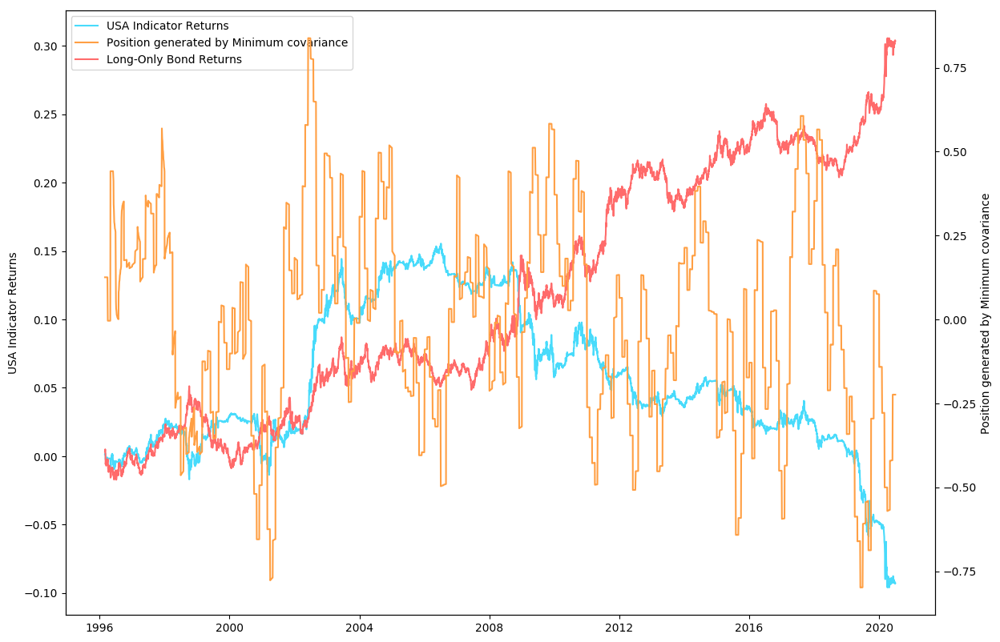

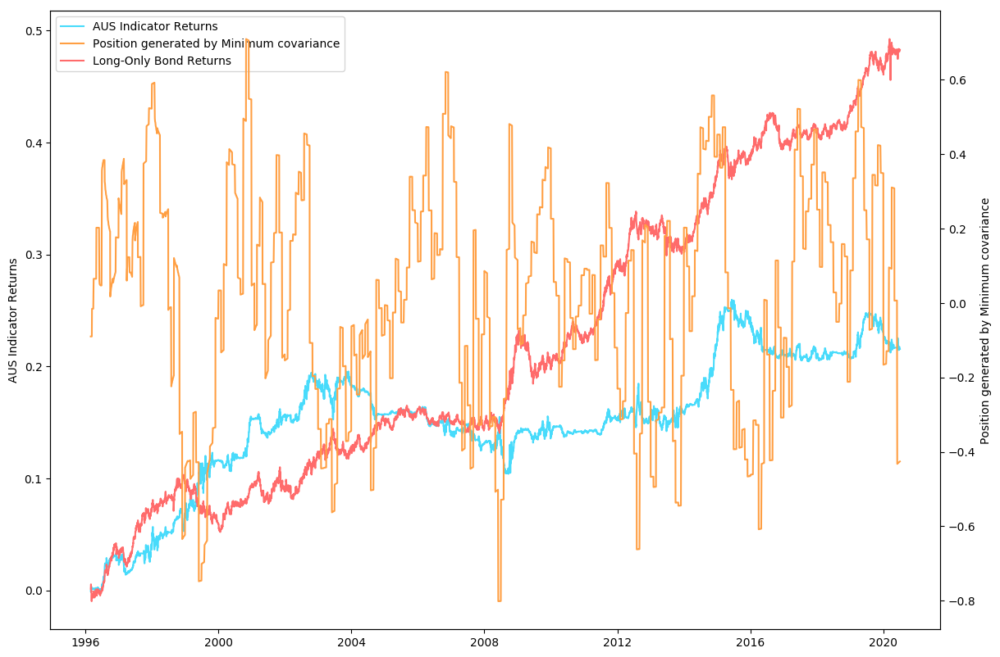

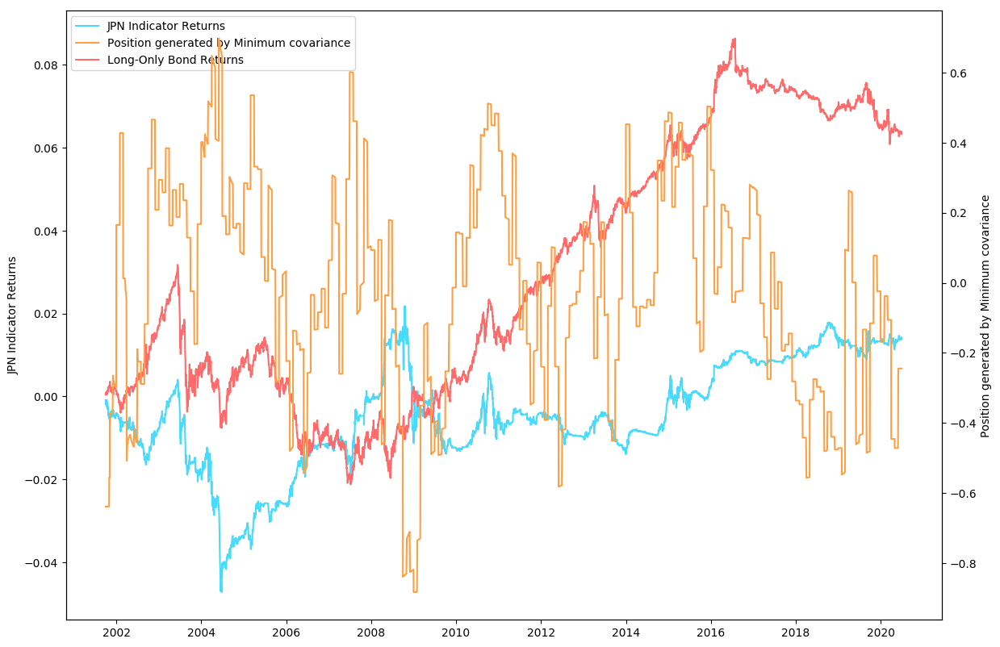

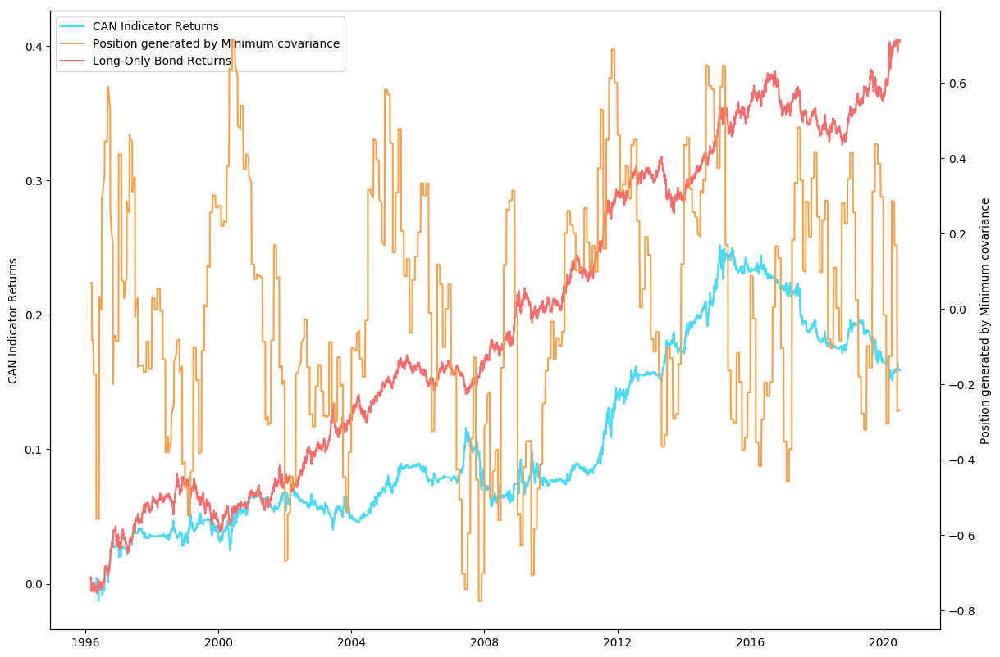

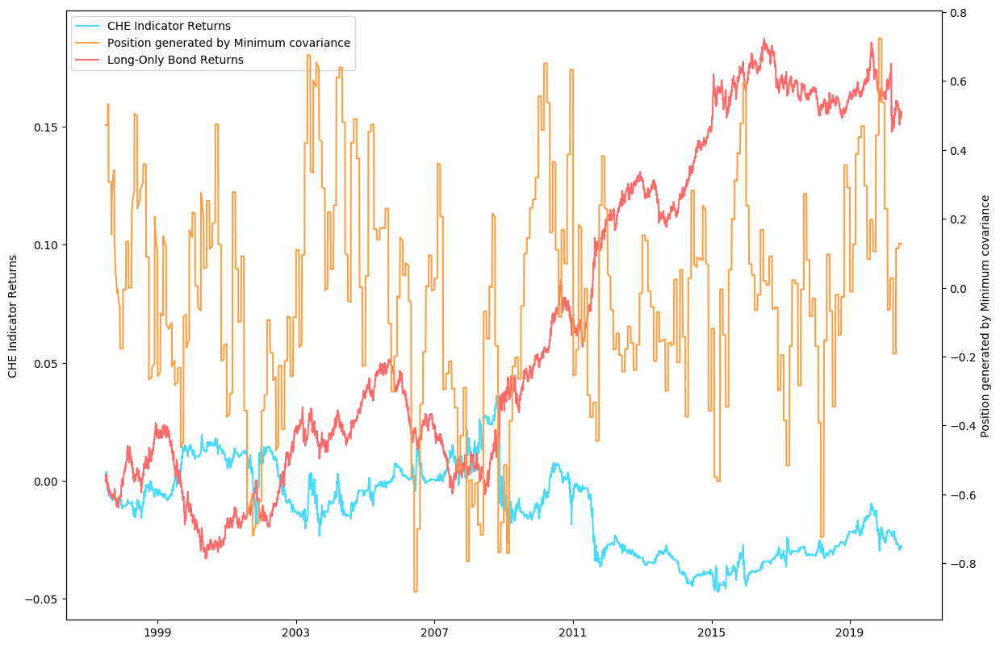

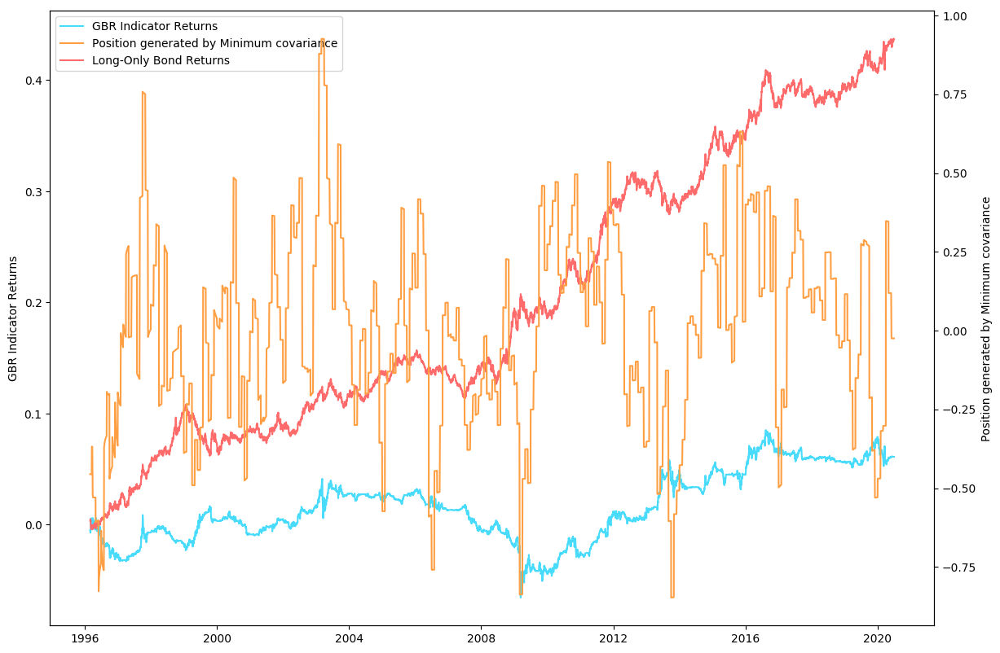

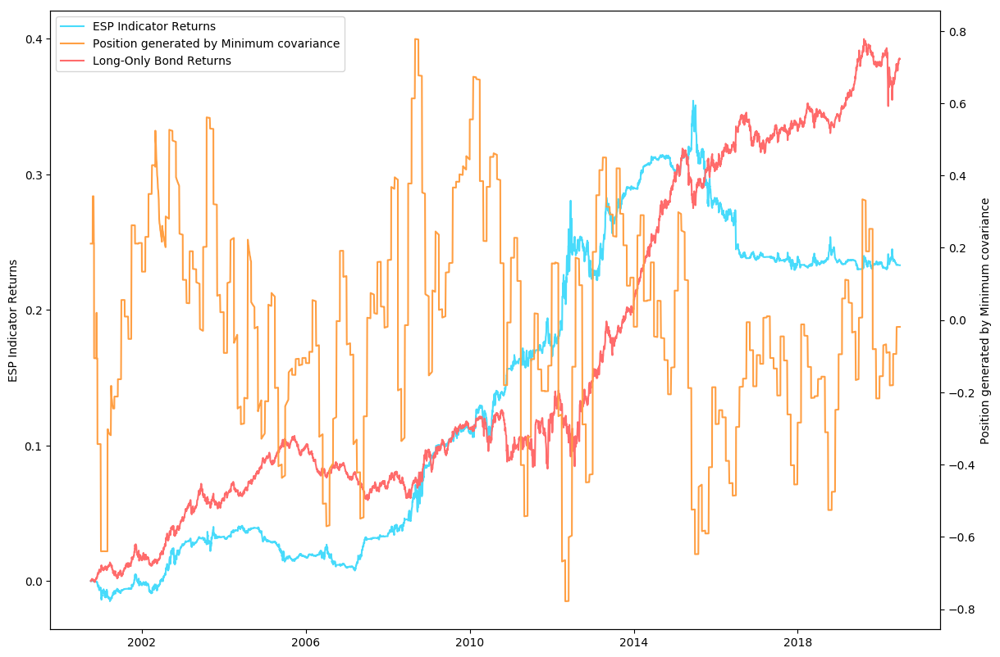

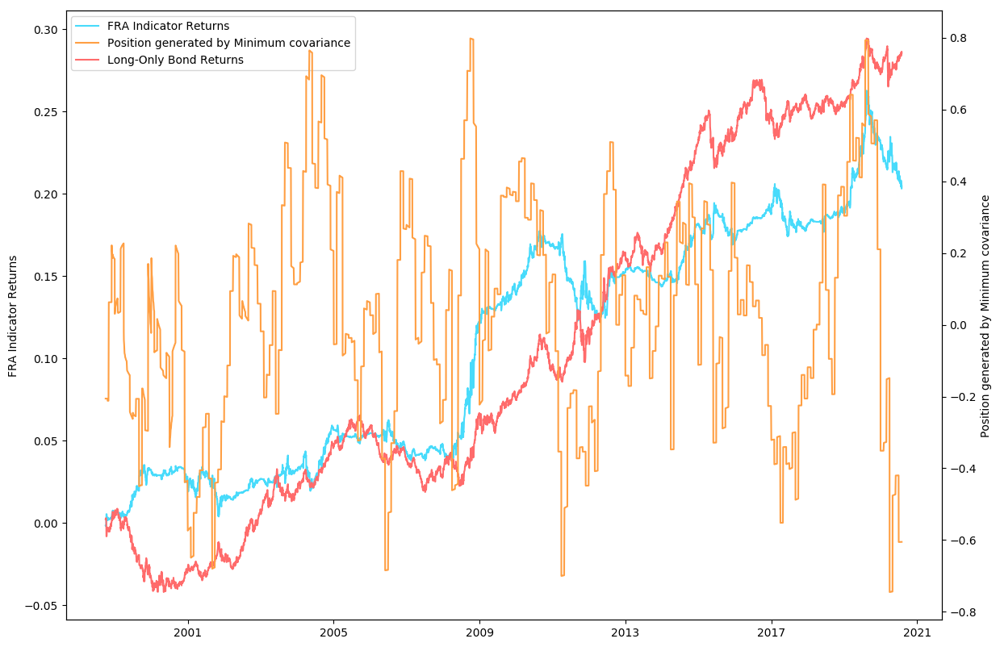

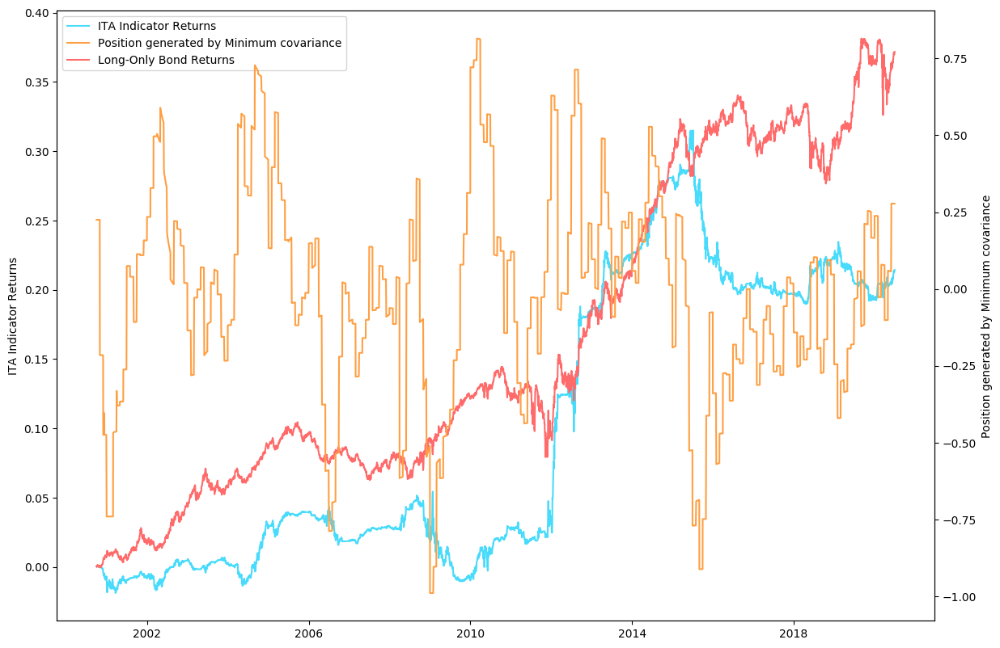

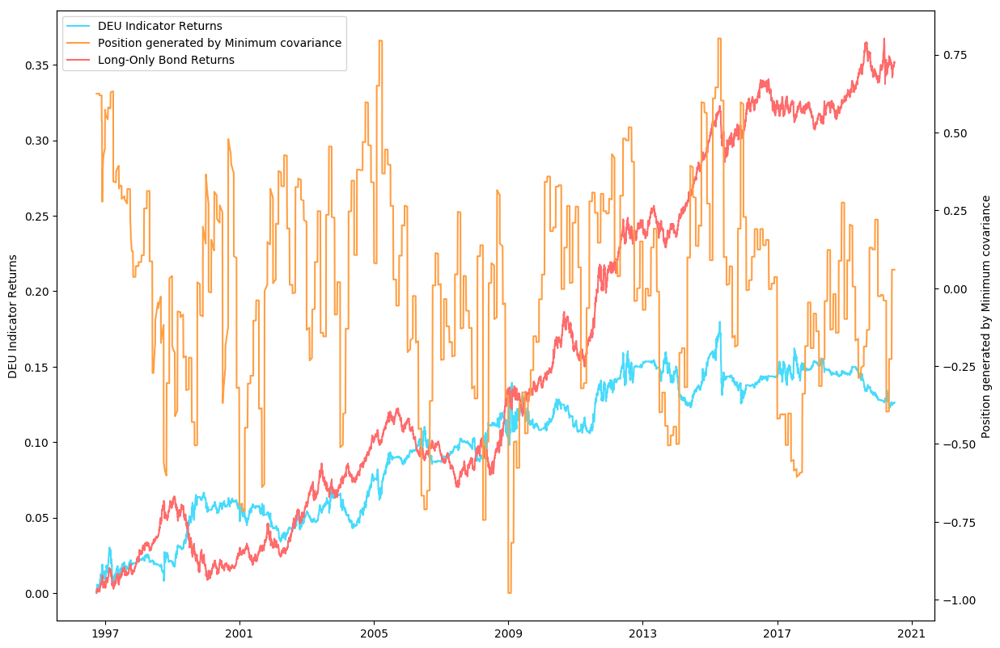

In [97]:
combinedPositions = generatedPositions
combinedReturns = combinedPositions * hedgedReturnsDaily

plotReturns("Minimum covariance", combinedPositions, combinedReturns, hedgedReturnsDaily, countries, False)
